In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import matplotlib.patches as mpatches
import matplotlib.gridspec as gridspec 
from matplotlib.offsetbox import AnchoredText
from mpl_toolkits.axes_grid1 import make_axes_locatable
import seaborn as sns
import itertools
import re
import plotly.offline as py
import plotly.figure_factory as ff
import plotly.graph_objs as go
from plotly.offline import init_notebook_mode , iplot , plot
init_notebook_mode(connected = True)
import cufflinks as cf
cf.go_offline()
from pandas import Series, DataFrame

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.impute import SimpleImputer
from sklearn.metrics import classification_report , confusion_matrix
import warnings
warnings.filterwarnings("ignore")
 


# plt.rcParams['figure.dpi'] = 200

# Tips
https://seaborn.pydata.org/generated/seaborn.boxplot.html

In [104]:
tips = sns.load_dataset("tips")
tips.head()

,total_bill,tip,sex,smoker,day,time,size
0,16.99,1.01,Female,No,Sun,Dinner,2
1,10.34,1.66,Male,No,Sun,Dinner,3
2,21.01,3.50,Male,No,Sun,Dinner,3
3,23.68,3.31,Male,No,Sun,Dinner,2
4,24.59,3.61,Female,No,Sun,Dinner,4


# Total bills

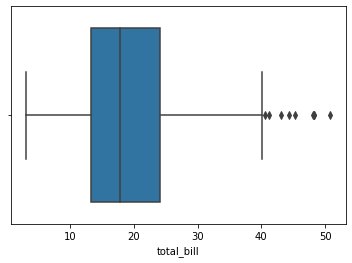

In [105]:
ax = sns.boxplot(x=tips["total_bill"]);

# Draw a vertical boxplot grouped by a categorical variable:

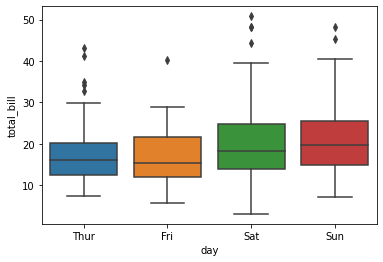

In [106]:
ax = sns.boxplot(x="day", y="total_bill", data=tips)

# Draw a boxplot with nested grouping by two categorical variables:

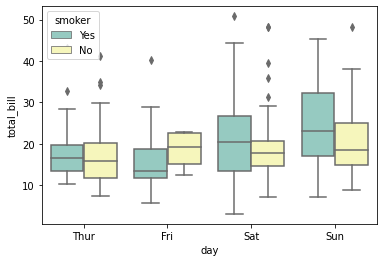

In [107]:
ax = sns.boxplot(x="day", y="total_bill", hue="smoker",
                 data=tips, palette="Set3")

# Draw a boxplot with nested grouping when some bins are empty:

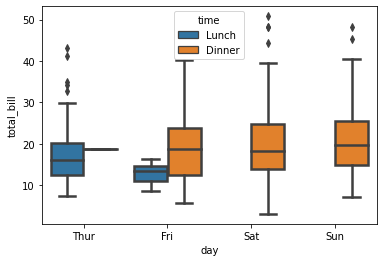

In [108]:
ax = sns.boxplot(x="day", y="total_bill", hue="time",
                 data=tips, linewidth=2.5)


# Control box order by passing an explicit order:¶

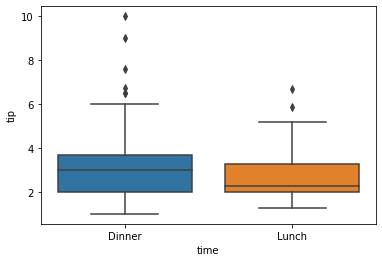

In [109]:
ax = sns.boxplot(x="time", y="tip", data=tips,
                 order=["Dinner", "Lunch"])

# Use hue without changing box position or width:


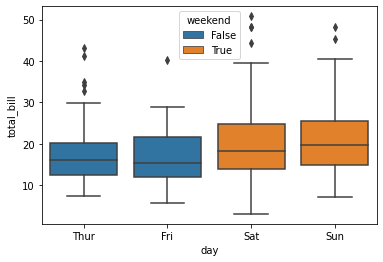

In [111]:
tips["weekend"] = tips["day"].isin(["Sat", "Sun"])
ax = sns.boxplot(x="day", y="total_bill", hue="weekend",
                 data=tips, dodge=False)

# Use swarmplot( ) to show the datapoints on top of the boxes:

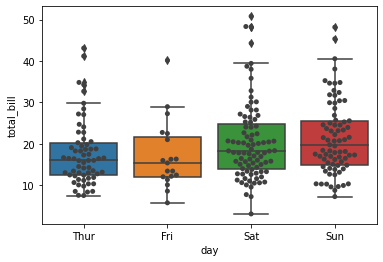

In [112]:
ax = sns.boxplot(x="day", y="total_bill", data=tips)
ax = sns.swarmplot(x="day", y="total_bill", data=tips, color=".25")

# Use catplot() to combine a boxplot() and a FacetGrid. This allows grouping within additional categorical variables. Using catplot() is safer than using FacetGrid directly, as it ensures synchronization of variable order across facets:

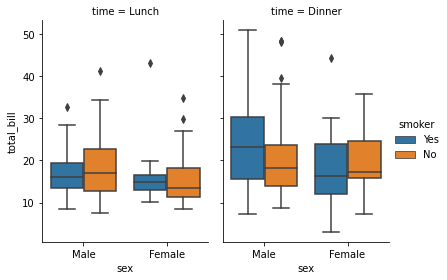

In [113]:
g = sns.catplot(x="sex", y="total_bill",
                hue="smoker", col="time",
                data=tips, kind="box",
                height=4, aspect=.7);

# Draw a set of vertical bar plots grouped by a categorical variable

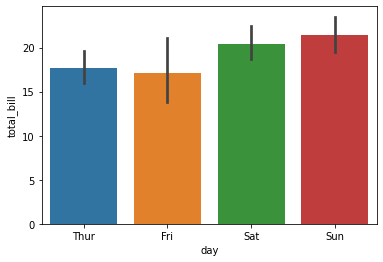

In [114]:
tips = sns.load_dataset("tips")
ax = sns.barplot(x="day", y="total_bill", data=tips)

# Draw a set of vertical bars with nested grouping by a two variables:

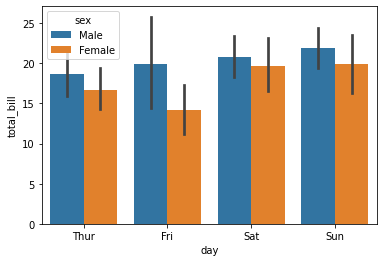

In [115]:
ax = sns.barplot(x="day", y="total_bill", hue="sex", data=tips)

# Draw a set of horizontal bars:

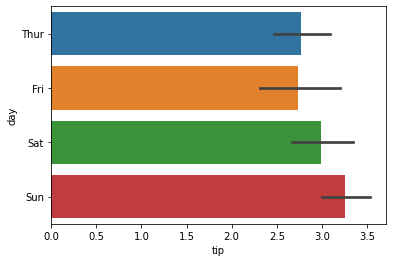

In [116]:
ax = sns.barplot(x="tip", y="day", data=tips)


# Control bar order by passing an explicit order:

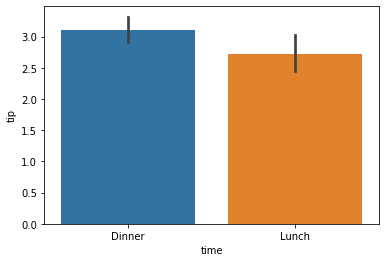

In [117]:
ax = sns.barplot(x="time", y="tip", data=tips,
                 order=["Dinner", "Lunch"])

# Use median as the estimate of central tendency:

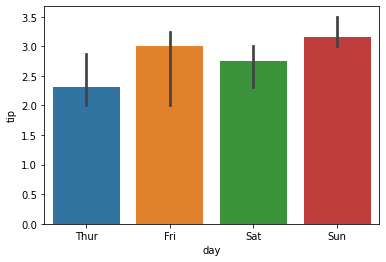

In [118]:
from numpy import median
ax = sns.barplot(x="day", y="tip", data=tips, estimator=median)

# Show the standard error of the mean with the error bars:

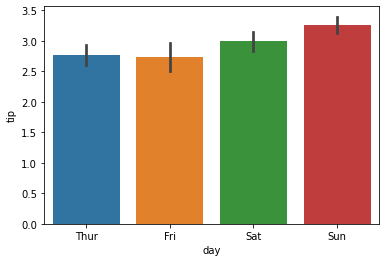

In [119]:
ax = sns.barplot(x="day", y="tip", data=tips, ci=68)

# Show standard deviation of observations instead of a confidence interval:

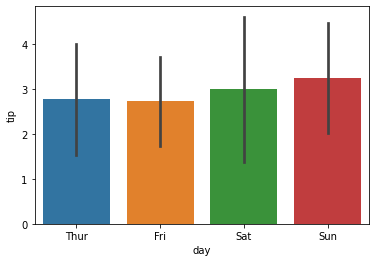

In [120]:
ax = sns.barplot(x="day", y="tip", data=tips, ci="sd")

# Add “caps” to the error bars:

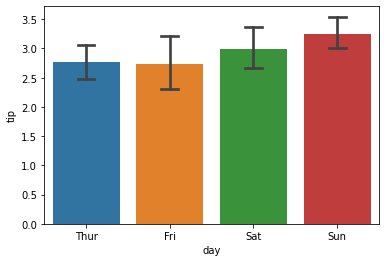

In [121]:
ax = sns.barplot(x="day", y="tip", data=tips, capsize=.2)

# Use a different color palette for the bars:

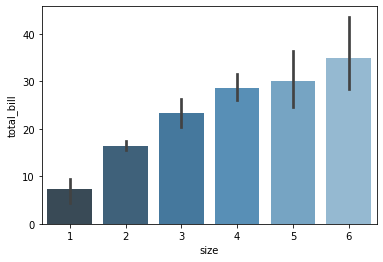

In [122]:
ax = sns.barplot(x="size", y="total_bill", data=tips,
                 palette="Blues_d")

# Use hue without changing bar position or width:


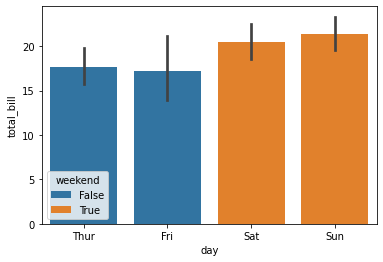

In [123]:
tips["weekend"] = tips["day"].isin(["Sat", "Sun"])
ax = sns.barplot(x="day", y="total_bill", hue="weekend",
                 data=tips, dodge=False)

# Plot all bars in a single color:

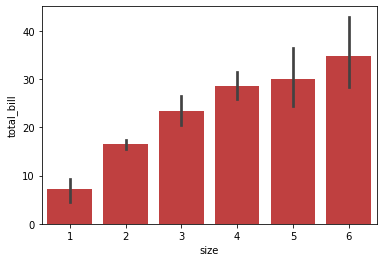

In [124]:
ax = sns.barplot(x="size", y="total_bill", data=tips,
                 color="red", saturation=.5)

# Use matplotlib.axes.Axes.bar() parameters to control the style.

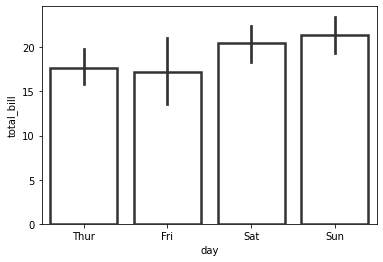

In [125]:
ax = sns.barplot(x="day", y="total_bill", data=tips,
                 linewidth=2.5, facecolor=(1, 1, 1, 0),
                 errcolor=".2", edgecolor=".2")


# Use catplot() to combine a barplot() and a FacetGrid. This allows grouping within additional categorical variables. Using catplot() is safer than using FacetGrid directly, as it ensures synchronization of variable order across facets:¶


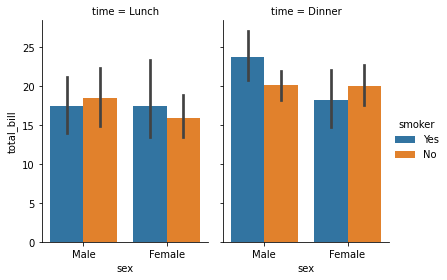

In [126]:
g = sns.catplot(x="sex", y="total_bill",
                hue="smoker", col="time",
                data=tips, kind="bar",
                height=4, aspect=.7);

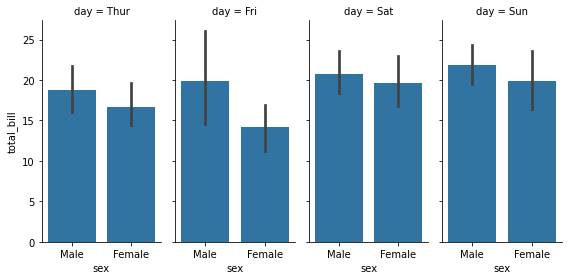

In [128]:
g = sns.FacetGrid(tips, col="day", height=4, aspect=.5)
g.map(sns.barplot, "sex", "total_bill", order=["Male", "Female"]);

# Iris Data

# Draw a boxplot for each numeric variable in a DataFrame:

In [172]:
iris = sns.load_dataset("iris")


,sepal_length,sepal_width,petal_length,petal_width,species
0,5.1,3.5,1.4,0.2,setosa
1,4.9,3.0,1.4,0.2,setosa
2,4.7,3.2,1.3,0.2,setosa
3,4.6,3.1,1.5,0.2,setosa
4,5.0,3.6,1.4,0.2,setosa


In [173]:
iris.describe()

,sepal_length,sepal_width,petal_length,petal_width
count,150.000000,150.000000,150.000000,150.000000
mean,5.843333,3.057333,3.758000,1.199333
std,0.828066,0.435866,1.765298,0.762238
min,4.300000,2.000000,1.000000,0.100000
25%,5.100000,2.800000,1.600000,0.300000
50%,5.800000,3.000000,4.350000,1.300000
75%,6.400000,3.300000,5.100000,1.800000
max,7.900000,4.400000,6.900000,2.500000


In [174]:
print(iris.groupby('species').size())

species
setosa        50
versicolor    50
virginica     50
dtype: int64


# Visualisations

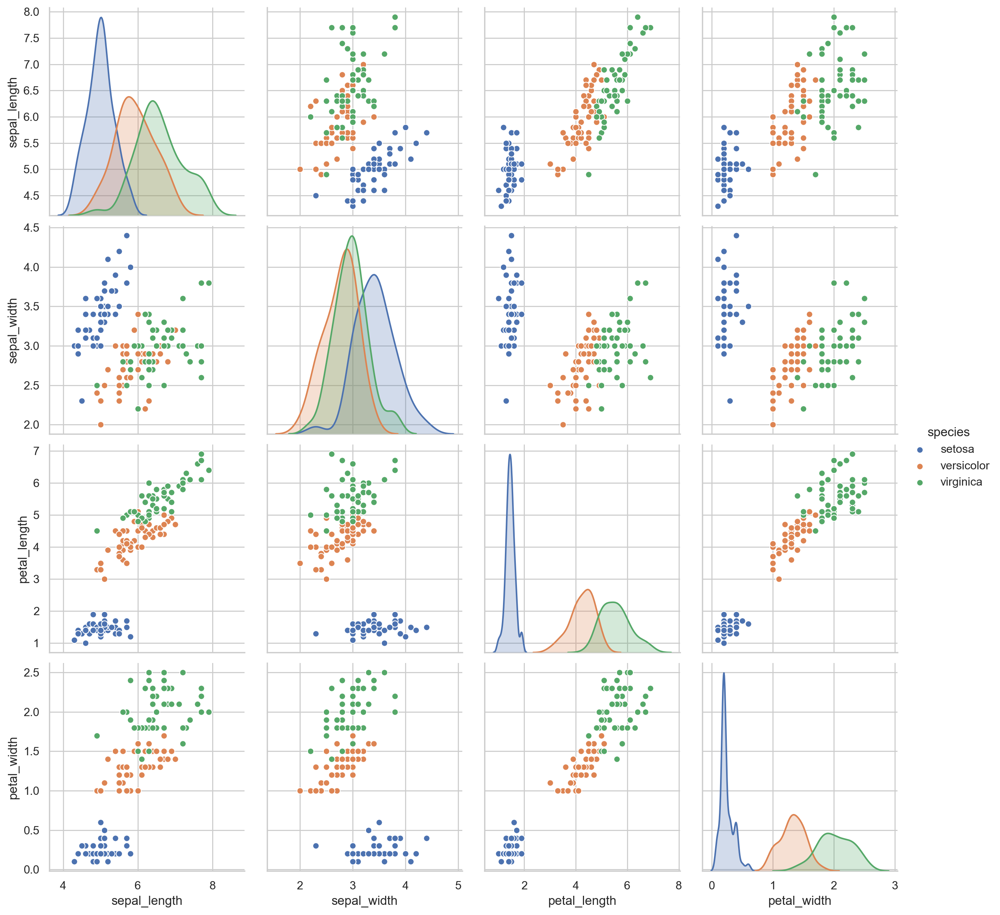

In [176]:
sns.pairplot(iris, hue='species', size=3, aspect=1);

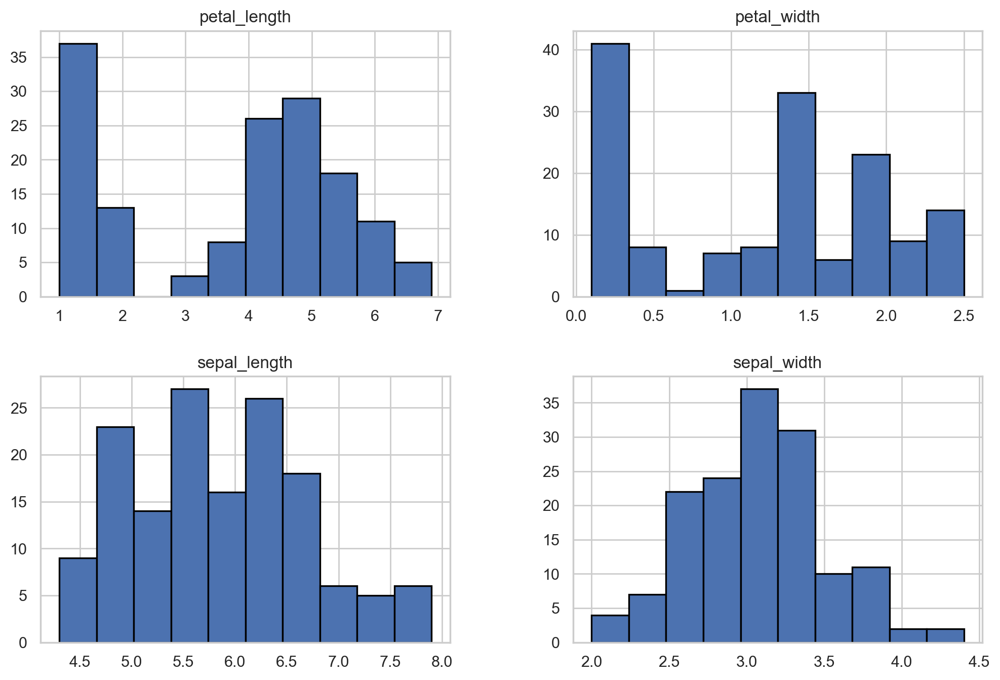

In [177]:
iris.hist(edgecolor='black', linewidth=1.2, figsize=(12,8));
plt.show()

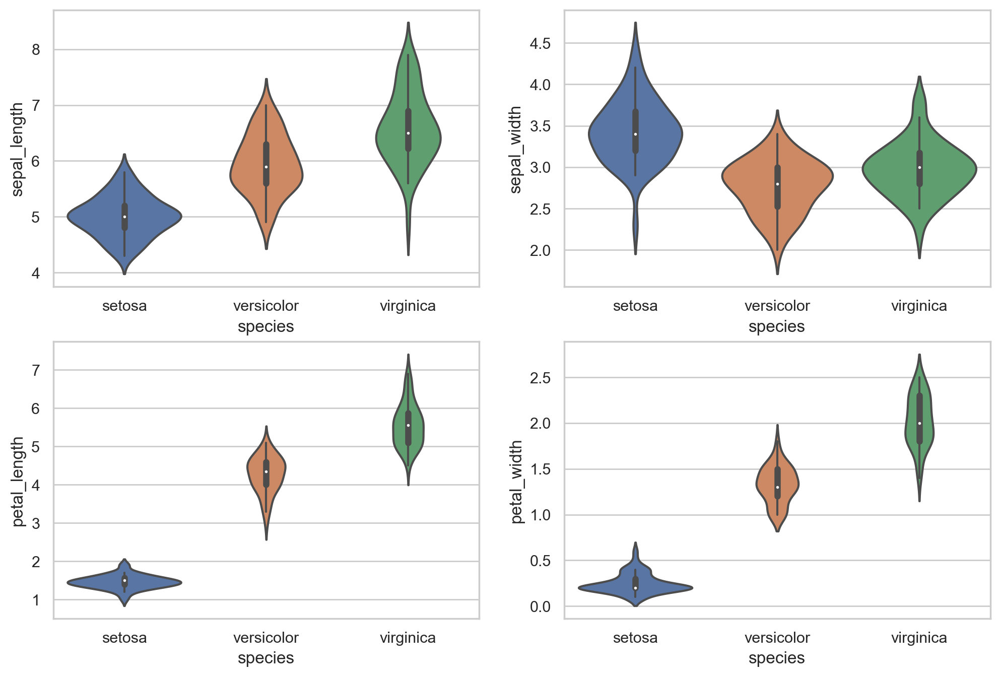

In [178]:
plt.figure(figsize=(12,8));
plt.subplot(2,2,1)
sns.violinplot(x='species', y='sepal_length', data=iris)
plt.subplot(2,2,2)
sns.violinplot(x='species', y='sepal_width', data=iris)
plt.subplot(2,2,3)
sns.violinplot(x='species', y='petal_length', data=iris)
plt.subplot(2,2,4)
sns.violinplot(x='species', y='petal_width', data=iris);


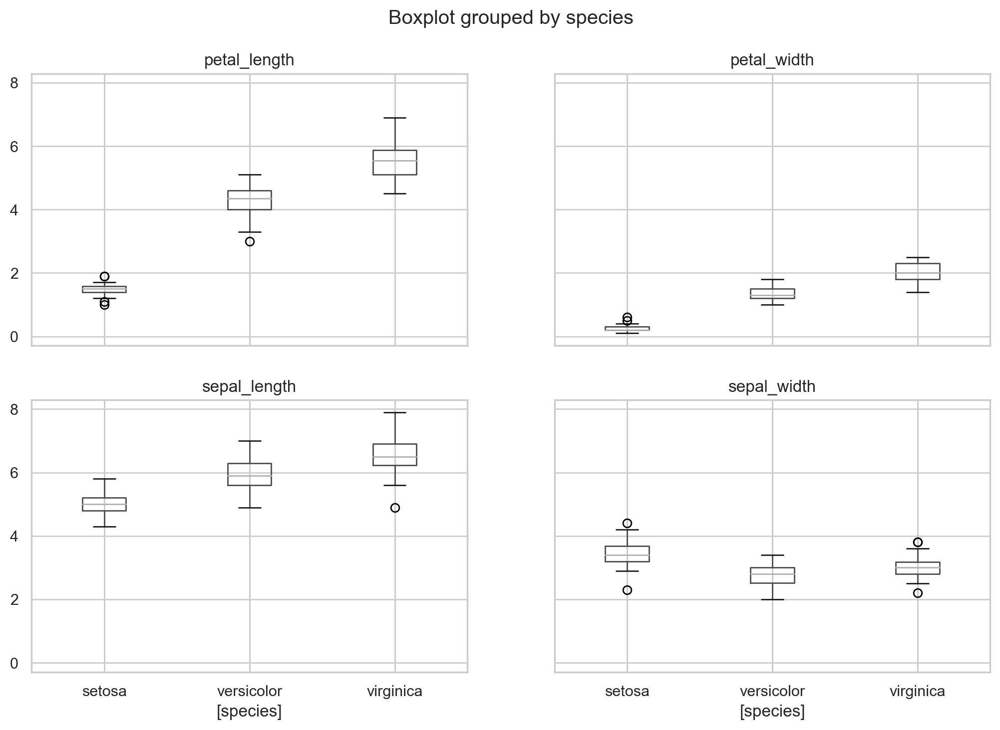

In [179]:
iris.boxplot(by='species', figsize=(12,8));

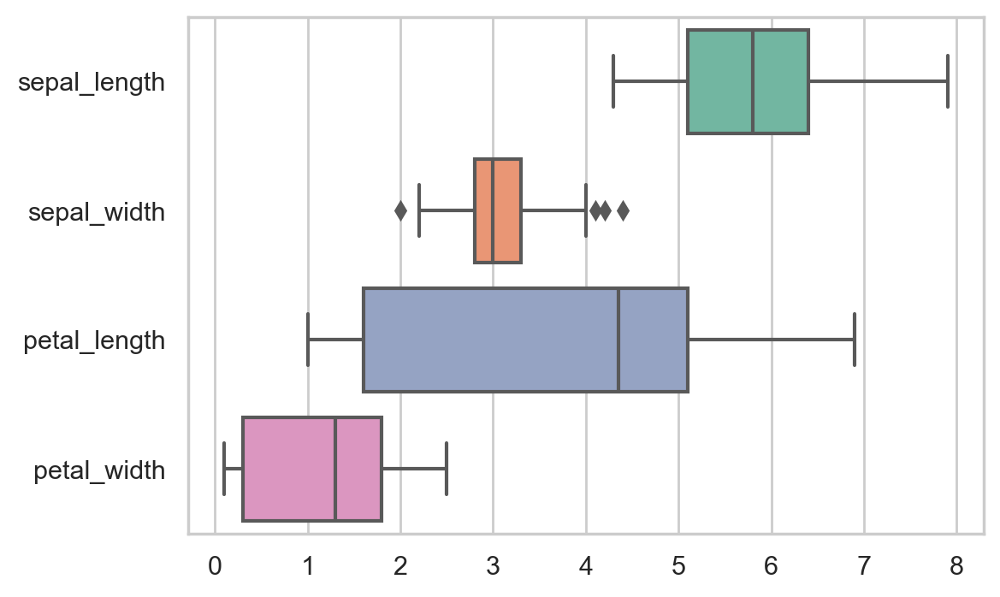

In [175]:
ax = sns.boxplot(data=iris, orient="h", palette="Set2")

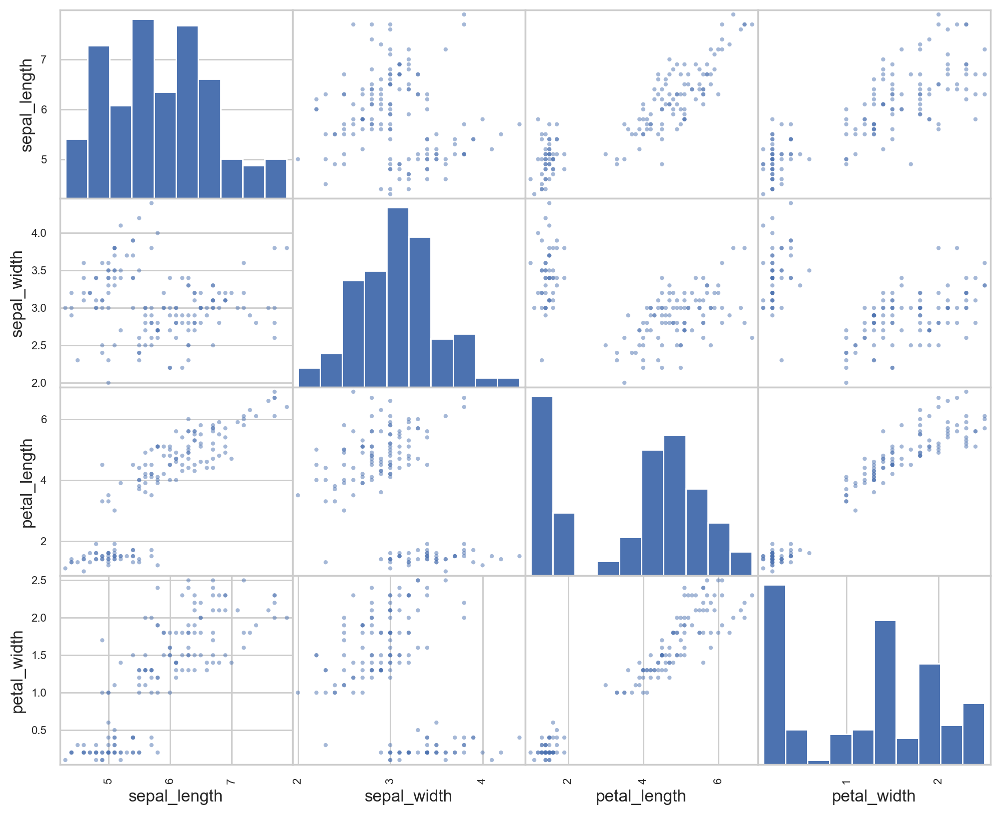

In [180]:
pd.plotting.scatter_matrix(iris, figsize=(12,10))
plt.show()

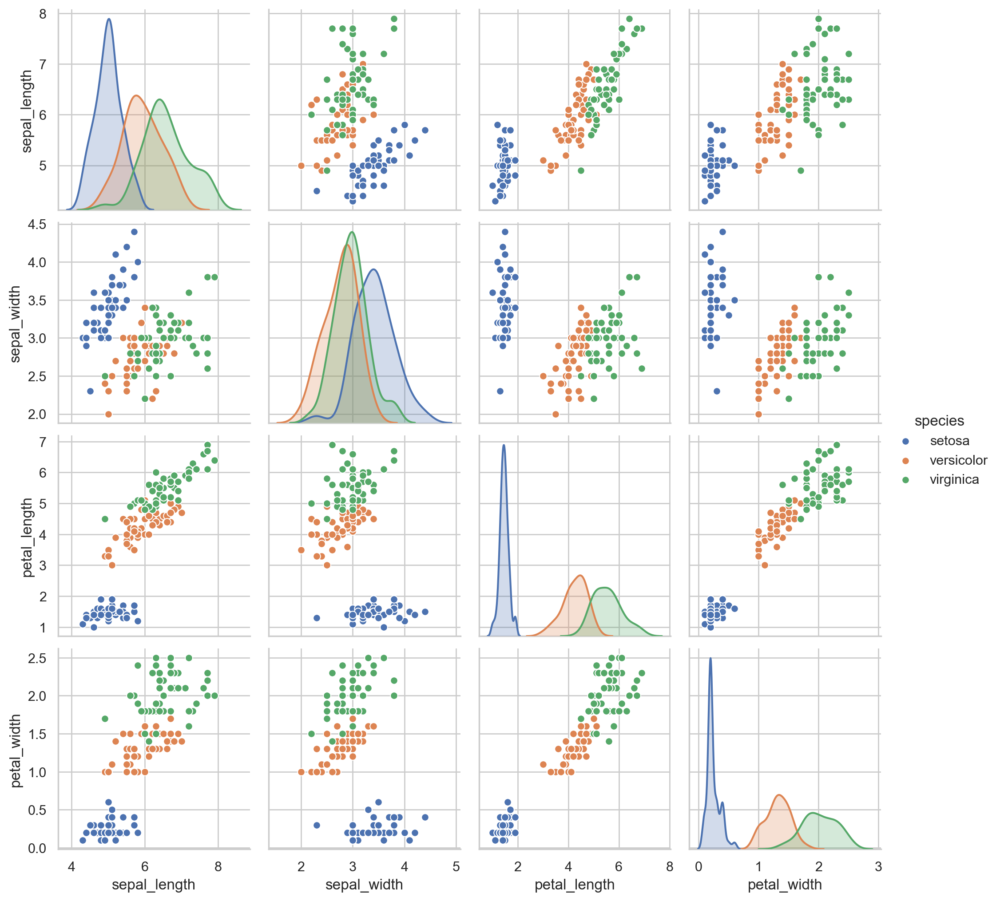

In [181]:
sns.pairplot(iris, hue="species",diag_kind="kde");

# Causes of Death

In [2]:
import os

In [3]:
df = pd.read_csv('../../../data/causes_of_death.tsv', delimiter = '\t')
df.head()

,Notes,State,State Code,Ten-Year Age Groups,Ten-Year Age Groups Code,Gender,Gender Code,Race,Race Code,Deaths,Population,Crude Rate
0,NaN,Alabama,1,< 1 year,1,Female,F,American Indian or Alaska Native,1002-5,14,3579,Unreliable
1,NaN,Alabama,1,< 1 year,1,Female,F,Asian or Pacific Islander,A-PI,24,7443,322.5
2,NaN,Alabama,1,< 1 year,1,Female,F,Black or African American,2054-5,2093,169339,1236.0
3,NaN,Alabama,1,< 1 year,1,Female,F,White,2106-3,2144,347921,616.2
4,NaN,Alabama,1,< 1 year,1,Male,M,Asian or Pacific Islander,A-PI,33,7366,448.0


# Let's look at Gender column

In [71]:
df['Gender'].value_counts(normalize=True)

Male      0.5113
Female    0.4887
Name: Gender, dtype: float64

+ %51% are Male and 48% are female

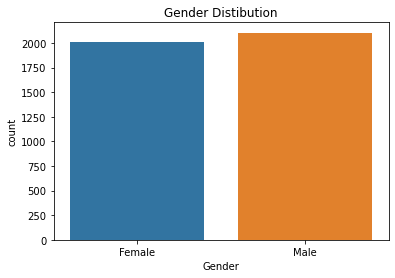

In [74]:
# Plot for the above
sns.countplot(df['Gender'])
fig = plt.gcf()
plt.title('Gender Distibution')
plt.show()

# Plot the above distribution with a Pie Chart

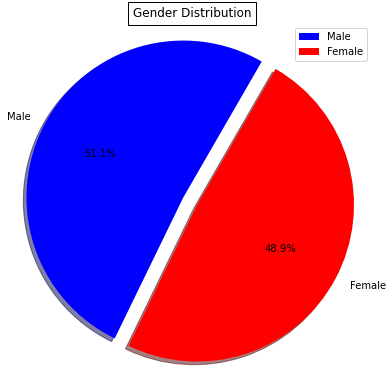

In [72]:

gen_val = ["Male","Female"]
gender = df["Gender"].value_counts()

gender = gender.astype(float)
fig = plt.figure(figsize=(10,5))
ax = fig.add_axes((0,0,0.5,1))
ax.set_title("Gender Distribution" , bbox = {"facecolor":"white" , "pad":5})
labels = "Male" , "Female"
colors = ["blue" , "red"]
explode = (0.1, 0)
plt.pie(gender, explode=explode, labels=labels , colors=colors , 
        autopct = "%1.1f%%" , shadow= True,startangle=60)
plt.legend(labels = gen_val)
plt.axis("equal")
plt.show()

## Let's have a look at our States

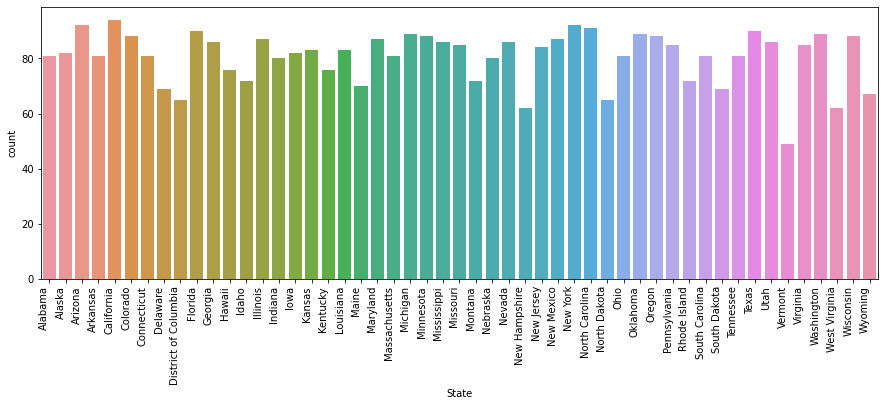

In [73]:
plt.subplots(figsize=(15,5))
s=sns.countplot(df.State)
s.set_xticklabels(s.get_xticklabels(),rotation=90,horizontalalignment='right')
plt.show()

### 1) Create a bar chart of the total number of deaths by state.
* Sort your columns in order (ascending or descending are both acceptable).  
* Also make sure to include a title, axes labels and have your graph be an appropriate size.

**_NOTE:_** In order to do this, slice the `Deaths` column after the `.groupby()` method, but before the `sum()` method.  You can even chain the `.plot()` call on after the `sum()` call and do this all on one line, excluding the labeling of the graph!

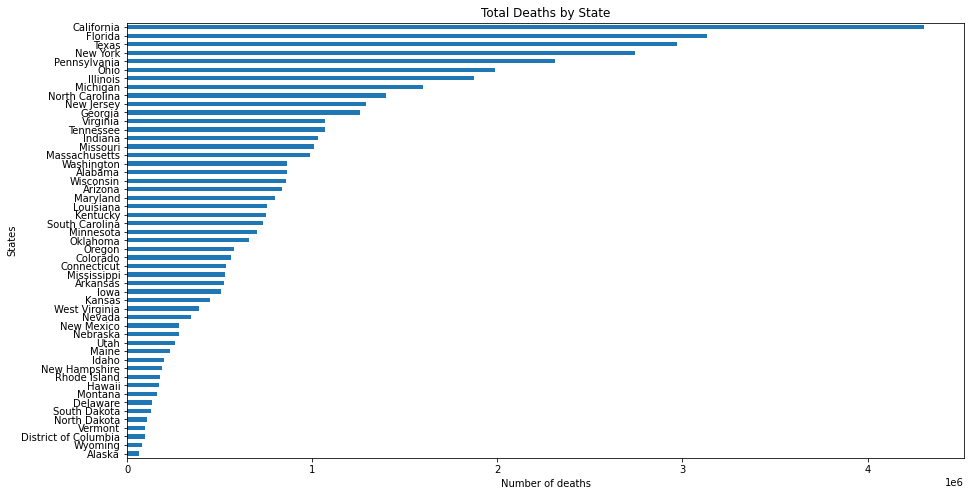

In [56]:
df.groupby(['State'])['Deaths'].sum().sort_values().plot(kind='barh', figsize=(15,8))
plt.title('Total Deaths by State')
plt.xlabel('Number of deaths')
plt.ylabel('States')
plt.show()

### 2) Complete the Bar Chart

Now that we've reformatted our data, let's create a bar chart of the Mean Population by State.

In [60]:
df['Population'].dtypes

dtype('O')

In [62]:
to_drop = df[df['Population'] == 'Not Applicable']
df.drop(to_drop.index, axis=0 , inplace=True)

In [63]:
# Let's convert population to integers as its an object at this moment
df['Population'] = df['Population'].map(lambda x: int(x))

Text(0, 0.5, 'States')

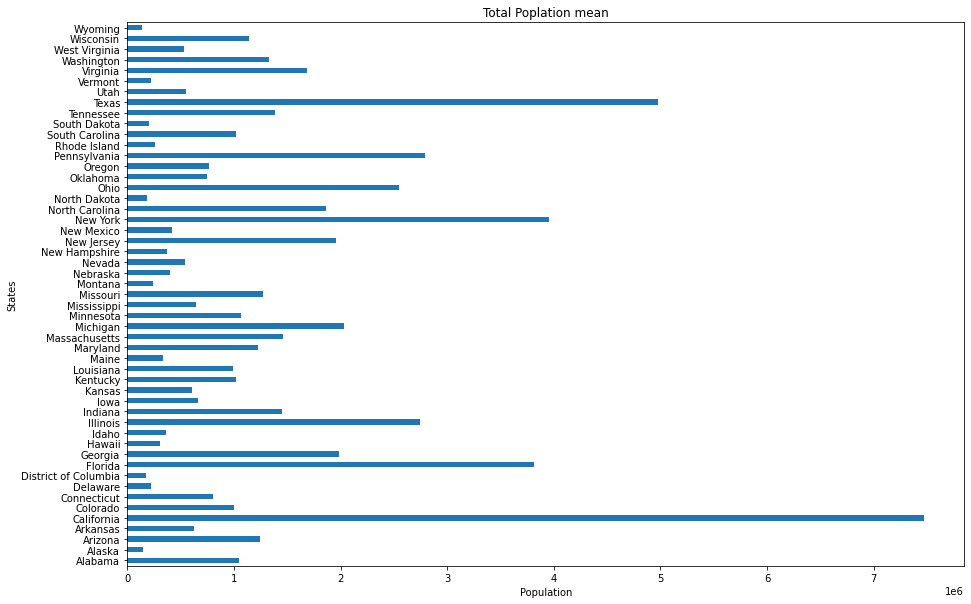

In [64]:
df.groupby(['State'])['Population'].mean().plot(kind='barh', figsize=(15,10))
plt.title('Total Poplation mean')
plt.xlabel('Population')
plt.ylabel('States')

## Kiva Loans Data

In [4]:
# Load in kiva_loans.csv as df
data = pd.read_csv("../../../data/kiva_loans.csv")
data.head()

,id,funded_amount,loan_amount,activity,sector,use,country_code,country,region,currency,partner_id,posted_time,disbursed_time,funded_time,term_in_months,lender_count,tags,borrower_genders,repayment_interval,date
0,653051,300.0,300.0,Fruits & Vegetables,Food,"To buy seasonal, fresh fruits to sell.",PK,Pakistan,Lahore,PKR,247.0,2014-01-01 06:12:39+00:00,2013-12-17 08:00:00+00:00,2014-01-02 10:06:32+00:00,12.0,12,NaN,female,irregular,2014-01-01
1,653053,575.0,575.0,Rickshaw,Transportation,to repair and maintain the auto rickshaw used ...,PK,Pakistan,Lahore,PKR,247.0,2014-01-01 06:51:08+00:00,2013-12-17 08:00:00+00:00,2014-01-02 09:17:23+00:00,11.0,14,NaN,"female, female",irregular,2014-01-01
2,653068,150.0,150.0,Transportation,Transportation,To repair their old cycle-van and buy another ...,IN,India,Maynaguri,INR,334.0,2014-01-01 09:58:07+00:00,2013-12-17 08:00:00+00:00,2014-01-01 16:01:36+00:00,43.0,6,"user_favorite, user_favorite",female,bullet,2014-01-01
3,653063,200.0,200.0,Embroidery,Arts,to purchase an embroidery machine and a variet...,PK,Pakistan,Lahore,PKR,247.0,2014-01-01 08:03:11+00:00,2013-12-24 08:00:00+00:00,2014-01-01 13:00:00+00:00,11.0,8,NaN,female,irregular,2014-01-01
4,653084,400.0,400.0,Milk Sales,Food,to purchase one buffalo.,PK,Pakistan,Abdul Hakeem,PKR,245.0,2014-01-01 11:53:19+00:00,2013-12-17 08:00:00+00:00,2014-01-01 19:18:51+00:00,14.0,16,NaN,female,monthly,2014-01-01


# Load in the themes data as themes

In [5]:
themes = "../../../data/loan_theme_ids.csv"
themes

'../../../data/loan_theme_ids.csv'

In [6]:
themes = pd.read_csv('../../../data/loan_theme_ids.csv')
themes.head()

,id,Loan Theme ID,Loan Theme Type,Partner ID
0,638631,a1050000000skGl,General,151.0
1,640322,a1050000000skGl,General,151.0
2,641006,a1050000002X1ij,Higher Education,160.0
3,641019,a1050000002X1ij,Higher Education,160.0
4,641594,a1050000002VbsW,Subsistence Agriculture,336.0


# Merge the themes file with the data file

In [24]:
merger = pd.merge(data, themes, on='id')
merger.head(3)

,id,funded_amount,loan_amount,activity,sector,use,country_code,country,region,currency,...,funded_time,term_in_months,lender_count,tags,borrower_genders,repayment_interval,date,Loan Theme ID,Loan Theme Type,Partner ID
0,653053,575.0,575.0,Rickshaw,Transportation,to repair and maintain the auto rickshaw used ...,PK,Pakistan,Lahore,PKR,...,2014-01-02 09:17:23+00:00,11.0,14,NaN,"female, female",irregular,2014-01-01,a1050000000sjEC,Underserved,247.0
1,653068,150.0,150.0,Transportation,Transportation,To repair their old cycle-van and buy another ...,IN,India,Maynaguri,INR,...,2014-01-01 16:01:36+00:00,43.0,6,"user_favorite, user_favorite",female,bullet,2014-01-01,a1050000002VkWz,Underserved,334.0
2,653063,200.0,200.0,Embroidery,Arts,to purchase an embroidery machine and a variet...,PK,Pakistan,Lahore,PKR,...,2014-01-01 13:00:00+00:00,11.0,8,NaN,female,irregular,2014-01-01,a1050000000sjEC,Underserved,247.0


# Let's Look at the countires in the dataframe

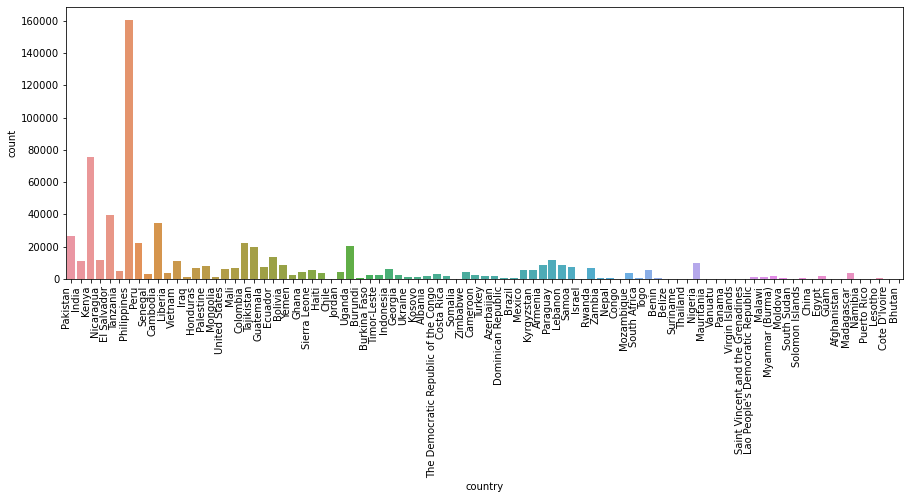

In [87]:
plt.subplots(figsize=(15,5))
s=sns.countplot(merger.country)
s.set_xticklabels(s.get_xticklabels(),rotation=90,horizontalalignment='right')
plt.show()

# Let's Choose USA as the country we want to look at

In [88]:
df_usa = merger[merger['country'] == 'United States']

# Show the counts of observations in each categorical bin using bars.

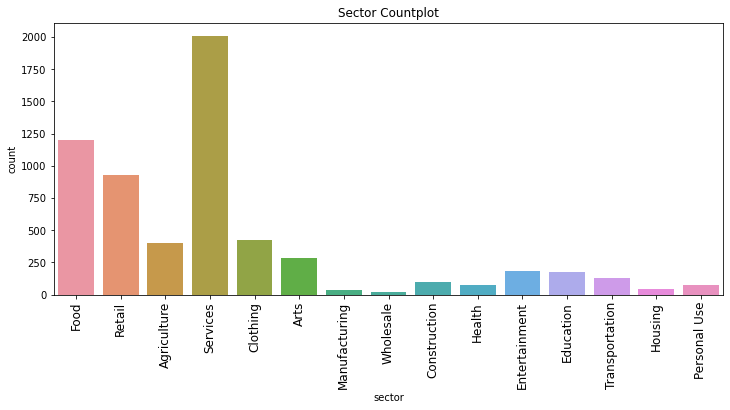

In [89]:
plt.figure(figsize=(12,5)) # Create a new figure
plt.title('Sector Countplot')
plt.xticks(rotation=90,fontsize=12)
sns.countplot(x='sector',data= df_usa)
plt.show()

# Violin plot

 + A violinplot shows the distribution of quantitative data across several 
 levels of one categorical variables such that those distributions can be compared

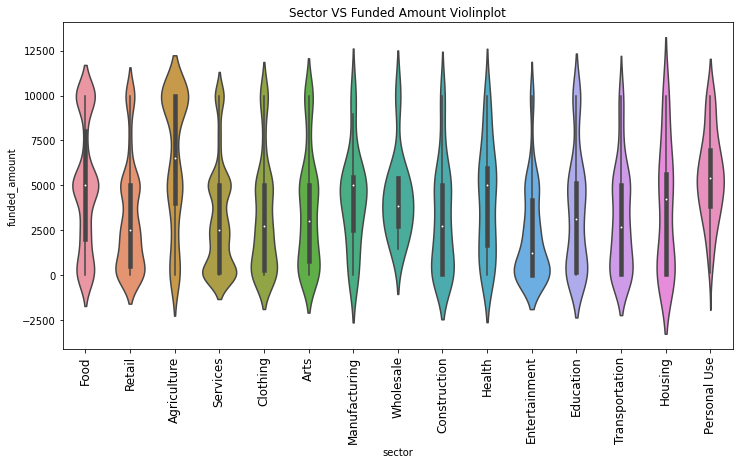

In [90]:
plt.figure(figsize=(12,6)) # Create a new figure
plt.title('Sector VS Funded Amount Violinplot')
plt.xticks(rotation=90,fontsize=12)
sns.violinplot(x='sector',y='funded_amount',data=df_usa);

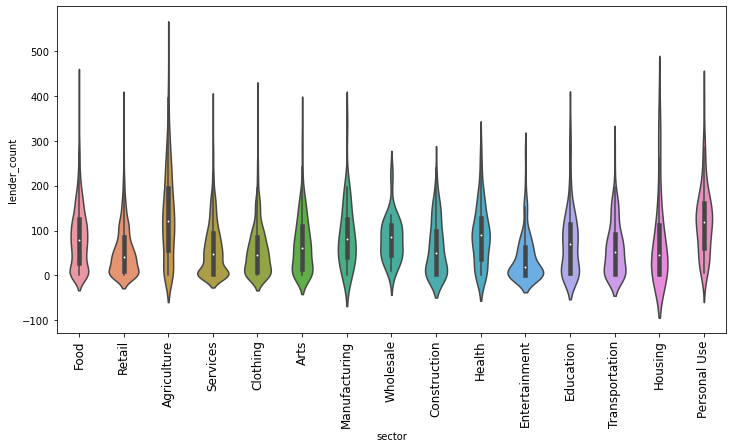

In [92]:
plt.figure(figsize=(12,6)) # Create a new figure
plt.xticks(rotation=90,fontsize=12)
sns.violinplot(x='sector',y='lender_count',data=df_usa);

# Boxplot

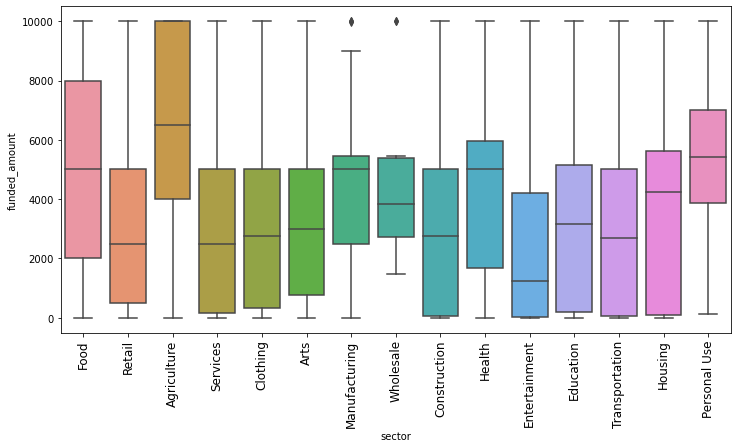

In [93]:
# Distribution of funded amount within sectors
plt.figure(figsize=(12,6)) # Create a new figure
plt.xticks(rotation=90,fontsize=12)
sns.boxplot(x="sector", y="funded_amount", data=df_usa);

In [ ]:
# Top Regions with the highest amount of loans

Top Cities 15 with the highest amount of loans


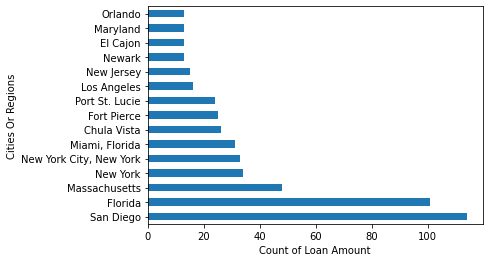

In [99]:
df_usa['region'].value_counts().head(15).plot(kind='barh')
plt.xlabel('Count of Loan Amount')
plt.ylabel('Cities Or Regions')
print("Top Cities 15 with the highest amount of loans")

# We can improve on the above this way

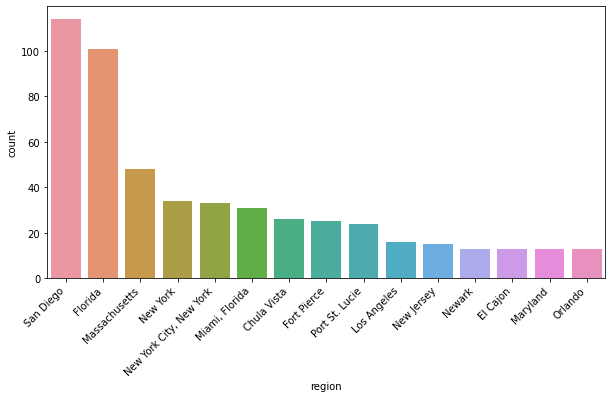

In [102]:
plt.figure(figsize = (10, 5))
ax = sns.countplot(x= "region" ,data = df_usa, 
              order = df_usa['region'].value_counts().iloc[:15].index)
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='right');
plt.show()

# Chocolate Flavours Data

In [7]:
path = '../../../data/flavors_of_cacao.csv'  # this is the location of my data in my directory
data = pd.read_csv(path)
data.head()

col_names = ["Company",
"Bean_Origin",
"REF",
"Review_Date",
"Cocoa_Percent",
"Company_Location",
"Rating",
"Bean_Type",
"Broad_Bean_Origin"]

choco_data = pd.read_csv(path , names = col_names , header=0)
choco_data.head()

,Company,Bean_Origin,REF,Review_Date,Cocoa_Percent,Company_Location,Rating,Bean_Type,Broad_Bean_Origin
0,A. Morin,Agua Grande,1876,2016,63%,France,3.75,,Sao Tome
1,A. Morin,Kpime,1676,2015,70%,France,2.75,,Togo
2,A. Morin,Atsane,1676,2015,70%,France,3.00,,Togo
3,A. Morin,Akata,1680,2015,70%,France,3.50,,Togo
4,A. Morin,Quilla,1704,2015,70%,France,3.50,,Peru


In [131]:
# Check the shape of the DataFrame
print('Chocolate Data - rows:' , choco_data.shape[0],'columns:', choco_data.shape[1])

Chocolate Data - rows: 1795 columns: 9


In [133]:
# Checking missing data
print("There is {} missing values in the dataframe".format(choco_data.isnull().sum().sum()))

There is 2 missing values in the dataframe


In [134]:
choco_data.dropna(inplace=True)

# Top 15 Cocoa companies

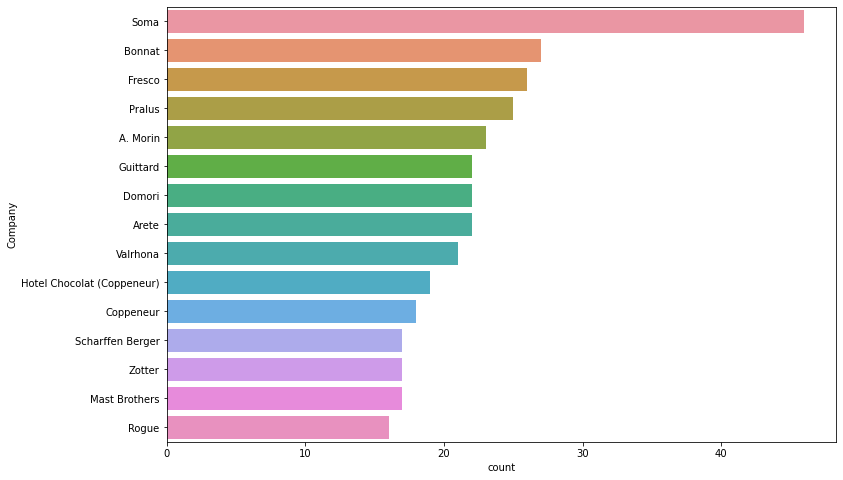

In [136]:
plt.figure(figsize = (12, 8))
sns.countplot(y= "Company", data = choco_data, order = choco_data['Company'].value_counts().iloc[:15].index)
plt.show()

In [137]:
choco_data.Company.nunique()

416

+ Observation :

There are 416 Companies in total in our data and the above viz shows the top 15

# Top 15 Cocoa Bean Origin

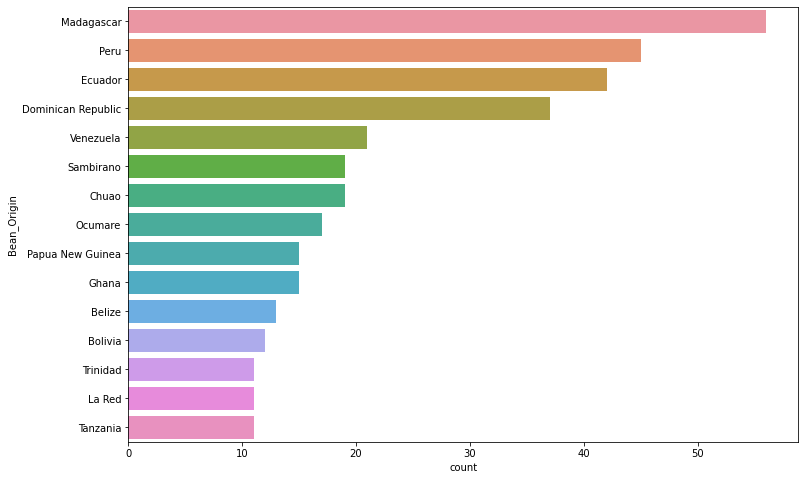

In [138]:
plt.figure(figsize = (12, 8))
sns.countplot(y= "Bean_Origin", data=choco_data, order=choco_data['Bean_Origin'].value_counts().iloc[:15].index)
plt.show()

# Top 15 Bean Types

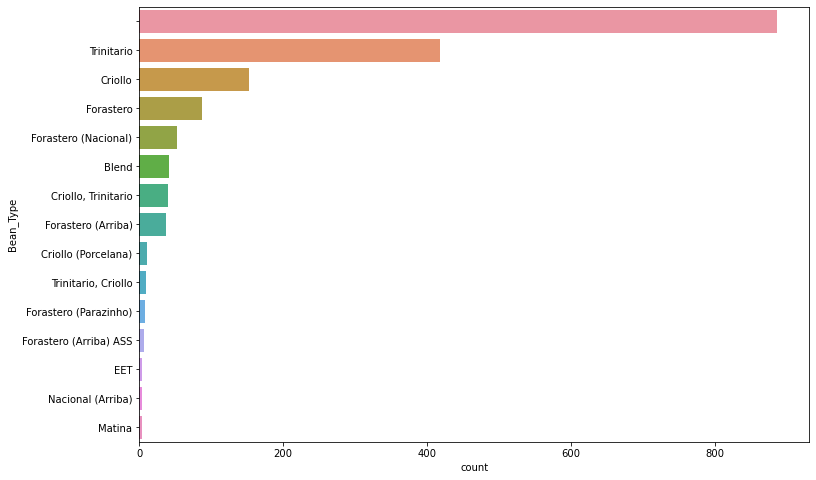

In [139]:
plt.figure(figsize = (12, 8))
sns.countplot(y= "Bean_Type", data = choco_data, order = choco_data['Bean_Type'].value_counts().iloc[:15].index)
plt.show()

# Count of Broad Beans Origin on their total working years

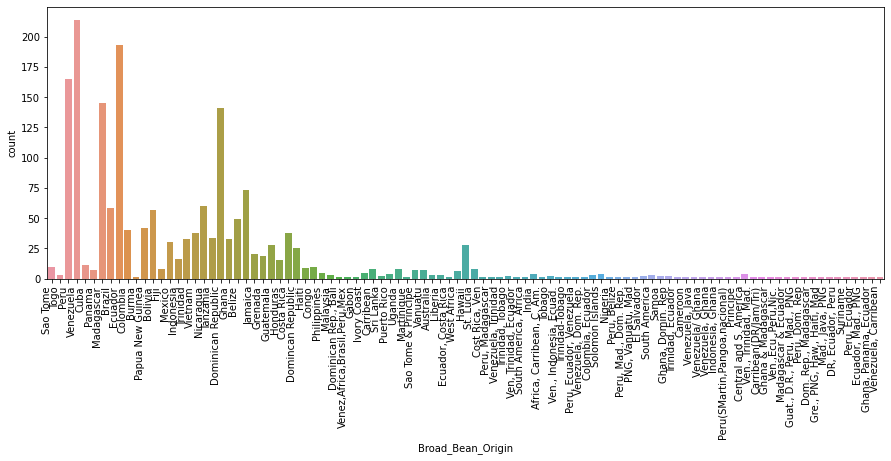

In [140]:
plt.subplots(figsize=(15,5))
s=sns.countplot(choco_data.Broad_Bean_Origin)
s.set_xticklabels(s.get_xticklabels(),rotation=90,horizontalalignment='right')
plt.show()

# What is given by the chocolate rating?
The dataset description says...

+ Unpleasant (Mostly unpalatable)
+ Disappointing
+ Satisfactory (3) to praiseworthy (3.5)
+ Premium
+ Elite

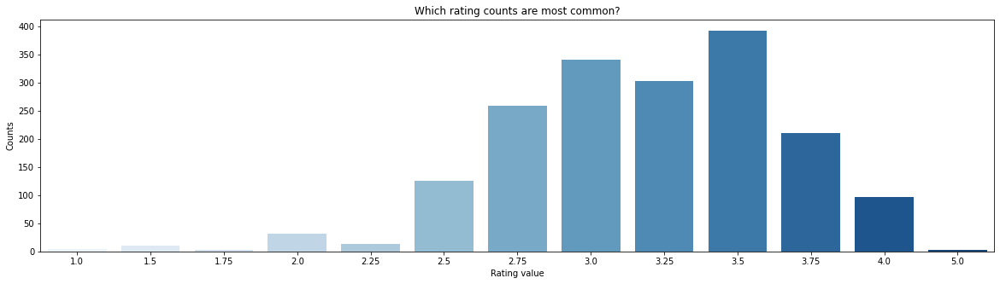

In [141]:
rating_counts = choco_data.Rating.value_counts()

plt.figure(figsize=(20,5))
sns.barplot(x=rating_counts.index, y=rating_counts.values, palette="Blues")
plt.xlabel("Rating value")
plt.ylabel("Counts")
plt.title("Which rating counts are most common?");

# Create a Pie Chart to show Chocolate ratings

In [142]:
satisfactory = choco_data[(choco_data["Rating"] >=3) & (choco_data["Rating"] <4)]
unsatisfactory = choco_data[choco_data["Rating"] <3]
highly_satisfactory = choco_data[choco_data["Rating"] >=4]

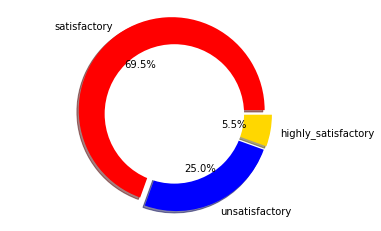

In [143]:
labels = ["satisfactory","unsatisfactory","highly_satisfactory"]
sizes = [len(satisfactory), len(unsatisfactory), len(highly_satisfactory)]
colors = ["red","blue","gold"]
explode = (0.05, 0.05, 0.05)

plt.pie(sizes, explode=explode, labels=labels, colors=colors, 
        autopct="%1.1f%%" , shadow=True)
centre_circle = plt.Circle((0,0),0.75, fc="white", linewidth=1.25)
fig = plt.gcf()
fig.gca().add_artist(centre_circle)

plt.axis("equal")
plt.show()

# What bean types do we have?

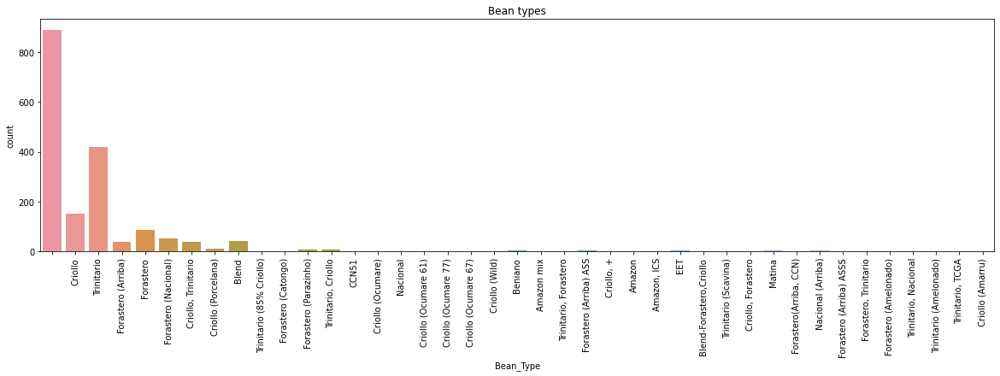

In [144]:
plt.figure(figsize=(20,5))
sns.countplot(choco_data.Bean_Type)
plt.xticks(rotation=90);
plt.title("Bean types");

# HR Employee Attrition Data

In [8]:
hr_df = pd.read_csv("../../../data/HR-Employee-Attrition.csv")
hr_df.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2


# Heatmap

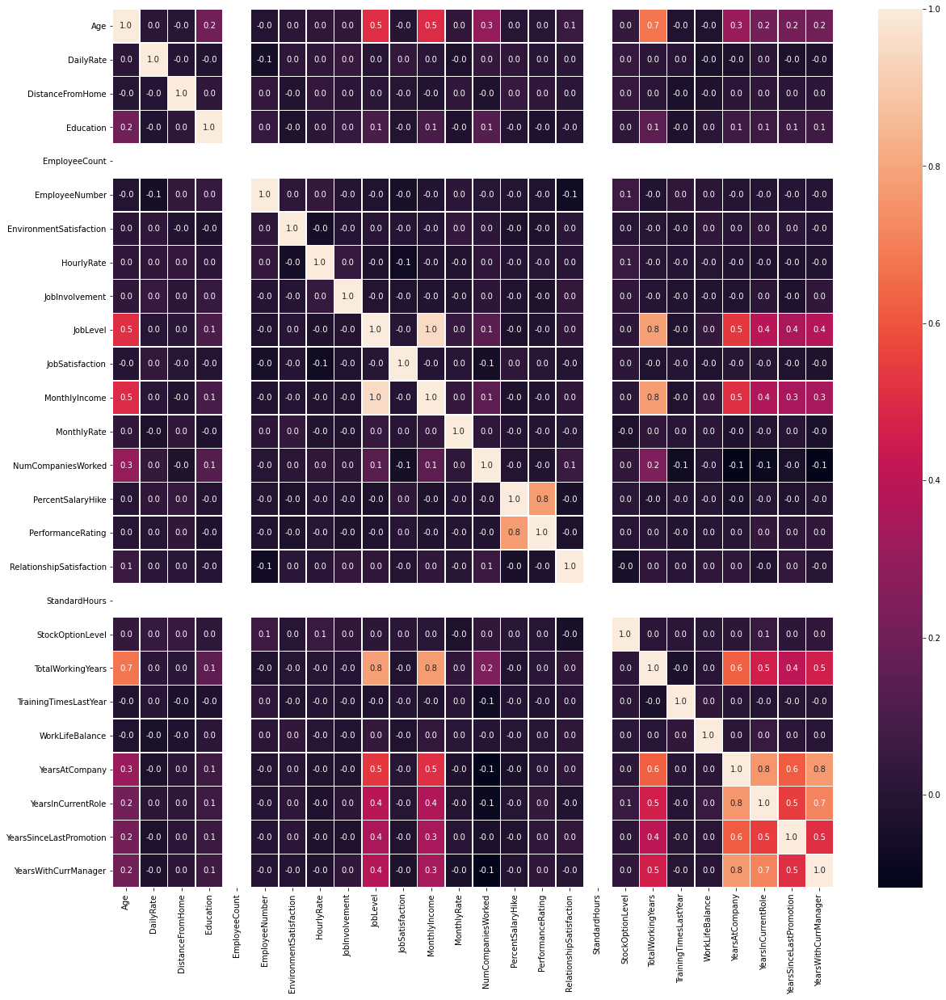

In [147]:
f,ax = plt.subplots(figsize=(20, 20))
sns.heatmap(hr_df.corr(), annot=True, linewidths=.5, fmt= '.1f',ax=ax);

In [ ]:
# count of people doing overtime

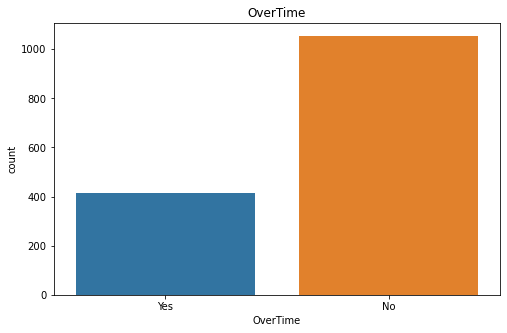

In [149]:
sns.countplot(hr_df['OverTime'])
fig = plt.gcf()
fig.set_size_inches(8,5)
plt.title('OverTime');

# count of people based on their marital status

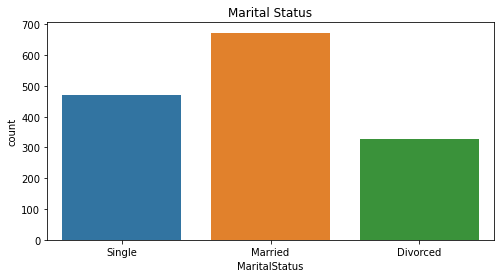

In [151]:
sns.countplot(hr_df['MaritalStatus'])
fig = plt.gcf()
fig.set_size_inches(8,4)
plt.title('Marital Status')
plt.show()

# Count of people based on their Jobrole

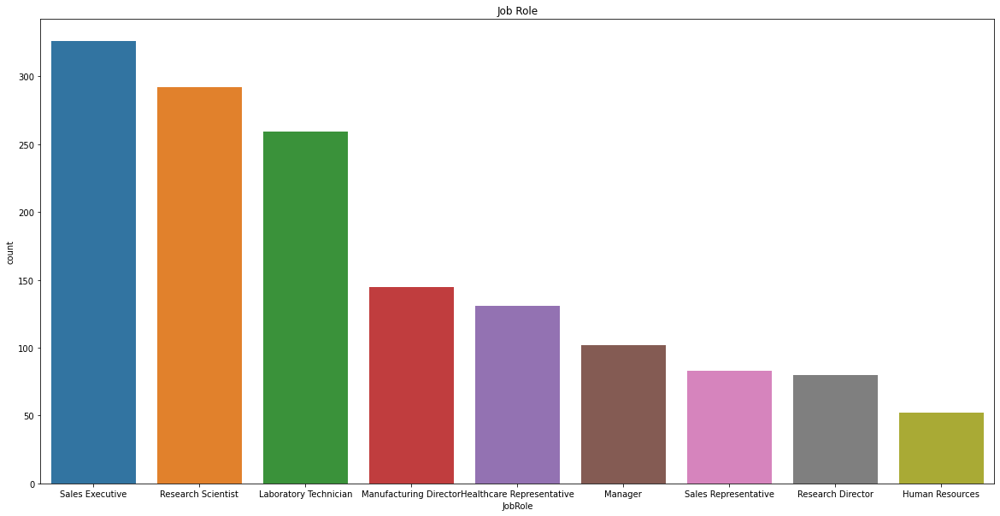

In [154]:
sns.countplot(hr_df['JobRole'])
fig = plt.gcf()
fig.set_size_inches(20,10)
plt.title('Job Role')
plt.show()

# count of people based on their Gender

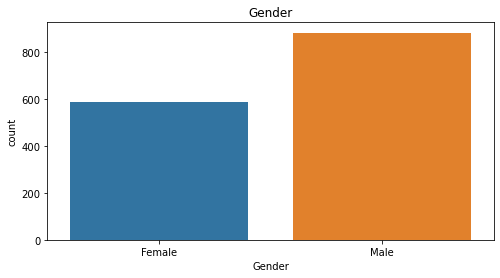

In [156]:
sns.countplot(hr_df['Gender'])
fig = plt.gcf()
fig.set_size_inches(8,4)
plt.title('Gender');

# creating a pie chart for the gender variables

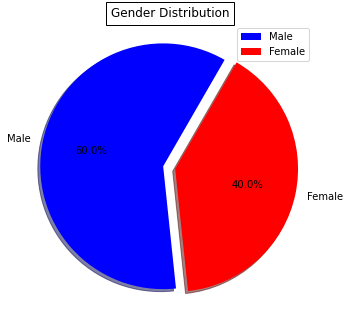

In [157]:
gender_val = ['Male','Female']
gender = hr_df['Gender'].value_counts()

gender = gender.astype(float)
fig = plt.figure(figsize=(8,4))
ax = fig.add_axes((0,0,0.5,1))
ax.set_title('Gender Distribution' , bbox={'facecolor':'white','pad':5})
labels = 'Male','Female'
colors = ['blue' , 'red']
explode = (0.1 , 0)
plt.pie(gender ,explode =explode ,labels=labels ,colors =colors ,autopct = '%1.1f%%' ,shadow = True,startangle = 60)
plt.legend(labels = gender_val)
plt.axis('equal')
plt.show()

# count of people based on their field of education

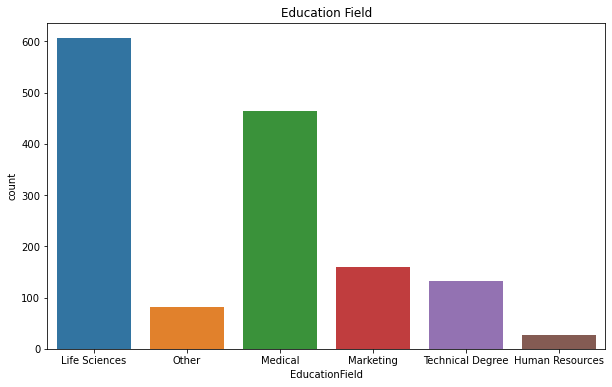

In [159]:
sns.countplot(hr_df['EducationField'])
fig = plt.gcf()
fig.set_size_inches(10,6)
plt.title('Education Field')
plt.show()

# Count of people based on the department in which they work

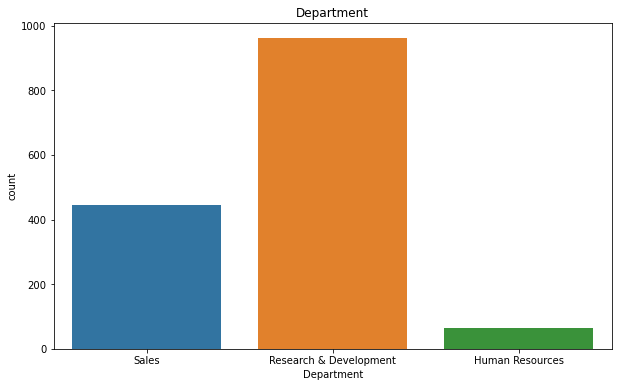

In [160]:
sns.countplot(hr_df['Department'])
fig = plt.gcf()
fig.set_size_inches(10,6)
plt.title('Department')
plt.show()

# Count of people based on their Travel Frequency

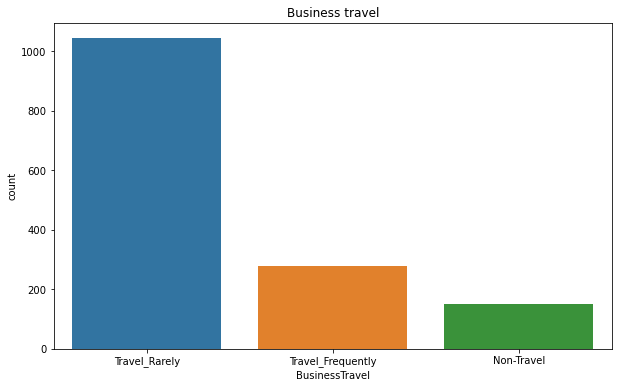

In [162]:
sns.countplot(hr_df['BusinessTravel'])
fig = plt.gcf()
fig.set_size_inches(10,6)
plt.title('Business travel');

# Analyzing the age group of the peole doing overtime

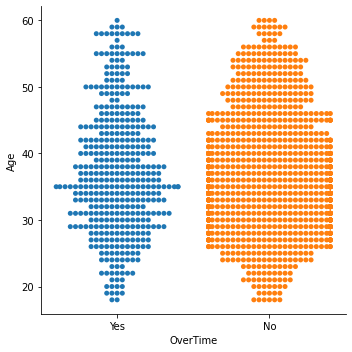

In [163]:
sns.catplot(x="OverTime", y="Age", kind="swarm", data=hr_df);

# Count of people based on their total working years

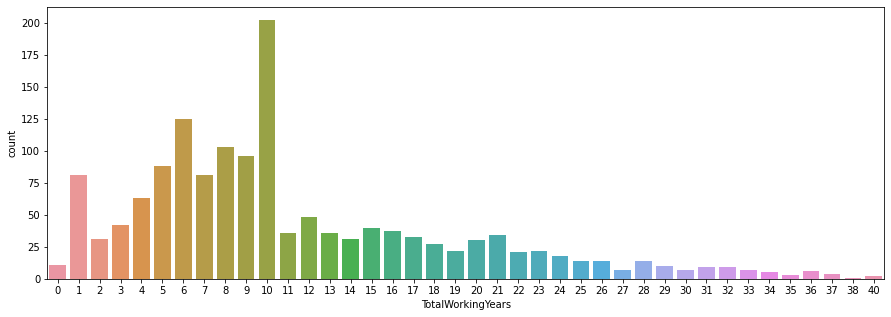

In [165]:
plt.subplots(figsize=(15,5))
sns.countplot(hr_df.TotalWorkingYears)
plt.show()

# Count of people based on their Education

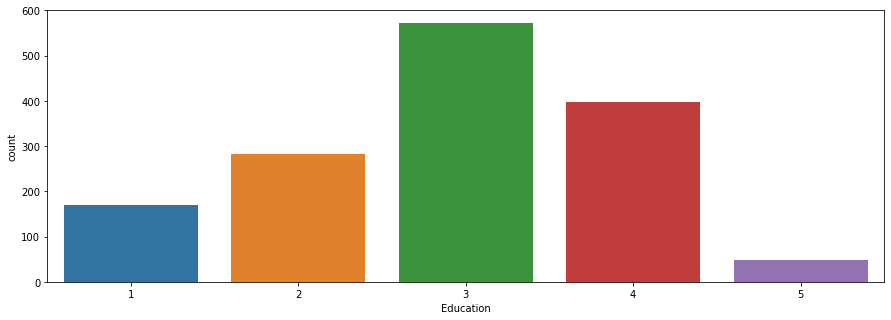

In [166]:
plt.subplots(figsize=(15,5))
sns.countplot(hr_df.Education)
plt.show()

# Count of people based on the number of companies they have worked for

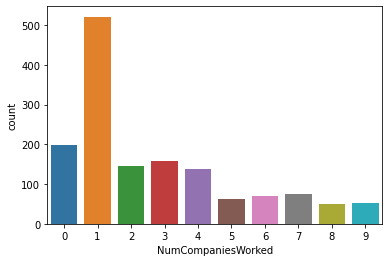

In [167]:
sns.countplot(hr_df.NumCompaniesWorked)
plt.show()

# Count of people based on the distance from home they are working

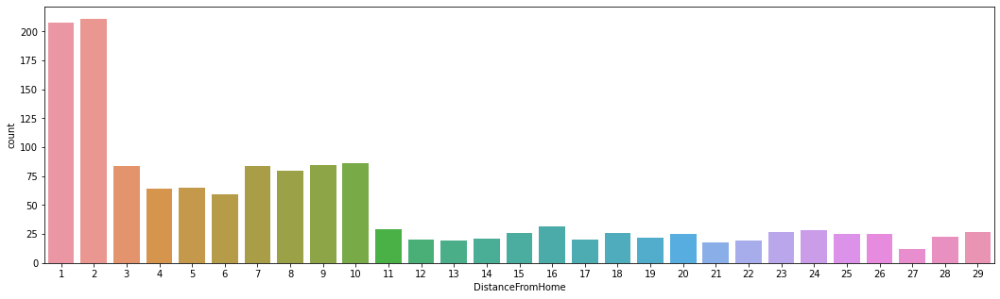

In [168]:
plt.subplots(figsize=(18,5))
sns.countplot(hr_df.DistanceFromHome)
plt.show()

# Income Data

In [186]:
income_data = pd.read_csv("../../../data/incomeData.csv")
income_data.head()

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,Income
0,39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,<=50K
1,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
2,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
3,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
4,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K


Mean of Age of income data:  38.582
Median of Age of income data:  37.0


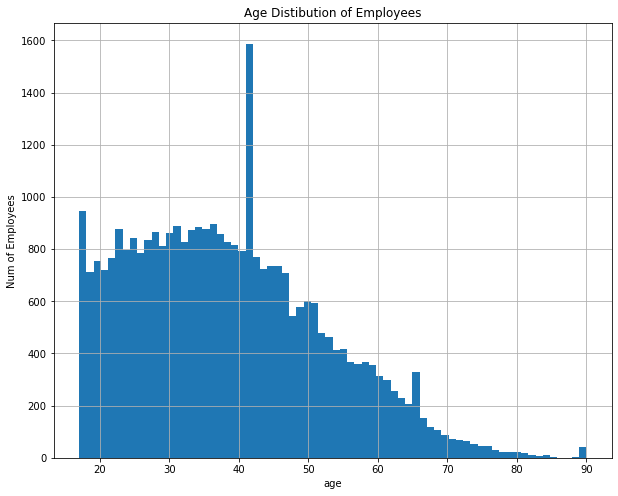

In [174]:
# Histogram for age
plt.figure(figsize=(10,8))
print("Mean of Age of income data: " ,income_data['age'].mean().round(3))
print("Median of Age of income data: " ,income_data['age'].median().round(3))

income_data['age'].hist(bins=70)
plt.title("Age Distibution of Employees")
plt.xlabel("age")
plt.ylabel("Num of Employees")
plt.show()

# Education 

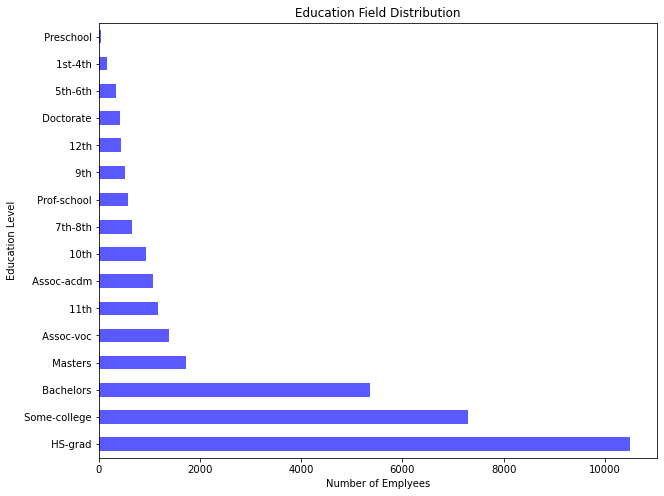

In [175]:
plt.figure(figsize=(10,8))
income_data['education'].value_counts().plot(kind='barh', color='blue',alpha=.65)
plt.title("Education Field Distribution")
plt.xlabel("Number of Emplyees")
plt.ylabel("Education Level")
plt.show()

# Marital Status

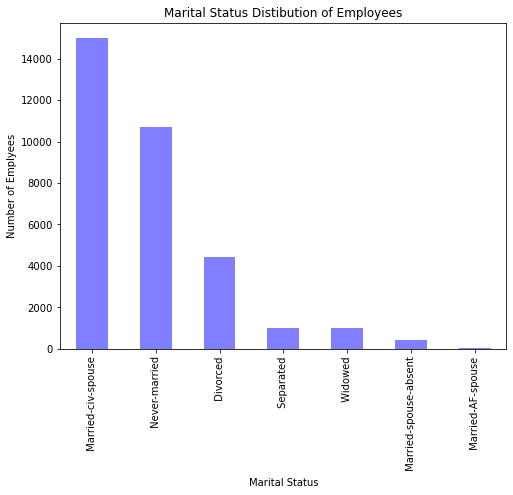

In [176]:
plt.figure(figsize=(8,6))
income_data['marital-status'].value_counts().plot(kind='bar', color='blue' , alpha=.5)
# plt.plot(kind='bar', color='b', alpha=.5)
plt.title("Marital Status Distibution of Employees")
plt.xlabel("Marital Status")
plt.ylabel("Number of Emplyees")
plt.show()

In [187]:
#labels
lab = income_data["sex"].value_counts().keys().tolist()
#values
val = income_data["sex"].value_counts().values.tolist()

trace = go.Pie(labels = lab ,
               values = val ,
               marker = dict(colors =  [ 'royalblue' ,'red'],
                             line = dict(color = "white",
                                         width =  1.3)
                            ),
               rotation = 90,
               hoverinfo = "label+value+text",
               hole = .5
              )
layout = go.Layout(dict(title = "Gender distribution in data",
                        plot_bgcolor  = "rgb(243,243,243)",
                        paper_bgcolor = "rgb(243,243,243)",
                       )
                  )

data = [trace]
fig = go.Figure(data = data,layout = layout)
py.iplot(fig)

# Salary distribution between male and female

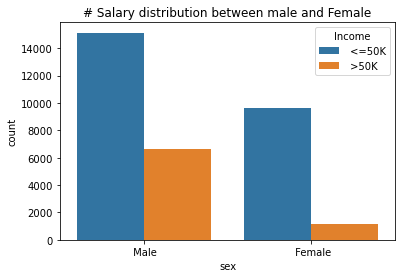

In [188]:
sns.countplot(x='sex' , hue = "Income" , data=income_data) 
plt.title("# Salary distribution between male and Female")
plt.show()

# Salary distribution of Incomes

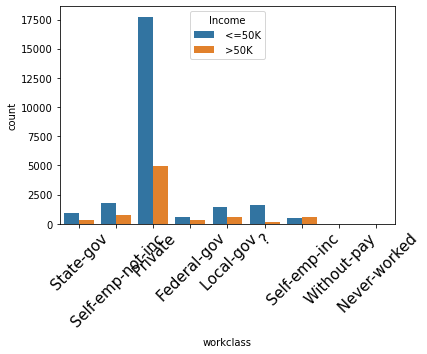

In [189]:
s = sns.countplot("workclass" , data= income_data , hue = 'Income')
s.set_xticklabels(s.get_xticklabels(), rotation = 45 , fontsize = 15)
plt.show()

# Salary distribution based on Occupation

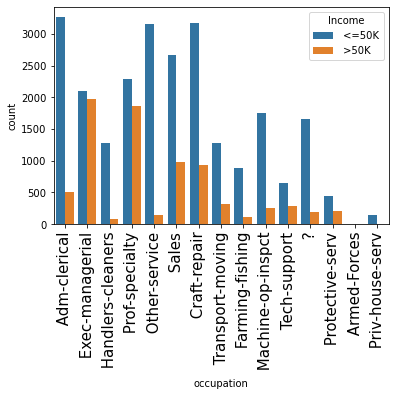

In [190]:
s = sns.countplot("occupation" , data= income_data , hue = 'Income')
s.set_xticklabels(s.get_xticklabels(), rotation = 'vertical' , fontsize = 15)
plt.show()

# Salary distribution based on education

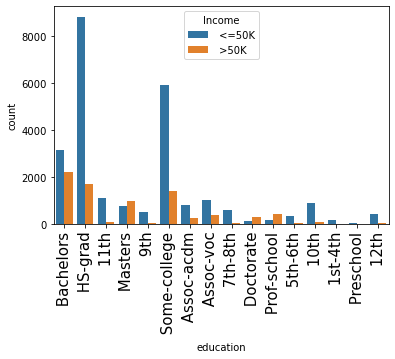

In [192]:
s = sns.countplot("education" , data= income_data , hue = 'Income')
s.set_xticklabels(s.get_xticklabels(), rotation = 90 , fontsize = 15)
plt.show()

# Wage Class Distribution (Target)

In [193]:
lab = income_data['Income'].value_counts().keys().tolist()
#values
val = income_data["Income"].value_counts().values.tolist()

trace = go.Pie(labels = lab ,
               values = val ,
               marker = dict(colors =  [ 'royalblue' ,'red'],
                             line = dict(color = "white",
                                         width =  1.3)
                            ),
               rotation = 90,
               hoverinfo = "label+value+text",
               hole = .5
              )
layout = go.Layout(dict(title = "Wage class distribution in data",
                        plot_bgcolor  = "rgb(243,243,243)",
                        paper_bgcolor = "rgb(243,243,243)",
                       )
                  )

data_new = [trace]
fig = go.Figure(data = data_new,layout = layout)
py.iplot(fig)

# Age vs Income

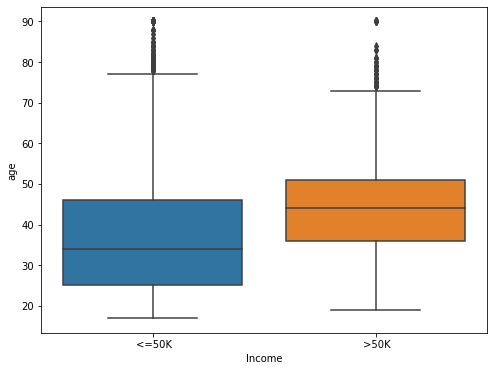

In [194]:
plt.figure(figsize = (8,6))
sns.boxplot(x='Income' , y = 'age' , data = income_data)
plt.show()

# Salary vs race

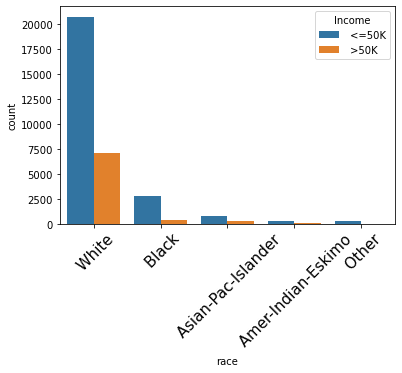

In [196]:
s = sns.countplot("race" , data= income_data , hue = 'Income')
s.set_xticklabels(s.get_xticklabels(), rotation = 45 , fontsize = 15)
plt.show()

# Native-Country column

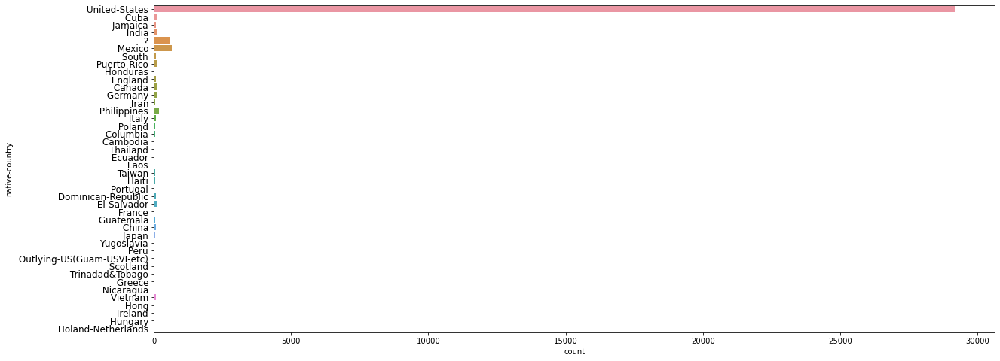

In [197]:
plt.figure(figsize=(20,8)) #Create a new figure
g = sns.countplot(y='native-country',data=income_data) # plotting the counts for native country

g.set_yticklabels(g.get_yticklabels(), rotation = 0, fontsize = 12) # Set the y-tick labels with list of strings labels.
plt.show()

# Countplot based on the Sex column

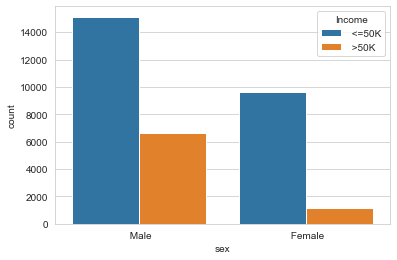

In [198]:
plt.figure(figsize=(40,20)) #Create a new figure
sns.set_style('whitegrid') #Use matplotlib style settings from a style specification.
%matplotlib inline
sns.countplot('sex',data=income_data,hue='Income') 
plt.show()

# Countplot based on the workclass column

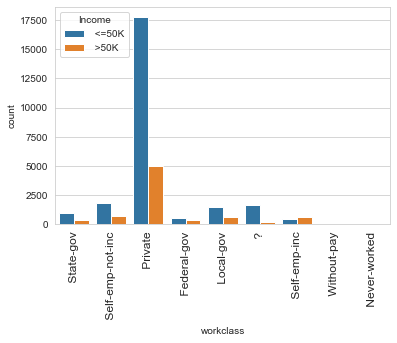

In [200]:
g = sns.countplot('workclass',data=income_data,hue='Income') 
g.set_xticklabels(g.get_xticklabels(), rotation = 90, fontsize = 12)
plt.show()

# Countplot based on the Education vs Target column


In [203]:
income_data.columns[-1]

'Income'

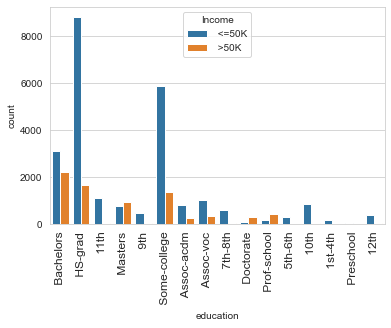

In [204]:
g = sns.countplot('education',data=income_data,hue='Income')
g.set_xticklabels(g.get_xticklabels(), rotation = 90, fontsize = 12)
plt.show()

# Countplot based on the Income column

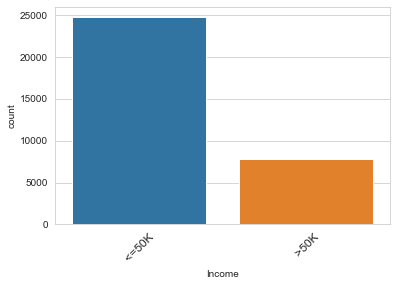

In [206]:
g = sns.countplot('Income',data=income_data) 
g.set_xticklabels(g.get_xticklabels(), rotation = 45, fontsize = 12)
plt.show()

# Olympics Data - Seaborn Tutorials

In [2]:
pd.options.display.max_rows = 10
# pd.options.display.max_columns = 6
data2 = pd.read_csv("https://raw.githubusercontent.com/mojones/binders/master/olympics.csv", sep="\t")
data2.head()

,City,Year,Sport,...,Medal,Country,Int Olympic Committee code
0,Athens,1896,Aquatics,...,Gold,Hungary,HUN
1,Athens,1896,Aquatics,...,Silver,Austria,AUT
2,Athens,1896,Aquatics,...,Bronze,Greece,GRE
3,Athens,1896,Aquatics,...,Gold,Greece,GRE
4,Athens,1896,Aquatics,...,Silver,Greece,GRE


# Cleaning jamed column names

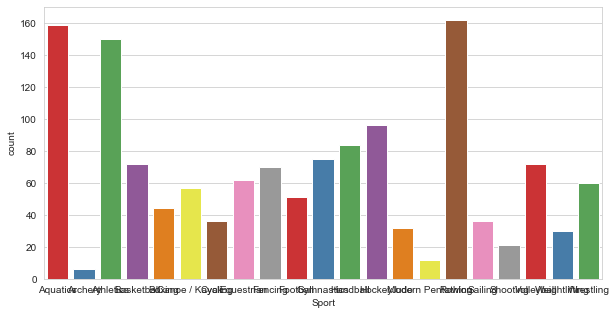

In [208]:
plt.figure(figsize=(10,5))
chart = sns.countplot(
    data=data2[data2['Year'] == 1980],
    x='Sport',
    palette='Set1'
)

# After

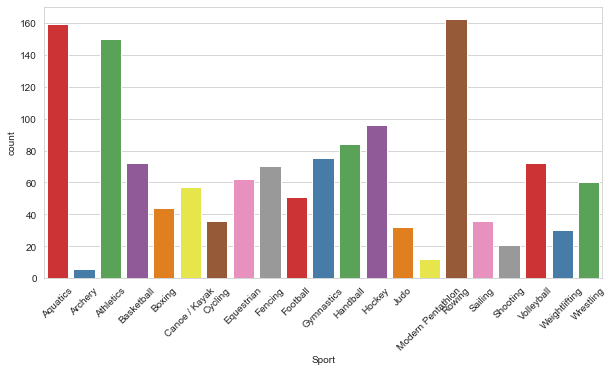

In [209]:
plt.figure(figsize=(10,5))
chart = sns.countplot(
    data=data2[data2['Year'] == 1980],
    x='Sport',
    palette='Set1'
)
chart.set_xticklabels(chart.get_xticklabels(), rotation=45);

# Improving the alignment of the xlabels


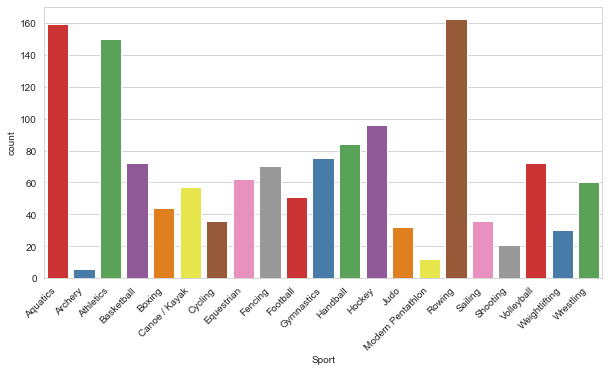

In [211]:
plt.figure(figsize=(10,5))
chart = sns.countplot(
    data=data2[data2['Year'] == 1980],
    x='Sport',
    palette='Set1'
)
chart.set_xticklabels(chart.get_xticklabels(), rotation=45, horizontalalignment='right')
plt.show()

# And just to show a few more things that we can do with set_xticklabels() we'll also set the font weight to be a bit lighter, and the font size to be a bit bigger:

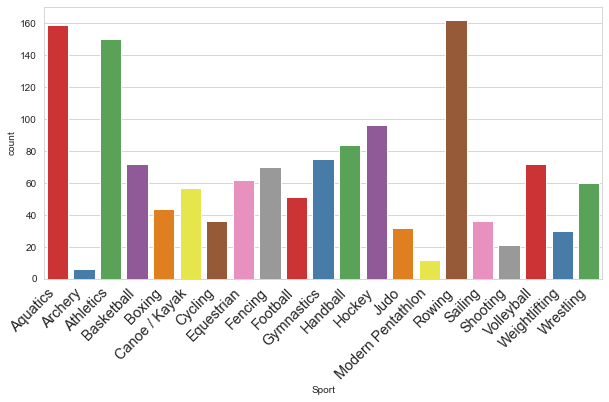

In [212]:
plt.figure(figsize=(10,5))
chart = sns.countplot(
    data=data2[data2['Year'] == 1980],
    x='Sport',
    palette='Set1'
)

chart.set_xticklabels(
    chart.get_xticklabels(), 
    rotation=45, 
    horizontalalignment='right',
    fontweight='light',
    fontsize='x-large'
)
plt.show()


# &#9989; Note
In all of these examples, we've been using the object-oriented interface to matplotlib - notice that we're calling set_xticklabels() directly on the chart object.

Another object is to use the pyplot interface. There's a method simply called xticks() which we could use like this:

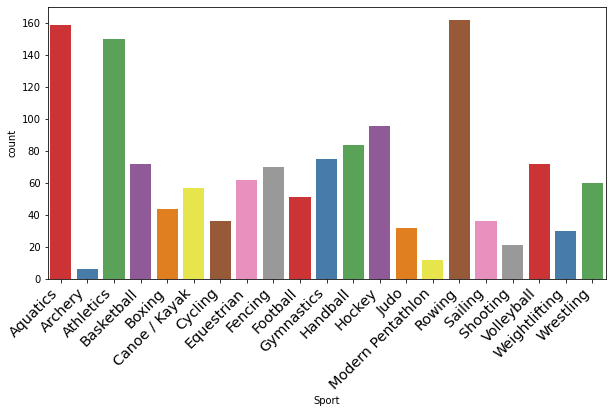

In [3]:
plt.figure(figsize=(10,5))
chart = sns.countplot(
    data=data2[data2['Year'] == 1980],
    x='Sport',
    palette='Set1'
)

plt.xticks(
    rotation=45, 
    horizontalalignment='right',
    fontweight='light',
    fontsize='x-large'  
)
plt.show()


# Observation :
+ Notice that when we do it this way the list of labels is optional, so we don't need to call get_xticklabels().
Althought the pyplot interface is easier to use in this case, in general I find it clearer to use the object-oriented interface, as it tends to be more explicit.

# Now
+ Everything that we've seen above applies if we're using matplotlib directly instead of seaborn: once we have an Axes object, we can call set_xticklabels() on it. Let's do the same thing using pandas's built in plotting function:


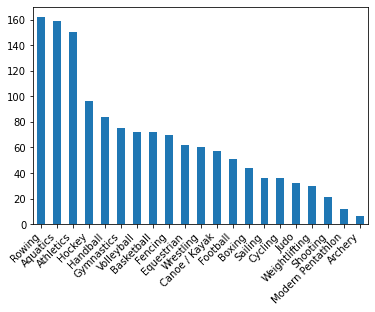

In [4]:
chart = data2[data2['Year'] == 1980]['Sport'].value_counts().plot(kind='bar')
chart.set_xticklabels(chart.get_xticklabels(), rotation=45, horizontalalignment='right');


# Dealing with multiple plots¶
+ Let's try another plot. One of the great features of seaborn is that it makes it very easy to draw multiple plots. Let's see how the distribution of medals in each sport changed between 1980 and 2008:


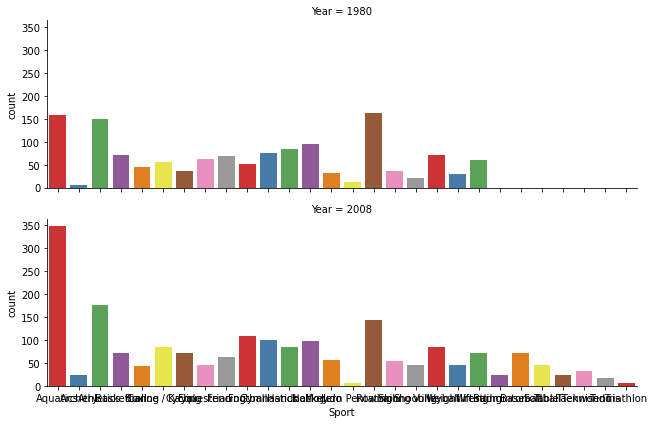

In [5]:
chart = sns.catplot(
    data=data2[data2['Year'].isin([1980, 2008])],
    x='Sport',
    kind='count',
    palette='Set1',
    row='Year',
    aspect=3,
    height=3
);

# Observation:
+ As before, the labels need to be rotated. Let's try the approach that we used before:



AttributeError: 'FacetGrid' object has no attribute 'get_xticklabels'

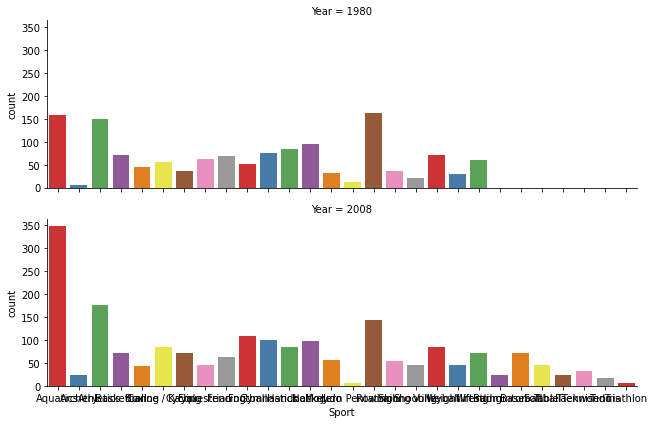

In [6]:
chart = sns.catplot(
    data=data2[data2['Year'].isin([1980, 2008])],
    x='Sport',
    kind='count',
    palette='Set1',
    row='Year',
    aspect=3,
    height=3
)
chart.set_xticklabels(chart.get_xticklabels(), rotation=45, horizontalalignment='right')

# Error
+ We run into an error. Note that the missing attribute is not set_xticklabels() but get_xticklabels(). The reason why this approach worked for countplot() and not for factorplot() is that the output from countplot() is a single Axes object, as we saw above, but the output from factorplot() is a seaborn FacetGrid object:



In [7]:
# checking the type for chart
type(chart)

seaborn.axisgrid.FacetGrid

## whose job is to store a collection of multiple axes - two in this case. So how to rotate the labels? In the current stable version of seaborn (0.9.0 at the time of writing) just calling set_xticklabels() without a list of labels works for most cases, but not in the case we have here where we're using row=Year to get multiple plots. If we plot by columns it works fine:

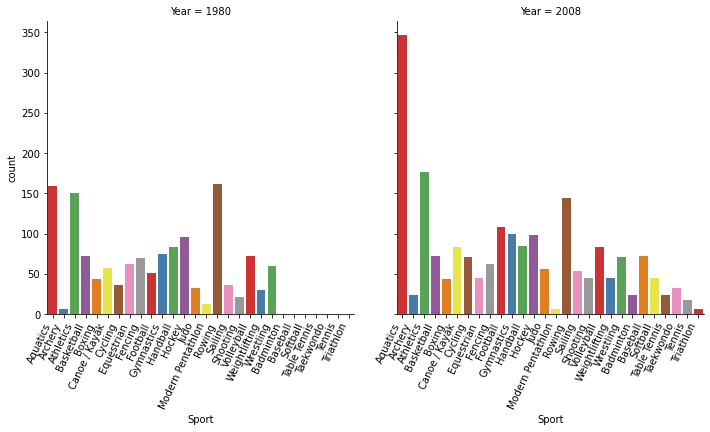

In [8]:
chart = sns.catplot(
    data=data2[data2['Year'].isin([1980, 2008])],
    x='Sport',
    kind='count',
    palette='Set1',
    col='Year',
    aspect=1,
)
chart.set_xticklabels(rotation=65, horizontalalignment='right');

# But now : Observations:
+ but with rows, calling set_xticklabels() just makes the labels disappear:

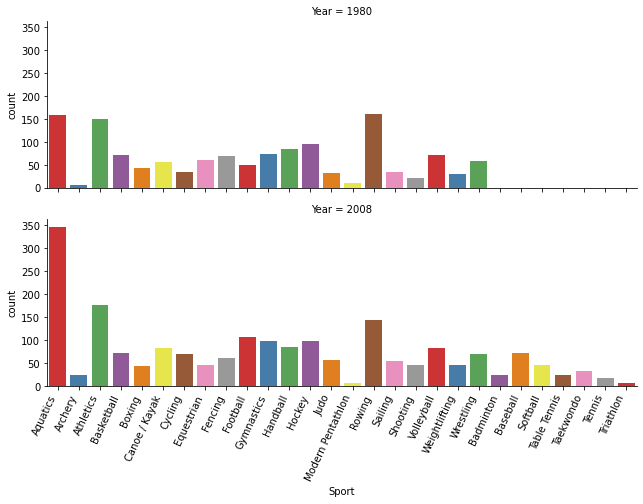

In [9]:
chart = sns.catplot(
    data=data2[data2['Year'].isin([1980, 2008])],
    x='Sport',
    kind='count',
    palette='Set1',
    row='Year',
    aspect=3,
    height=3
)
chart.set_xticklabels(rotation=65, horizontalalignment='right');

# Now Or:¶
+ The correct thing to do in this case is either to iterate over the individual axes objects and call set_xticklabels() on them as we did earlier:

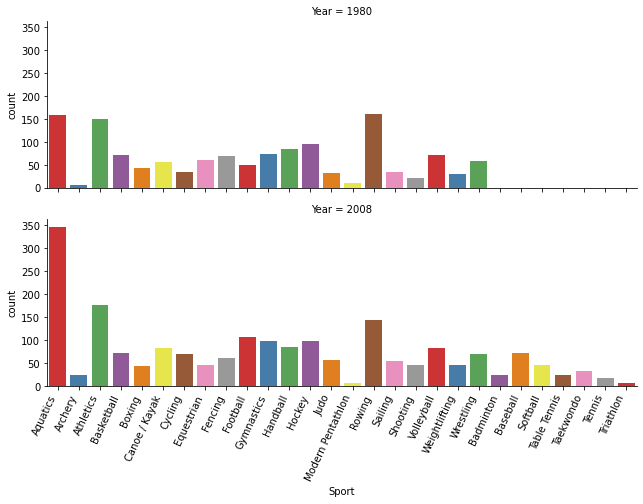

In [10]:
chart = sns.catplot(
    data=data2[data2['Year'].isin([1980, 2008])],
    x='Sport',
    kind='count',
    palette='Set1',
    row='Year',
    aspect=3,
    height=3
)
for axes in chart.axes.flat:
    axes.set_xticklabels(axes.get_xticklabels(), rotation=65, horizontalalignment='right')

# Or use the pyplot interface like we did earlier:

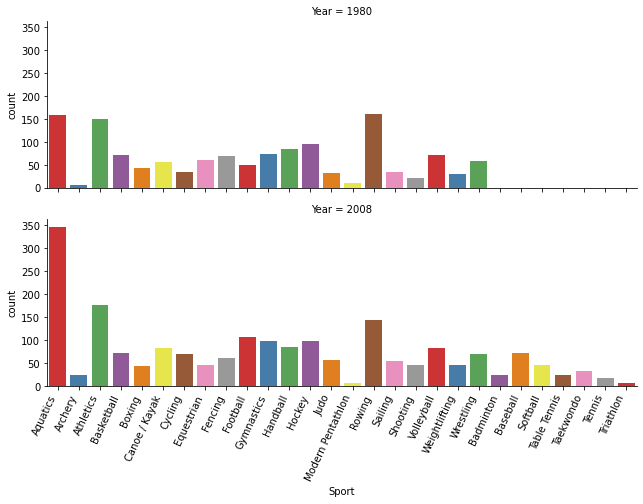

In [11]:
chart = sns.catplot(
    data=data2[data2['Year'].isin([1980, 2008])],
    x='Sport',
    kind='count',
    palette='Set1',
    row='Year',
    aspect=3,
    height=3
)
plt.xticks(rotation=65, horizontalalignment='right');

# Observation ;
+ This approach should work for any of the family of plots that come under the catplot() high-level function. Even pairplot() will give a PairGrid as its output, which behaves like a FacetGrid in that it has an axes.flat attribute that we can iterate over to call methods on each Axes object.

And, of course, everything that we've done here will work for y-axis labels as well - we typically don't need to change their rotation, but we might want to set their other properties. As an example, let's count how many medals were won at each Olypmic games for each country in each year. To keep the dataset managable, we'll just look at countries that have won more than 500 metals in total:

In [15]:
# pd.options.display.max_rows = 10
# pd.options.display.max_columns = None


# Heart Disease Data

In [4]:
heart_df = pd.read_csv("../../../data/heart-disease.csv")
heart_df.head()

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target
0,63,1,3,145,233,1,0,150,0,2.3,0,0,1,1
1,37,1,2,130,250,0,1,187,0,3.5,0,0,2,1
2,41,0,1,130,204,0,0,172,0,1.4,2,0,2,1
3,56,1,1,120,236,0,1,178,0,0.8,2,0,2,1
4,57,0,0,120,354,0,1,163,1,0.6,2,0,2,1


In [22]:
print("Heart data has :" , heart_df.shape[0] ,"rows and" , heart_df.shape[1],  "columns.")

Heart data has : 303 rows and 14 columns.


In [23]:
# let's look at the target columns
heart_df.target.value_counts()

1    165
0    138
Name: target, dtype: int64

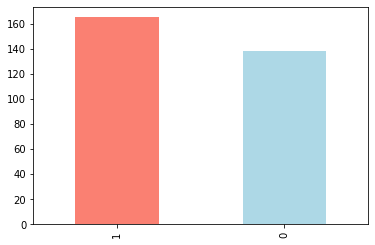

In [24]:
# Let's visualise our target variable
heart_df["target"].value_counts().plot(kind="bar", color=['salmon','lightblue']);

In [25]:
# Sex 
heart_df.sex.value_counts()

1    207
0     96
Name: sex, dtype: int64

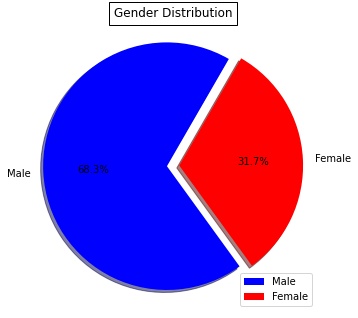

In [26]:
gender_val = ['Male','Female']
gender = heart_df['sex'].value_counts()

gender = gender.astype(float)
fig = plt.figure(figsize=(8,4))
ax = fig.add_axes((0,0,0.5,1))
ax.set_title('Gender Distribution' , bbox={'facecolor':'white','pad':5})
labels = 'Male','Female'
colors = ['blue' , 'red']
explode = (0.1 , 0)
plt.pie(gender ,explode =explode ,labels=labels ,colors =colors ,autopct = '%1.1f%%' ,shadow = True,startangle = 60)
plt.legend(labels = gender_val)
plt.axis('equal')
plt.show()

# Sex vs Target

''

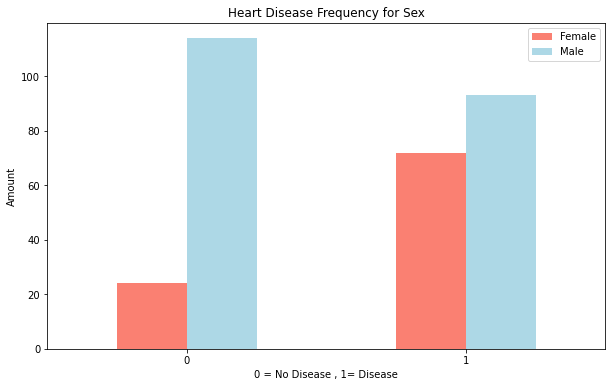

In [29]:
# create a plot of crosstab
pd.crosstab(heart_df.target, heart_df.sex).plot(kind="bar", 
                                    figsize=(10,6),
                                   color=["salmon","lightblue"])
plt.title("Heart Disease Frequency for Sex")
plt.xlabel("0 = No Disease , 1= Disease")
plt.ylabel("Amount")
plt.legend(["Female","Male"])
plt.xticks(rotation=0)
;

# Age vs MaxHeart rate for Heart disease¶


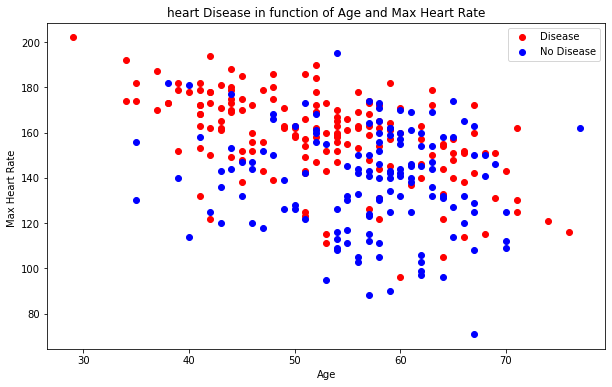

In [30]:
plt.figure(figsize=(10,6))

# scatter with positive examples
plt.scatter(heart_df.age[heart_df.target==1],
           heart_df.thalach[heart_df.target==1],
           c='red')

# scatter with negative examples
plt.scatter(heart_df.age[heart_df.target==0],
           heart_df.thalach[heart_df.target==0],
           c='blue')

plt.title("heart Disease in function of Age and Max Heart Rate")
plt.xlabel("Age")
plt.ylabel("Max Heart Rate ")
plt.legend(["Disease","No Disease"])
plt.show()

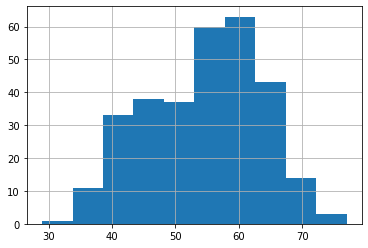

In [26]:
# Check the distribution of Age with a histogram
heart_df.age.hist()
plt.show()

# Heart disease Frequency per Chest pain Cp vs target
+ Typical angina: chest pain realtd decrease blood supply to the heart
+ Atypical angina: chest pain not related to heart
+ Non-anginal pain: typically esophageal spasms(no-heart related)
+ Asymptomatic: chest pain not showing signs of disease

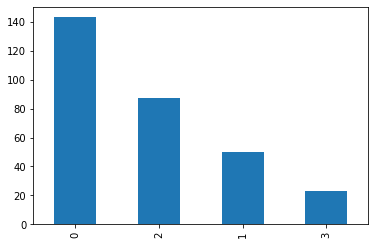

In [28]:
heart_df.cp.value_counts().plot(kind='bar');

In [30]:
pd.crosstab(heart_df.cp, heart_df.target)

target,0,1
cp,,
0,104,39
1,9,41
2,18,69
3,7,16


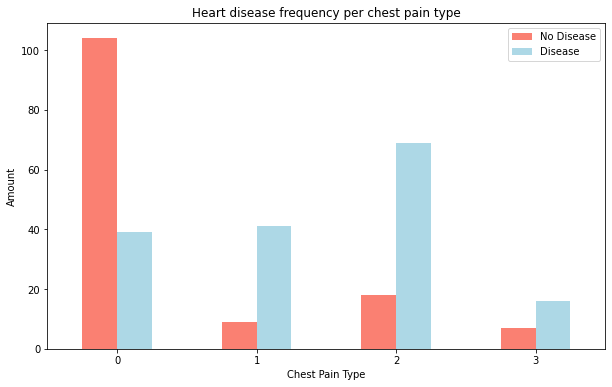

In [31]:
# Make visualisation
pd.crosstab(heart_df.cp, heart_df.target).plot(kind="bar",
                                  figsize=(10,6),
                                  color=["salmon","lightblue"])
plt.title("Heart disease frequency per chest pain type")
plt.xlabel("Chest Pain Type")
plt.ylabel("Amount")
plt.legend(["No Disease","Disease"])
plt.xticks(rotation=0);


# Finding the correlation between variables

In [32]:
heart_df.corr()

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target
age,1.000000,-0.098447,-0.068653,0.279351,0.213678,0.121308,-0.116211,-0.398522,0.096801,0.210013,-0.168814,0.276326,0.068001,-0.225439
sex,-0.098447,1.000000,-0.049353,-0.056769,-0.197912,0.045032,-0.058196,-0.044020,0.141664,0.096093,-0.030711,0.118261,0.210041,-0.280937
cp,-0.068653,-0.049353,1.000000,0.047608,-0.076904,0.094444,0.044421,0.295762,-0.394280,-0.149230,0.119717,-0.181053,-0.161736,0.433798
trestbps,0.279351,-0.056769,0.047608,1.000000,0.123174,0.177531,-0.114103,-0.046698,0.067616,0.193216,-0.121475,0.101389,0.062210,-0.144931
chol,0.213678,-0.197912,-0.076904,0.123174,1.000000,0.013294,-0.151040,-0.009940,0.067023,0.053952,-0.004038,0.070511,0.098803,-0.085239
fbs,0.121308,0.045032,0.094444,0.177531,0.013294,1.000000,-0.084189,-0.008567,0.025665,0.005747,-0.059894,0.137979,-0.032019,-0.028046
restecg,-0.116211,-0.058196,0.044421,-0.114103,-0.151040,-0.084189,1.000000,0.044123,-0.070733,-0.058770,0.093045,-0.072042,-0.011981,0.137230
thalach,-0.398522,-0.044020,0.295762,-0.046698,-0.009940,-0.008567,0.044123,1.000000,-0.378812,-0.344187,0.386784,-0.213177,-0.096439,0.421741
exang,0.096801,0.141664,-0.394280,0.067616,0.067023,0.025665,-0.070733,-0.378812,1.000000,0.288223,-0.257748,0.115739,0.206754,-0.436757
oldpeak,0.210013,0.096093,-0.149230,0.193216,0.053952,0.005747,-0.058770,-0.344187,0.288223,1.000000,-0.577537,0.222682,0.210244,-0.430696


# Heatmap

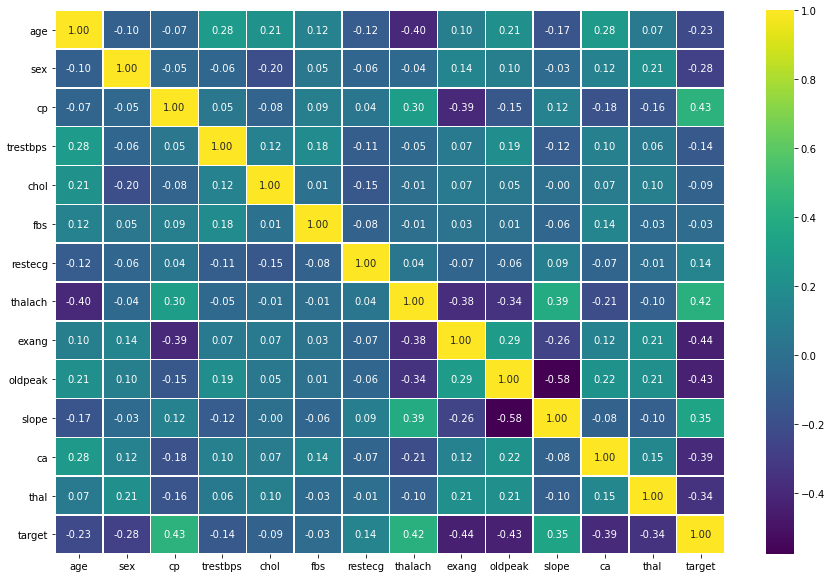

In [33]:
corr_matrix = heart_df.corr()
fig, ax = plt.subplots(figsize=(15,10))
ax = sns.heatmap(corr_matrix,
                annot=True,
                linewidths=0.5,
                fmt=".2f",
                cmap="viridis");
# this is for older versions where the heatmap isnt full at the top and bottom
# bottom, top = ax.get_ylim()
# ax.set_ylim(bottom + 0.5 , top - 0.5)

# White Wine data

In [34]:
import missingno as msno

In [37]:
# Reading the data
wine_data = pd.read_csv('../../../data/winequality-white.csv', sep = ';')
wine_data.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6


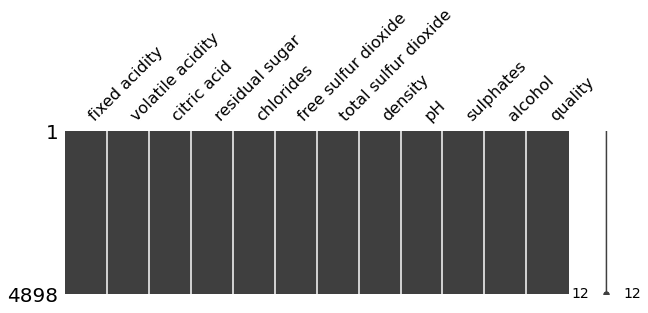

In [39]:
# Missing data detection
msno.matrix(wine_data,figsize=(10,3));

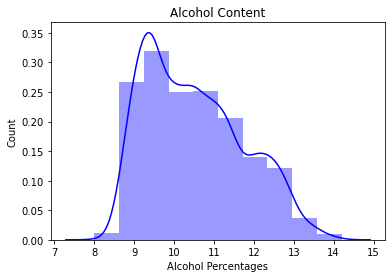

In [58]:
# Alcohol Distribution plot
sns.distplot(wine_data["alcohol"], bins=10 , kde=True, color="blue")
plt.xlabel("Alcohol Percentages")
plt.ylabel("Count")
plt.title("Alcohol Content")
plt.show()

# Check relationship between variables

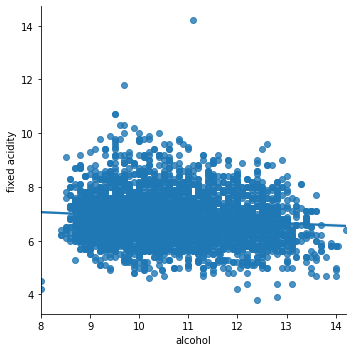

In [60]:
sns.lmplot(x="alcohol", y="fixed acidity", data=wine_data);

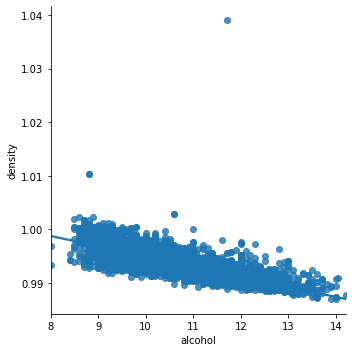

In [61]:
sns.lmplot(x="alcohol", y="density", data=wine_data);

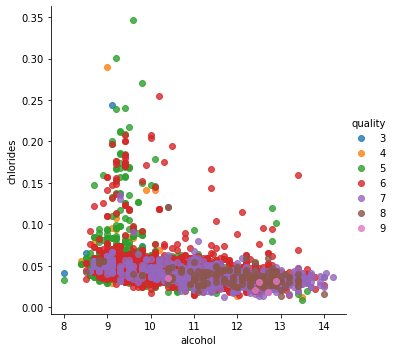

In [64]:
sns.lmplot(x="alcohol", y="chlorides", data=wine_data , fit_reg=False,
          hue="quality");

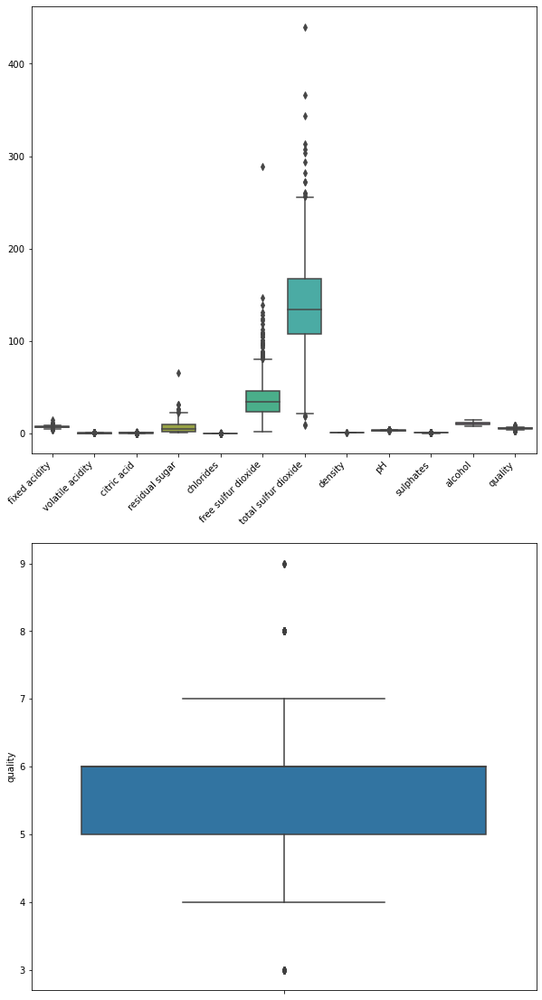

In [86]:
# Distribution
fig, axes = plt.subplots(nrows=2,ncols=1)
fig.set_size_inches(10, 20)
ax1 = sns.boxplot(data=wine_data,orient="v",ax=axes[0])
ax2 = sns.boxplot(data=wine_data,y="quality",orient="pH",ax=axes[1])
ax1.set_xticklabels(ax1.get_xticklabels(),rotation=45 ,horizontalalignment='right') # arranges the axes so they dont look crumped together
;

# Correlation analysis

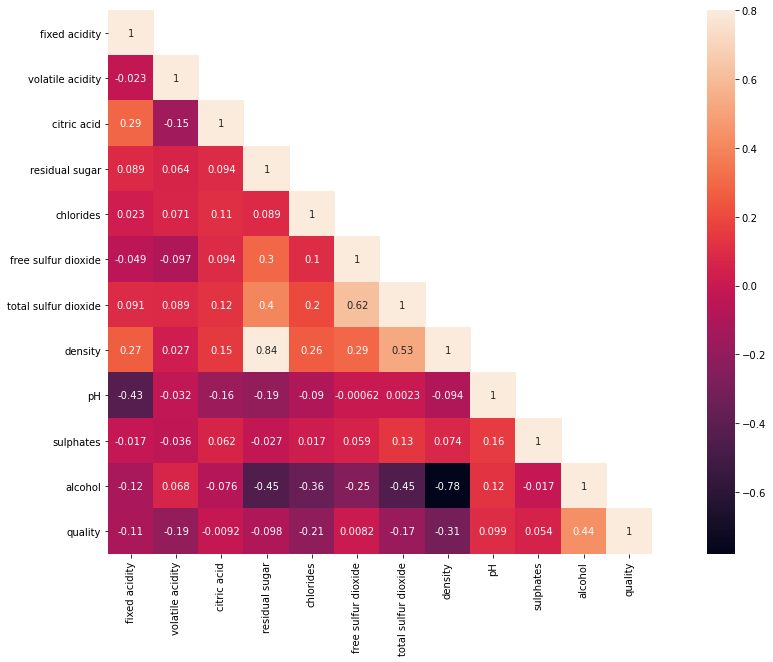

In [46]:
corrMatt = wine_data.corr()
mask = np.array(corrMatt)
mask[np.tril_indices_from(mask)] = False
fig,ax= plt.subplots()
fig.set_size_inches(20,10)
sns.heatmap(corrMatt, mask=mask,vmax=.8, square=True,annot=True);

# Scatter plot

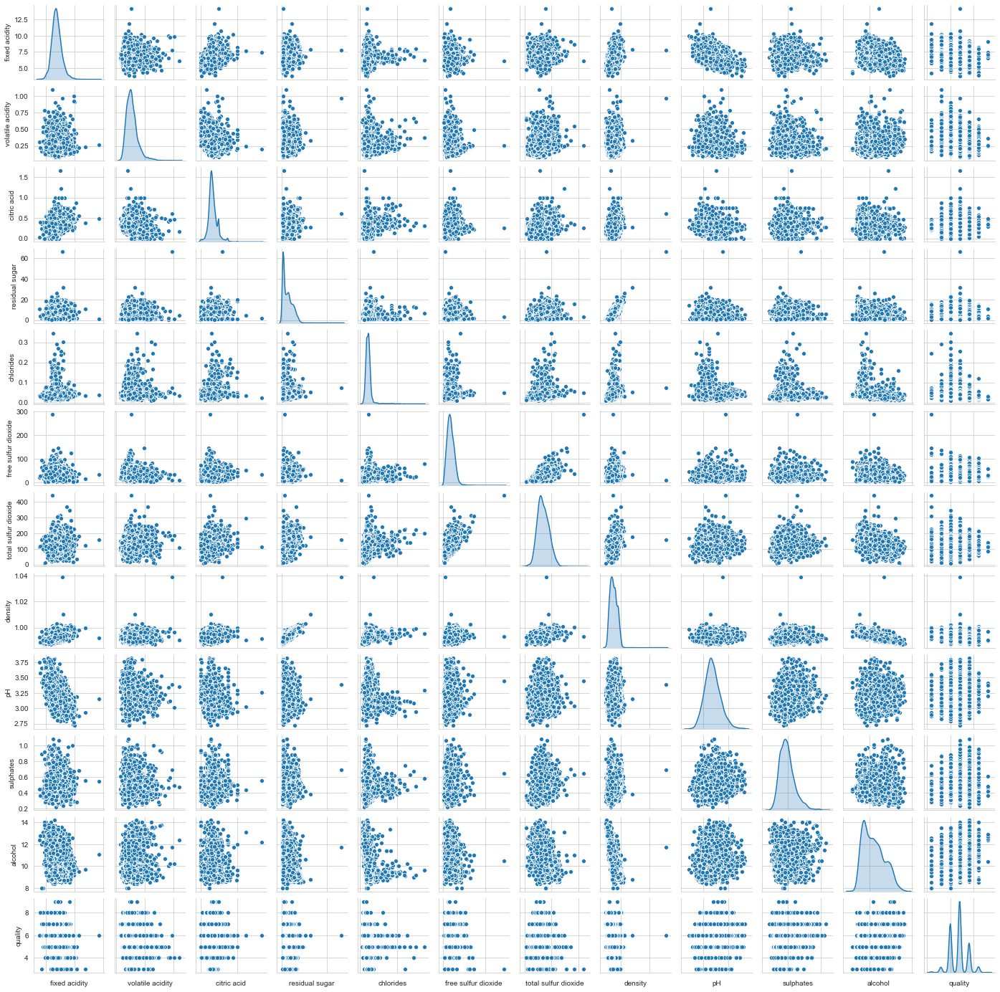

In [310]:
mx_plot = sns.pairplot(wine_data, diag_kind="kde", size=1.6)
mx_plot.set(xticklabels=[])

# Wine Data - Red and White wine

In [9]:
wines = pd.read_csv("redAndwhitewine.csv")
wines

,type,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,white,7.0,0.270,0.36,20.7,0.045,45.0,170.0,1.00100,3.00,0.45,8.8,6
1,white,6.3,0.300,0.34,1.6,0.049,14.0,132.0,0.99400,3.30,0.49,9.5,6
2,white,8.1,0.280,0.40,6.9,0.050,30.0,97.0,0.99510,3.26,0.44,10.1,6
3,white,7.2,0.230,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6
4,white,7.2,0.230,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6492,red,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
6493,red,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,NaN,11.2,6
6494,red,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
6495,red,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5


# Distribution plot for Alcohol

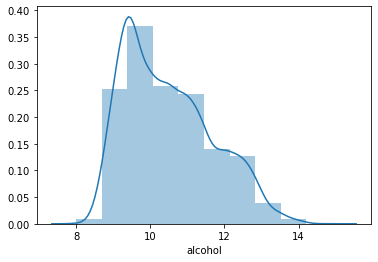

In [72]:
sns.distplot(wines.alcohol , bins=10 , kde=True);

# linear relationship btwn alchohol and fixed acidity

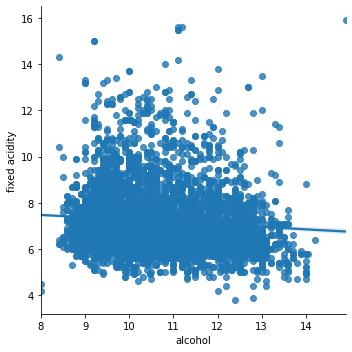

In [82]:
sns.lmplot(x="alcohol", y="fixed acidity", data=wines);

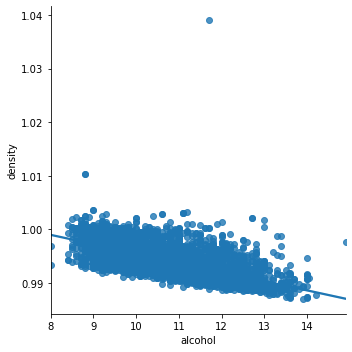

In [81]:
sns.lmplot(x="alcohol", y="density", data=wines);

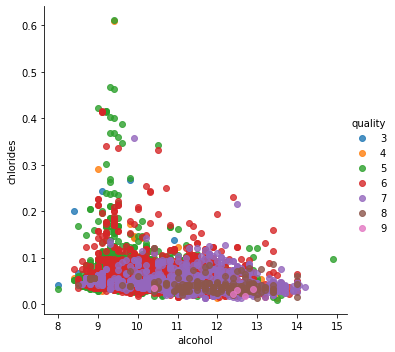

In [80]:
sns.lmplot(x="alcohol", y="chlorides", data=wines , fit_reg=False,
          hue="quality");

# alcohol and chlorides for types of wine
+ we can see from the below that red wine has more chlorides content

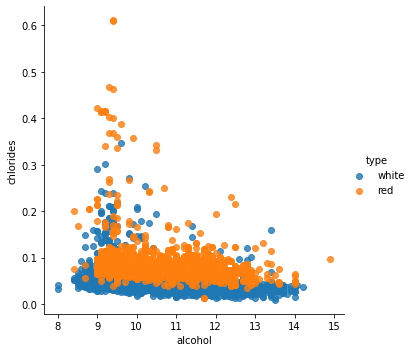

In [79]:
sns.lmplot(x="alcohol", y="chlorides", data=wines , fit_reg=False,
          hue="type");

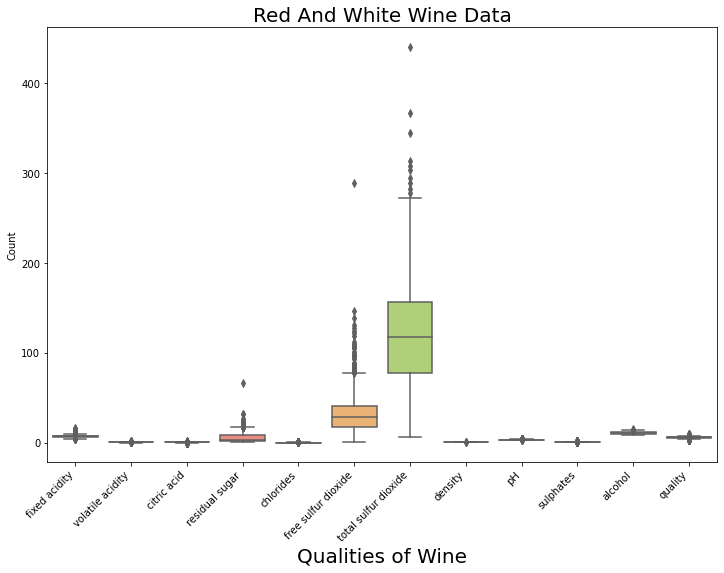

In [88]:
plt.figure(figsize=(12,8))
chart = sns.boxplot(data=wines, palette="Set3")
chart.set_xticklabels(chart.get_xticklabels(),rotation=45 ,horizontalalignment='right');
plt.title("Red And White Wine Data" , fontsize=20)
plt.xlabel("Qualities of Wine" , fontsize=20)
plt.ylabel("Count")
plt.show()

In [ ]:
# Voilin PLots

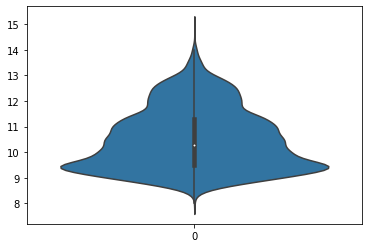

In [91]:
sns.violinplot(data=wines["alcohol"]);

# Quality vs Type of wine

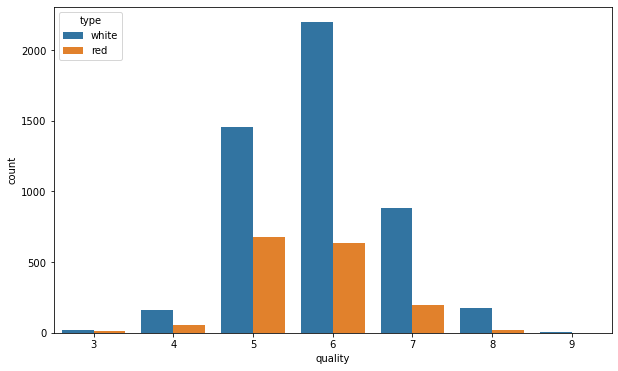

In [93]:
plt.figure(figsize=(10,6))
sns.countplot(x="quality", data=wines , hue="type");

# Create a new column with lambda to show quality of wine
+ Hint: 
    * Good if quality is >=6 else Bad

In [107]:
wines["rating"] = wines["quality"].map(lambda x: "Good" if x >= 6 else "Bad")

In [108]:
# Check results . We can see we have a new column for the ratings
wines.columns

Index(['type', 'fixed acidity', 'volatile acidity', 'citric acid',
       'residual sugar', 'chlorides', 'free sulfur dioxide',
       'total sulfur dioxide', 'density', 'pH', 'sulphates', 'alcohol',
       'quality', 'rating'],
      dtype='object')

# Create a visualisation by rating quality as good , medium or bad

In [105]:
unsatisfactory = wines[wines["quality"] < 6]
highly_satisfactory = wines[wines["quality"] >=6]

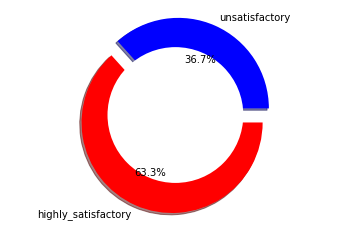

In [106]:
labels = ["unsatisfactory","highly_satisfactory"]
sizes = [len(unsatisfactory),len(highly_satisfactory)]
colors = ["blue","red"]
explode = (0.08 , 0.09)

plt.pie(sizes, explode=explode, labels=labels, colors=colors, 
        autopct="%1.1f%%" , shadow=True)
centre_circle = plt.Circle((0,0),0.75, fc="white", linewidth=1.25)
fig = plt.gcf()
fig.gca().add_artist(centre_circle)

plt.axis("equal")
plt.show()

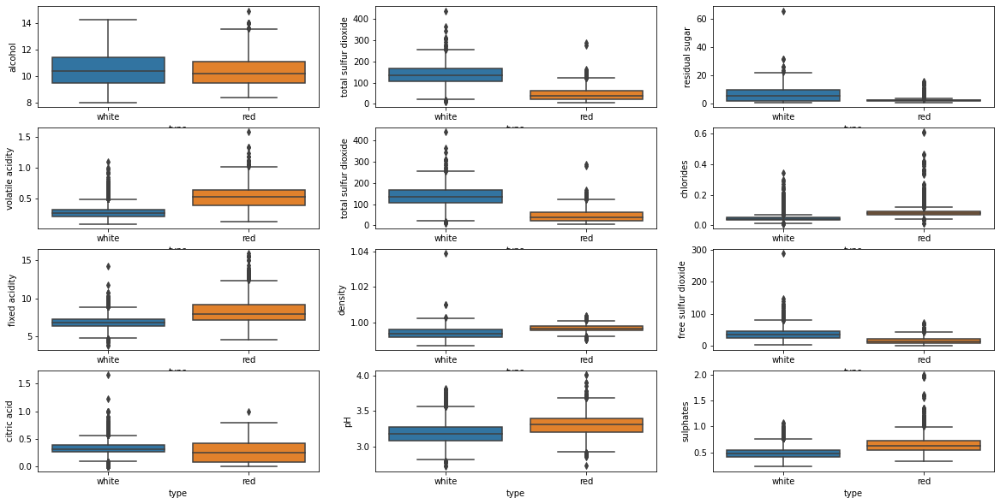

In [114]:
fig = plt.figure(figsize=(20,10))

columns = ['alcohol','total sulfur dioxide','residual sugar','volatile acidity','total sulfur dioxide',
          'chlorides','fixed acidity','density','free sulfur dioxide','citric acid','pH','sulphates']


for i , item in enumerate(columns):
    ax = fig.add_subplot(4,3,i+1)
    sns.boxplot(x="type", y=item, data=wines);

# Wholesale Customers Data

In [47]:
wholesale_data = pd.read_csv("../../../data/wholesale_customers.csv")
wholesale_data.head()

,Channel,Region,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicassen
0,2,3,12669,9656,7561,214,2674,1338
1,2,3,7057,9810,9568,1762,3293,1776
2,2,3,6353,8808,7684,2405,3516,7844
3,1,3,13265,1196,4221,6404,507,1788
4,2,3,22615,5410,7198,3915,1777,5185


In [48]:
# Drop columns
wholesale_data.drop(['Region', 'Channel'], axis = 1, inplace = True)

In [49]:
# Display the data
wholesale_data.describe()

,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicassen
count,440.000000,440.000000,440.000000,440.000000,440.000000,440.000000
mean,12000.297727,5796.265909,7951.277273,3071.931818,2881.493182,1524.870455
std,12647.328865,7380.377175,9503.162829,4854.673333,4767.854448,2820.105937
min,3.000000,55.000000,3.000000,25.000000,3.000000,3.000000
25%,3127.750000,1533.000000,2153.000000,742.250000,256.750000,408.250000
50%,8504.000000,3627.000000,4755.500000,1526.000000,816.500000,965.500000
75%,16933.750000,7190.250000,10655.750000,3554.250000,3922.000000,1820.250000
max,112151.000000,73498.000000,92780.000000,60869.000000,40827.000000,47943.000000


In [50]:
wholesale_data.columns

Index(['Fresh', 'Milk', 'Grocery', 'Frozen', 'Detergents_Paper', 'Delicassen'], dtype='object')

In [51]:
# renaming columns
wholesale_data.rename(columns={"Detergents_Paper":"Detergents"},  inplace=True)

# Data distribution

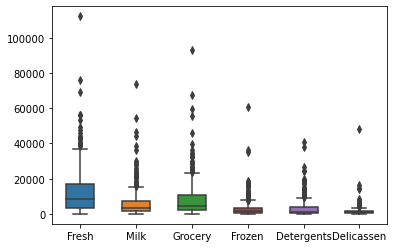

In [53]:
sns.boxplot(data=wholesale_data, orient="v",width=0.5 )
plt.show()

# Correlation analasys


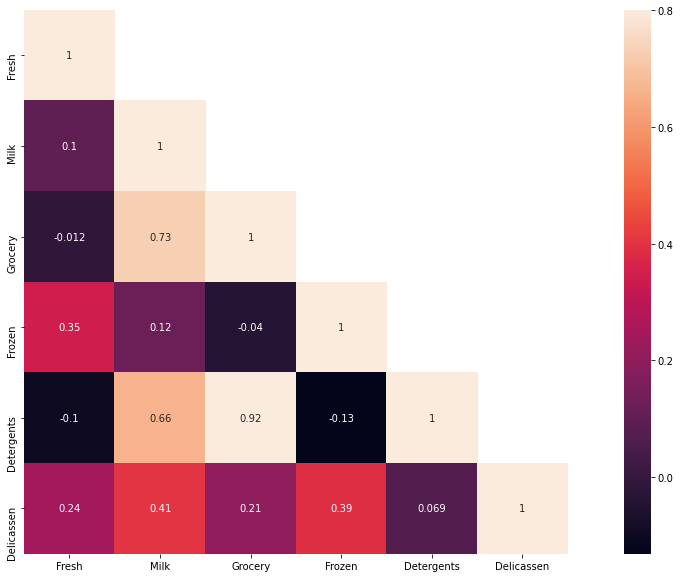

In [54]:
corrMatt = wholesale_data.corr()
mask = np.array(corrMatt)
mask[np.tril_indices_from(mask)] = False
fig,ax= plt.subplots()
fig.set_size_inches(20,10)
sns.heatmap(corrMatt, mask=mask,vmax=.8, square=True,annot=True);

# Scatterplot

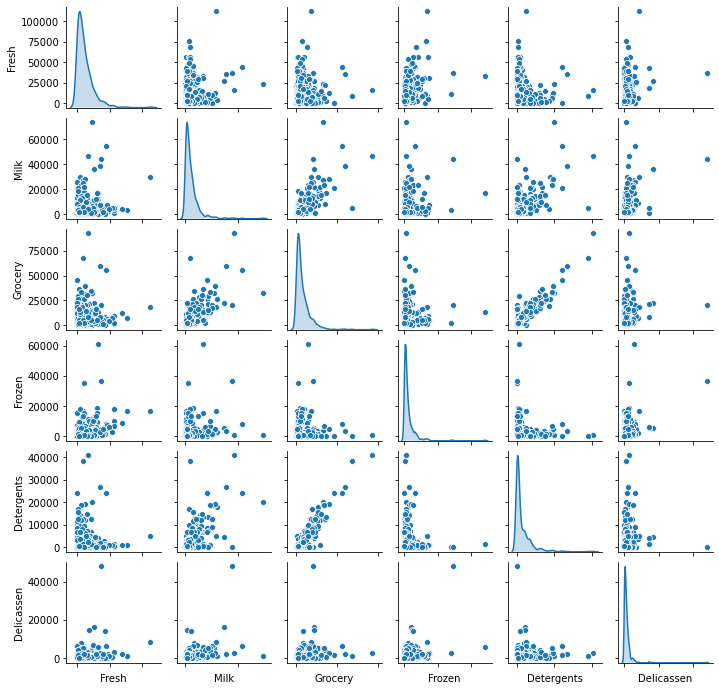

In [55]:
mx_plot = sns.pairplot(wholesale_data, diag_kind="kde", size=1.6)
mx_plot.set(xticklabels=[])
plt.show()

# Life Expectancy Data - Playing with seaborn 

In [239]:
data_url = 'http://bit.ly/2cLzoxH'
# read data from url as pandas dataframe
gapminder = pd.read_csv(data_url)
gapminder.head(3)

,country,year,pop,continent,lifeExp,gdpPercap
0,Afghanistan,1952,8425333.0,Asia,28.801,779.445314
1,Afghanistan,1957,9240934.0,Asia,30.332,820.853030
2,Afghanistan,1962,10267083.0,Asia,31.997,853.100710


In [240]:
# select year 2007
gapminder_2007 = gapminder[gapminder['year']==2007]
gapminder_2007.shape

(142, 6)

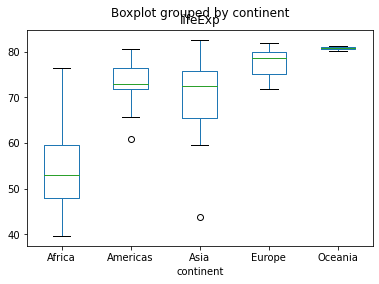

In [241]:
# create a boxlpot for life expectancy for each continent
gapminder_2007.boxplot(by='continent', 
                       column=['lifeExp'], 
                       grid=False);

# Adding colour to the above

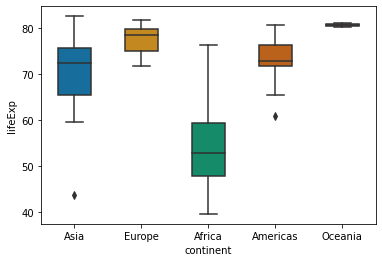

In [242]:
bplot = sns.boxplot(y='lifeExp', x='continent', 
                 data=gapminder_2007, 
                 width=0.5,
                 palette="colorblind");

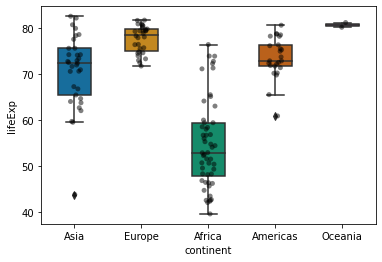

In [243]:
#  Making boxplots with datapoints
bplot=sns.boxplot(y='lifeExp', x='continent', 
                 data=gapminder_2007, 
                 width=0.5,
                 palette="colorblind")
 
# add stripplot to boxplot with Seaborn
bplot=sns.stripplot(y='lifeExp', x='continent', 
                   data=gapminder_2007, 
                   jitter=True, 
                   marker='o', 
                   alpha=0.5,
                   color='black');

# Boxplot with Swarm plot using Seaborn


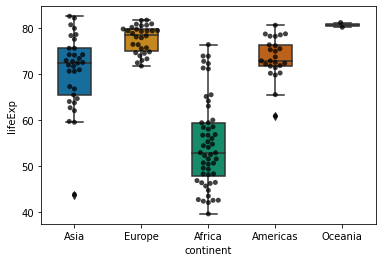

In [244]:
# plot boxplot with seaborn
bplot=sns.boxplot(y='lifeExp', x='continent', 
                 data=gapminder_2007, 
                 width=0.5,
                 palette="colorblind")
 
# add swarmplot
bplot=sns.swarmplot(y='lifeExp', x='continent',
              data=gapminder_2007, 
              color='black',
              alpha=0.75)


# Adjust x-axis and y-axis label font sizes


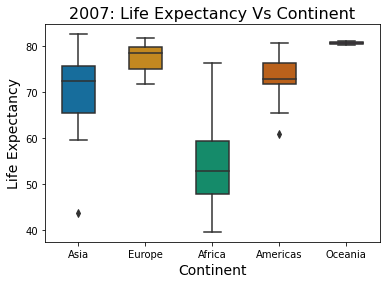

In [245]:
bplot = sns.boxplot(y='lifeExp', x='continent', 
                 data=gapminder_2007, 
                 width=0.5,
                 palette="colorblind")


bplot.axes.set_title("2007: Life Expectancy Vs Continent",
                    fontsize=16)
 
bplot.set_xlabel("Continent", 
                fontsize=14)
 
bplot.set_ylabel("Life Expectancy",
                fontsize=14)
 
bplot.tick_params(labelsize=10)

# How to save the boxplot image as jpg file

In [ ]:
# output file name
plot_file_name="boxplot_and_swarmplot_with_seaborn.jpg"
 
# save as jpeg
bplot.figure.savefig(plot_file_name,
                    format='jpeg',
                    dpi=100)

# How to customize the colours for Boxplot(s)

In [246]:
gapminder_2007.head()

,country,year,pop,continent,lifeExp,gdpPercap
11,Afghanistan,2007,31889923.0,Asia,43.828,974.580338
23,Albania,2007,3600523.0,Europe,76.423,5937.029526
35,Algeria,2007,33333216.0,Africa,72.301,6223.367465
47,Angola,2007,12420476.0,Africa,42.731,4797.231267
59,Argentina,2007,40301927.0,Americas,75.320,12779.379640


# Regular boxplot


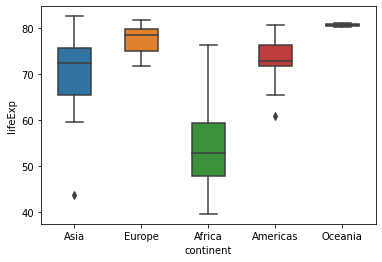

In [249]:
bplot=sns.boxplot(y='lifeExp', x='continent', 
                 data=gapminder_2007, 
                 width=0.5)

# choose colours for each continent

In [247]:
continents = gapminder_2007.continent.unique().tolist()
# Hex code for each continents color
continent_colors=["#F0F000","#F00000","#00A000","#00A0F0","#1010F0"]

In [248]:
# Let us create a color dictionary with continent as key and its color as value
color_dict = dict(zip(continents, continent_colors))

# Adding the color

In [250]:
for i in range(0,5):
    mybox = bplot.artists[i]
    mybox.set_facecolor(color_dict[continents[i]])

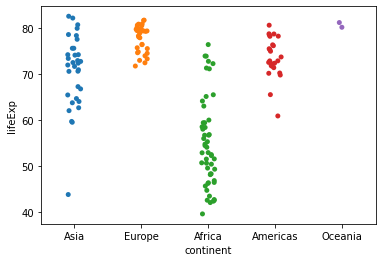

In [251]:
bplot = sns.stripplot(y='lifeExp', x='continent', 
                      data=gapminder_2007)
#                       jitter=True, marker='o',
#                       alpha=0.8, 
#                       color="black"

# Specifying the colors

In [252]:
continent_colors=["tomato","darkturquoise","mediumpurple","springgreen","magenta"]

In [253]:
color_dict = dict(zip(continents, continent_colors))

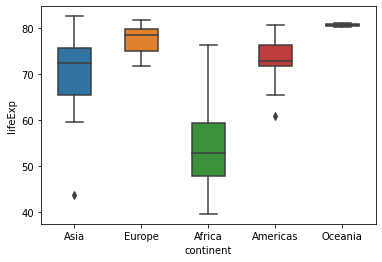

In [256]:
bplot=sns.boxplot(y='lifeExp', x='continent', 
                 data=gapminder_2007, 
                 width=0.5)

# Credit Card Default

In [259]:
pd.options.mode.chained_assignment = None
path = '../../data/default of credit card clients.xls'
pdexcel = pd.ExcelFile(path)
print(pdexcel.sheet_names)
credit_df = pdexcel.parse('Data')  # , skiprows = 1
credit_df.head()

['Data']


,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default payment next month
0,20000,2,2,1,24,2,2,-1,-1,-2,...,0,0,0,0,689,0,0,0,0,1
1,120000,2,2,2,26,-1,2,0,0,0,...,3272,3455,3261,0,1000,1000,1000,0,2000,1
2,90000,2,2,2,34,0,0,0,0,0,...,14331,14948,15549,1518,1500,1000,1000,1000,5000,0
3,50000,2,2,1,37,0,0,0,0,0,...,28314,28959,29547,2000,2019,1200,1100,1069,1000,0
4,50000,1,2,1,57,-1,0,-1,0,0,...,20940,19146,19131,2000,36681,10000,9000,689,679,0


In [261]:
# missing values
missingInfo = list(df.columns[df.isnull().any()])

In [262]:
for col in missingInfo:
    missingNumber = credit_df[credit_df[col].isnull() == True].shape[0]
    print('Missing Number for Col {}: {}'.format(col , missingNumber))
else :
    print(f'Data is clean , data has no missing values in columns')

Data is clean , data has no missing values in columns


In [263]:
# Check for duplicates
credit_df.duplicated(keep=False).sum()

70

In [264]:
credit_df.drop_duplicates(keep=False,inplace=True)

In [265]:
credit_df.duplicated(keep=False).sum()

0

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default payment next month
count,29930.000000,29930.000000,29930.000000,29930.000000,29930.000000,29930.000000,29930.000000,29930.000000,29930.000000,29930.000000,...,29930.000000,29930.000000,29930.000000,29930.000000,2.993000e+04,29930.000000,29930.000000,29930.000000,29930.000000,29930.000000
mean,167399.588373,1.603742,1.854126,1.551888,35.490444,-0.016806,-0.129937,-0.162579,-0.217173,-0.262813,...,43363.828633,40405.377581,38962.369997,5676.633378,5.934819e+03,5237.710224,4837.170999,4810.419345,5227.507484,0.221316
std,129772.622999,0.489127,0.790474,0.522024,9.221017,1.123182,1.195452,1.194882,1.167206,1.131247,...,64374.174707,60837.109277,59594.193574,16580.431605,2.306606e+04,17625.775679,15682.782377,15294.451522,17796.503071,0.415140
min,10000.000000,1.000000,0.000000,0.000000,21.000000,-2.000000,-2.000000,-2.000000,-2.000000,-2.000000,...,-170000.000000,-81334.000000,-339603.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000
25%,50000.000000,1.000000,1.000000,1.000000,28.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,...,2397.000000,1810.000000,1280.000000,1000.000000,8.620000e+02,396.000000,300.000000,266.750000,142.000000,0.000000
50%,140000.000000,2.000000,2.000000,2.000000,34.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,19111.000000,18164.000000,17160.500000,2108.000000,2.012000e+03,1811.000000,1500.000000,1500.000000,1500.000000,0.000000
75%,240000.000000,2.000000,2.000000,2.000000,41.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,54653.250000,50291.500000,49305.750000,5009.750000,5.000000e+03,4527.000000,4026.000000,4057.750000,4000.750000,0.000000
max,1000000.000000,2.000000,6.000000,3.000000,79.000000,8.000000,8.000000,8.000000,8.000000,8.000000,...,891586.000000,927171.000000,961664.000000,873552.000000,1.684259e+06,896040.000000,621000.000000,426529.000000,528666.000000,1.000000


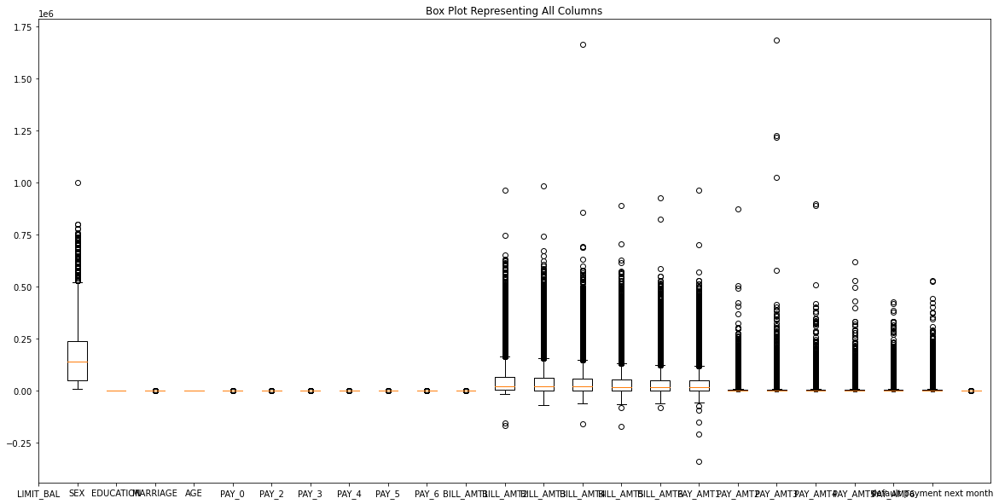

In [267]:
display(credit_df.describe())

"""Create a box plot for each column"""
plt.figure(figsize=(20,10))
plt.boxplot([credit_df[col] for col in credit_df.columns])
plt.title('Box Plot Representing All Columns')
plt.xticks(range(len(credit_df.columns.values)) , credit_df.columns.values)
plt.show()

In [268]:
# Remaning the target columns as default for short
credit_df.rename(columns = {'default payment next month' : 'default'} , inplace = True)

<Figure size 432x288 with 0 Axes>

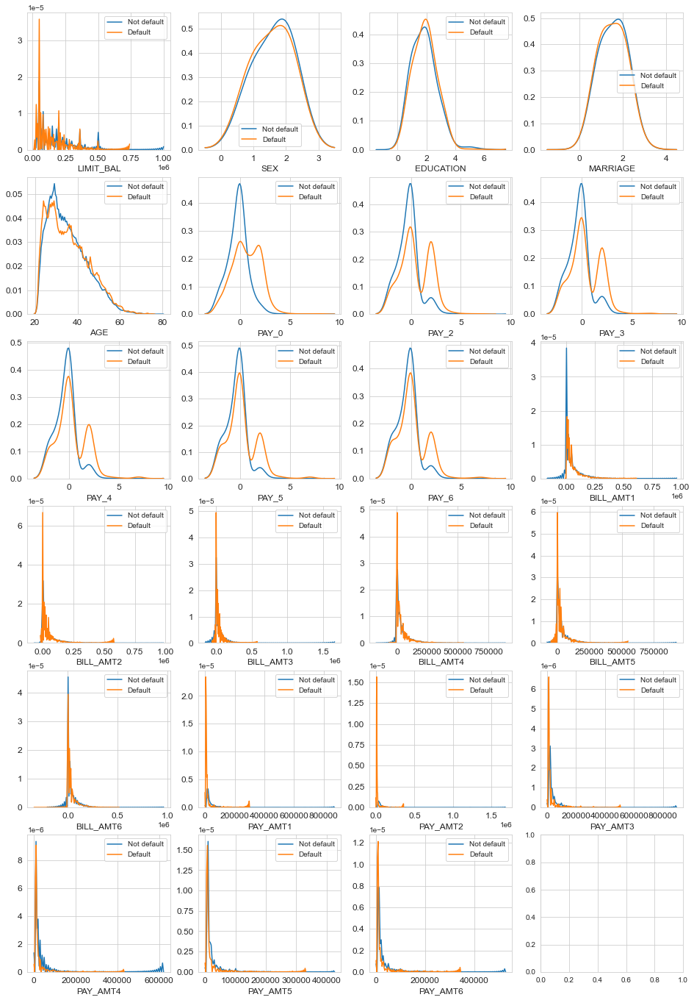

In [270]:
features = [f for f in credit_df.columns if f not in ['default']]
target = [x for x in credit_df['default']]

i = 0
t0 = credit_df[credit_df['default'] == 0]
t1 = credit_df[credit_df['default'] == 1]

sns.set_style('whitegrid')
plt.figure()
fig, ax = plt.subplots(6,4,figsize=(16,24))

for feature in features:
    i += 1
    plt.subplot(6,4,i)
    sns.kdeplot(t0[feature], bw=0.5,label="Not default")
    sns.kdeplot(t1[feature], bw=0.5,label="Default")
    plt.xlabel(feature, fontsize=12)
    locs, labels = plt.xticks()
    plt.tick_params(axis='both', which='major', labelsize=12)
plt.show()

<Figure size 432x288 with 0 Axes>

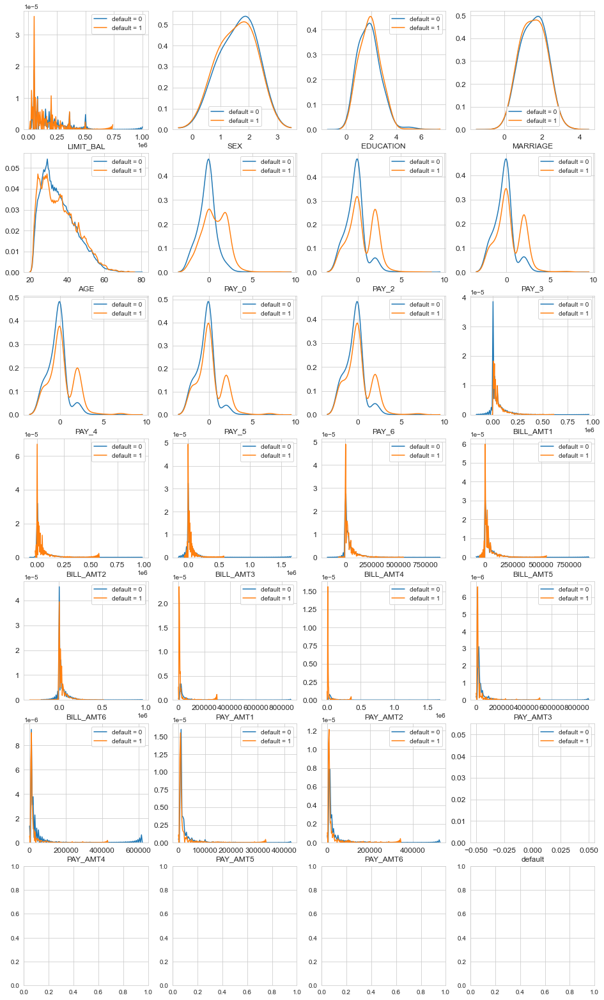

In [287]:
var = credit_df.columns.values

i = 0
t0 = credit_df.loc[credit_df['default'] == 0]
t1 = credit_df.loc[credit_df['default'] == 1]

sns.set_style('whitegrid')
plt.figure()
fig, ax = plt.subplots(7,4,figsize=(16,28))

for feature in var:
    i += 1
    plt.subplot(7,4,i)
    sns.kdeplot(t0[feature], bw=0.5, label='default = 0')
    sns.kdeplot(t1[feature], bw=0.5, label='default = 1')
    plt.xlabel(feature, fontsize=12)
    locs, labels = plt.xticks()
    plt.tick_params(axis='both' , which='major', labelsize=12)
plt.show()

In [271]:
not_default = credit_df[credit_df["default"] == 0]
default= credit_df[credit_df["default"] == 1]

In [272]:
#labels
lab = credit_df["default"].value_counts().keys().tolist()
#values
val = credit_df["default"].value_counts().values.tolist()

trace = go.Pie(labels = lab ,
               values = val ,
               marker = dict(colors =  [ 'royalblue' ,'red'],
                             line = dict(color = "white",
                                         width =  1.3)
                            ),
               rotation = 90,
               hoverinfo = "label+value+text",
               hole = .5
              )
layout = go.Layout(dict(title = "Customer Defaults and Non Defaults in data",
                        plot_bgcolor  = "rgb(243,243,243)",
                        paper_bgcolor = "rgb(243,243,243)",
                       )
                  )

data = [trace]
fig = go.Figure(data = data,layout = layout)
py.iplot(fig)

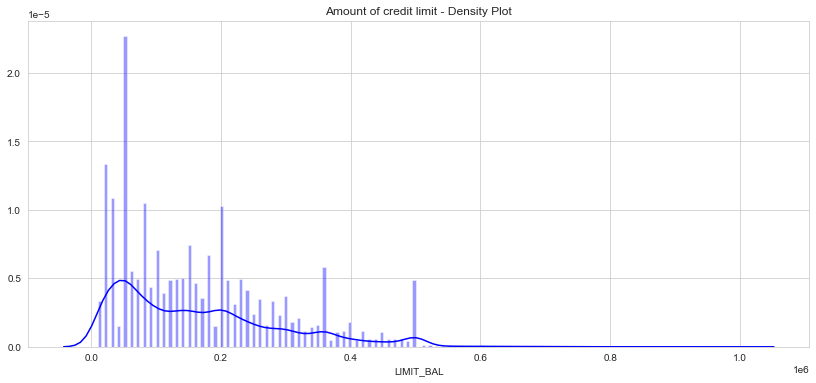

In [273]:
# Amount of credit
plt.figure(figsize = (14 ,6))
plt.title("Amount of credit limit - Density Plot")
sns.set_color_codes("pastel")
sns.distplot(credit_df['LIMIT_BAL'] , kde=True , bins = 200 , color='blue')
plt.show()

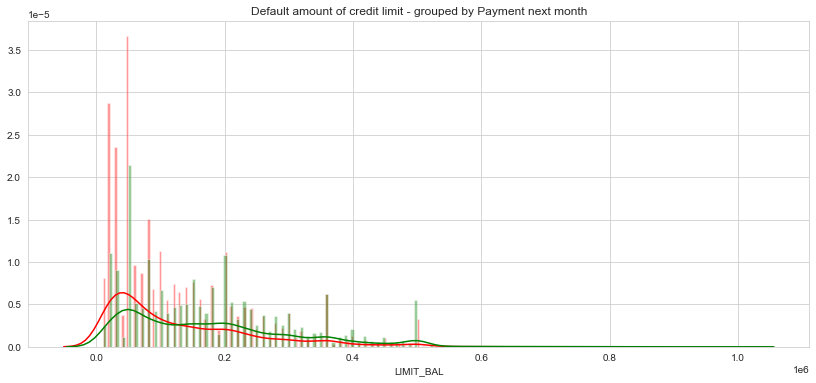

In [274]:
# Amount of credit grouped by payment next month
default_0 = credit_df.loc[credit_df['default'] == 0]['LIMIT_BAL']
default_1 = credit_df.loc[credit_df['default'] == 1]['LIMIT_BAL']
plt.figure(figsize = (14 , 6))
plt.title("Default amount of credit limit - grouped by Payment next month")
sns.set_color_codes("pastel")
sns.distplot(default_1 , kde=True, bins = 200 , color = 'red')
sns.distplot(default_0 , kde = True , bins = 200 , color = 'green')
plt.show()

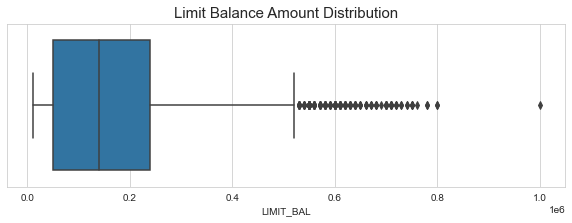

In [275]:
plt.figure(figsize = (10,3))
plt.title("Limit Balance Amount Distribution" , fontsize = 15)
ax = sns.boxplot(x = credit_df['LIMIT_BAL'])

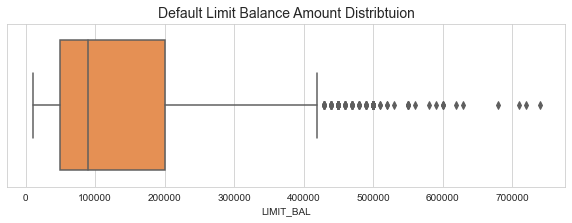

In [276]:
plt.figure(figsize = (10 , 3))
plt.title("Default Limit Balance Amount Distribtuion" , fontsize = 14)
ax = sns.boxplot(x= default['LIMIT_BAL'] , palette = 'Oranges')

# Gender distribution

In [277]:
#labels
lab = credit_df["SEX"].value_counts().keys().tolist()
#values
val = credit_df["SEX"].value_counts().values.tolist()

trace = go.Pie(labels = lab ,
               values = val ,
               marker = dict(colors =  [ 'royalblue' ,'red'],
                             line = dict(color = "white",
                                         width =  1.3)
                            ),
               rotation = 90,
               hoverinfo = "label+value+text",
               hole = .5
              )
layout = go.Layout(dict(title = "Customer Gender Distribution in data",
                        plot_bgcolor  = "rgb(243,243,243)",
                        paper_bgcolor = "rgb(243,243,243)",
                       )
                  )

data = [trace]
fig = go.Figure(data = data,layout = layout)
py.iplot(fig)

# Credit Limit vs Gender

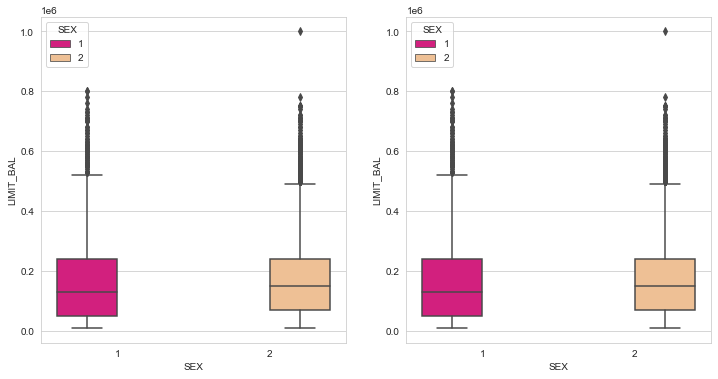

In [278]:
fig , (ax1, ax2) = plt.subplots(ncols=2 , figsize=(12,6))
sns.boxplot(ax=ax1 , x='SEX', y = 'LIMIT_BAL' , hue = 'SEX' , data = credit_df , palette="Accent_r",
           showfliers = True)
sns.boxplot(ax=ax2 , x='SEX', y = 'LIMIT_BAL' , hue = 'SEX' , data = credit_df , palette='Accent_r',
           showfliers =True)
plt.show()

# Checking in data is imbalanced or not


In [279]:
df_new = credit_df[:]

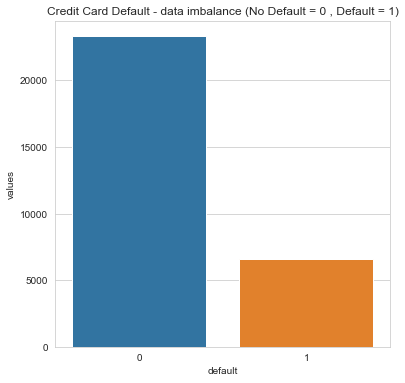

In [280]:
temp = df_new['default'].value_counts()
df_new = pd.DataFrame({'default' : temp.index , 'values' : temp.values})
plt.figure(figsize = (6,6))
plt.title("Credit Card Default - data imbalance (No Default = 0 , Default = 1)")
sns.set_color_codes("pastel")
sns.barplot(x = 'default' , y = 'values' , data = df_new)
locs , labels = plt.xticks()
plt.show()

# Gender , Education ,Age , Marriage
+ Let's show sex, education, age and marriage distributions.

+ We start by showing the boxplots with age distribution grouped by marriage status and sex.

Marriage status meaning is:
+ 0 : unknown (let's consider as others as well)
+ 1 : married
+ 2 : single
+ 3 : others

Sex meaning is:
+ 1 : male

+ 2 : female

In [281]:
def boxplot_variation(feature1 , feature2 , feature3 , width = 16):
    fig , ax1 = plt.subplots(ncols=1, figsize =(width , 6))
    s = sns.boxplot(ax = ax1 , x = feature1 , y = feature2 , hue = feature3 , 
                   data = credit_df , palette = 'Blues' , showfliers = False)
    s.set_xticklabels(s.get_xticklabels() , rotation = 90)
    plt.show()

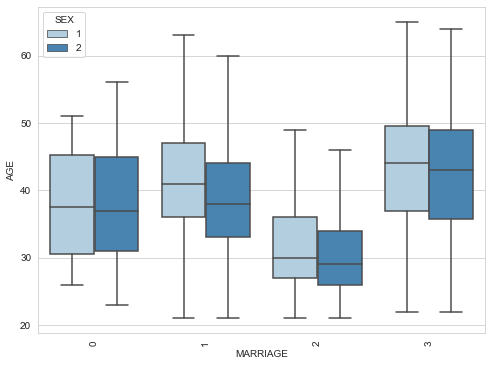

In [282]:
boxplot_variation('MARRIAGE','AGE', 'SEX',8)

# Observations:
It looks like Married status 3 (others), with mean values over 40 and Q4 values over 60 means mostly widowed or divorced whilst Married status 0 could be not specified or divorced, as Q1 values are above values for married of both sexes.

Married males have mean age above married women. Unmarried males have mean value for age above unmarried women as well but closer. Q3 abd Q4 values for married man are above corresponding values for married women.

Let's show the boxplots with age distribution grouped by education and marriage.

Education status meaning is:

1 : graduate school 
2 : university 
3 : high school 
4 : others 
5 : unknown 
6 : unknown



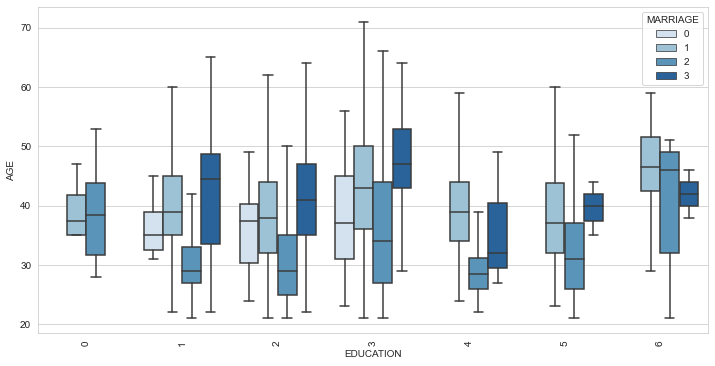

In [283]:
boxplot_variation('EDUCATION','AGE', 'MARRIAGE', 12)

# Age, Gender and credit amount limit

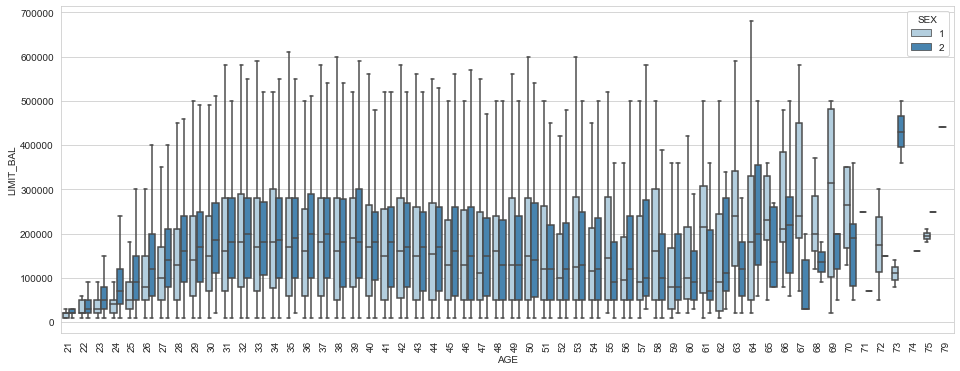

In [284]:
boxplot_variation('AGE','LIMIT_BAL','SEX' , 16)

# Observations :
Mean Of Q3 and Q4 values are increasing for both male and female with age until aroung 35 years and then they move or swing back and forth in a regular rhythm . Moreover they get to a maximum of Quarter 4 for males at age 64.

Mean values are generally smaller for males than for females, with few exceptions, for example at age 39, 48, until approximately 60, where mean values for males are generally larger than for females.

# Marriage Status , Education level and Credit Amount Limit

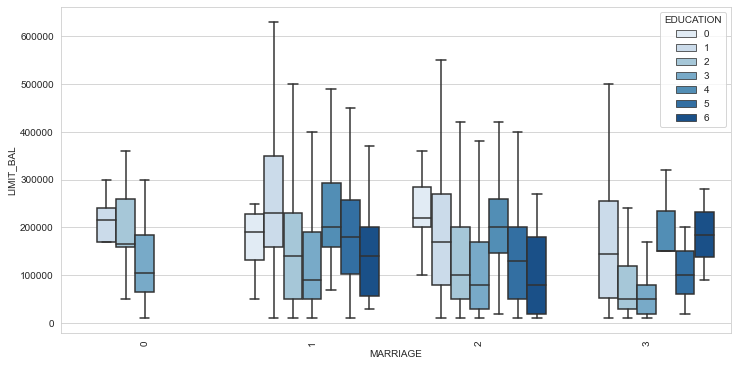

In [285]:
boxplot_variation("MARRIAGE","LIMIT_BAL","EDUCATION" , 12)

# Bulldozer Price Data

In [296]:
df_new = pd.read_csv("../../../data/TrainAndValid.csv", low_memory=False)
df_new.head()

,SalesID,SalePrice,MachineID,ModelID,datasource,auctioneerID,YearMade,MachineHoursCurrentMeter,UsageBand,saledate,...,Undercarriage_Pad_Width,Stick_Length,Thumb,Pattern_Changer,Grouser_Type,Backhoe_Mounting,Blade_Type,Travel_Controls,Differential_Type,Steering_Controls
0,1139246,66000.0,999089,3157,121,3.0,2004,68.0,Low,11/16/2006 0:00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Standard,Conventional
1,1139248,57000.0,117657,77,121,3.0,1996,4640.0,Low,3/26/2004 0:00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Standard,Conventional
2,1139249,10000.0,434808,7009,121,3.0,2001,2838.0,High,2/26/2004 0:00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1139251,38500.0,1026470,332,121,3.0,2001,3486.0,High,5/19/2011 0:00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1139253,11000.0,1057373,17311,121,3.0,2007,722.0,Medium,7/23/2009 0:00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# Count of Sales by States

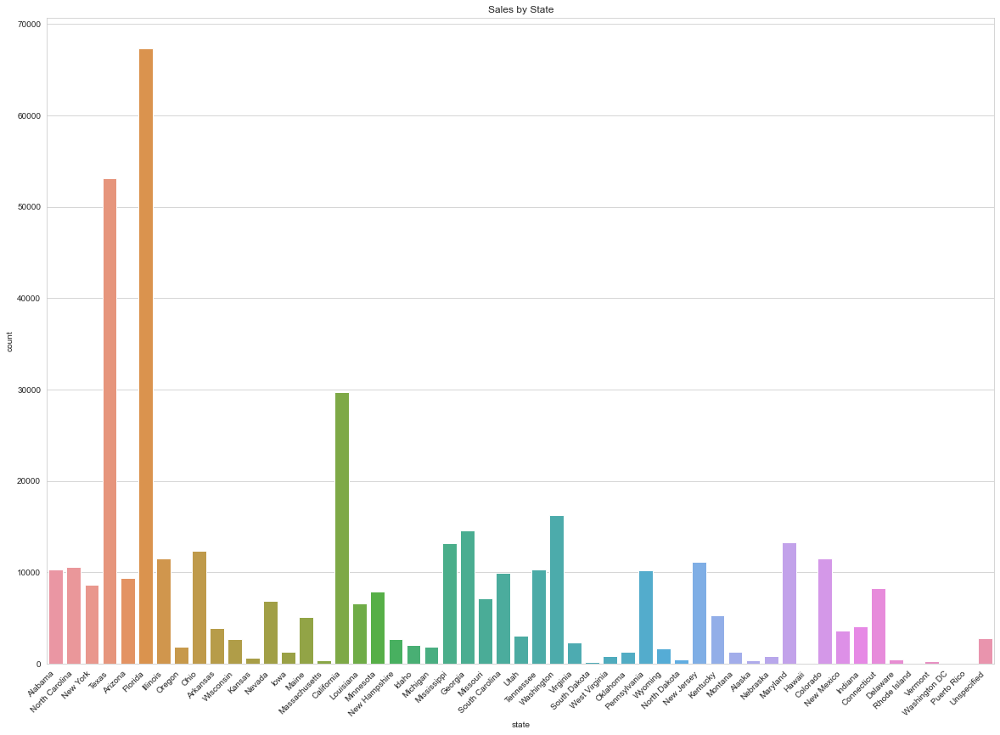

In [297]:
fig = plt.gcf()
fig.set_size_inches(20,14)
s = sns.countplot(df_new['state'])
s.set_xticklabels(s.get_xticklabels(),rotation=45 ,horizontalalignment='right')
plt.title('Sales by State')
plt.show()

# Count of people based on their total working years

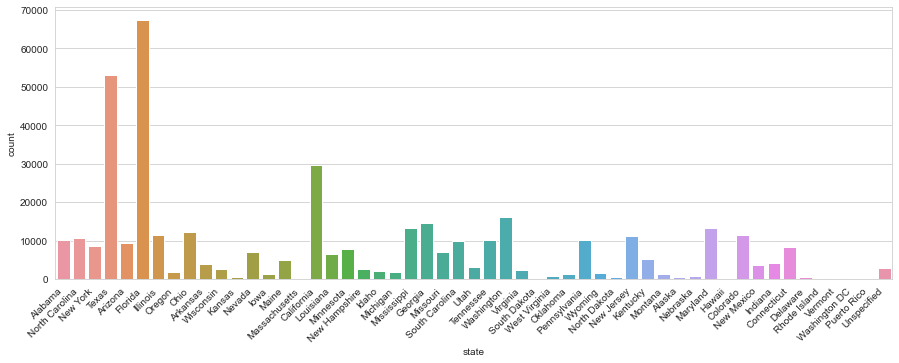

In [298]:
plt.subplots(figsize=(15,5))
s = sns.countplot(df_new.state)
s.set_xticklabels(s.get_xticklabels(),rotation=45,horizontalalignment='right')
plt.show()

# Target Variable

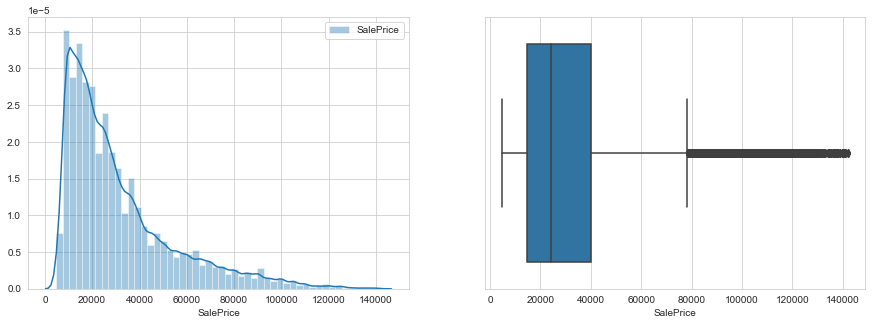

In [299]:
fig, (ax0, ax1) = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))
sns.distplot(df_new.SalePrice, bins=50, ax=ax0, label="SalePrice")
ax0.legend()
sns.boxplot(df_new.SalePrice, ax=ax1)
plt.show()

# Breast Cancer Wisconsin Data

In [302]:
df_bc = pd.read_csv("../../../data/datasets_180_408_data.csv")
df_bc.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,NaN


In [303]:
df_bc.drop("Unnamed: 32", 1 , inplace=True)


In [304]:
# y includes our labels and x includes our features
y = df_bc.diagnosis                          # M or B 
list = ['id','diagnosis']
x = df_bc.drop(list,axis = 1 )
x.head()

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


Number of Benign:  357
Number of Malignant :  212


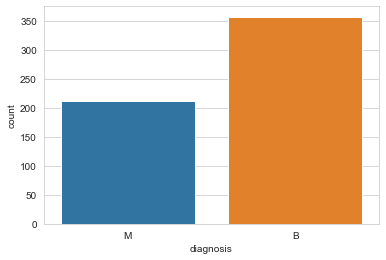

In [305]:
ax = sns.countplot(y,label="Count")       # M = 212, B = 357
B, M = y.value_counts()
print('Number of Benign: ',B)
print('Number of Malignant : ',M)

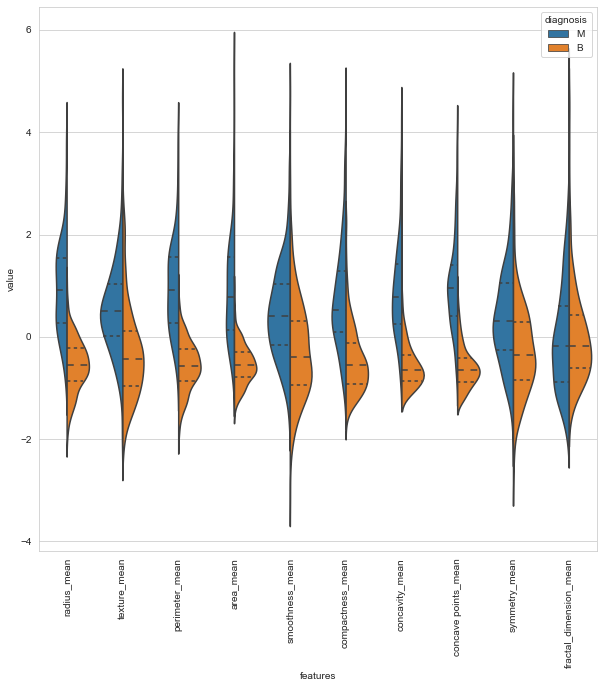

In [306]:
# first ten features
data_dia = y
data = x
data_n_2 = (data - data.mean()) / (data.std())              # standardization
data = pd.concat([y,data_n_2.iloc[:,0:10]],axis=1)
data = pd.melt(data,id_vars="diagnosis",
                    var_name="features",
                    value_name='value')
plt.figure(figsize=(10,10))
sns.violinplot(x="features", y="value", hue="diagnosis", data=data,split=True, inner="quart")
plt.xticks(rotation=90)
plt.show()

+ Lets interpret the plot above together. For example, in texture_mean feature, median of the Malignant and Benign looks like separated so it can be good for classification. However, in fractal_dimension_mean feature, median of the Malignant and Benign does not looks like separated so it does not gives good information for classification.

# Second ten features


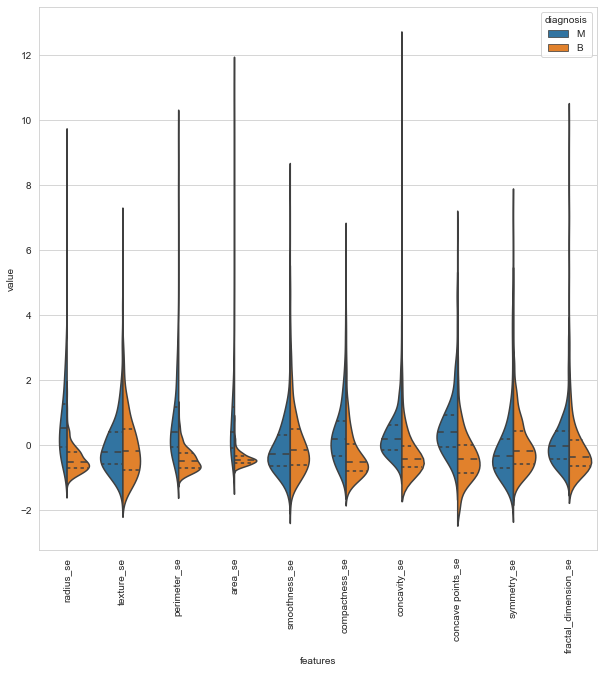

In [307]:
data = pd.concat([y,data_n_2.iloc[:,10:20]],axis=1)
data = pd.melt(data,id_vars="diagnosis",
                    var_name="features",
                    value_name='value')
plt.figure(figsize=(10,10))
sns.violinplot(x="features", y="value", hue="diagnosis", data=data,split=True, inner="quart")
plt.xticks(rotation=90);

In [ ]:
# As an alternative of violin plot, box plot can be used
# box plots are also useful in terms of seeing outliers
# I do not visualize all features with box plot
# In order to show you lets have an example of box plot
# If you want, you can visualize other features as well.

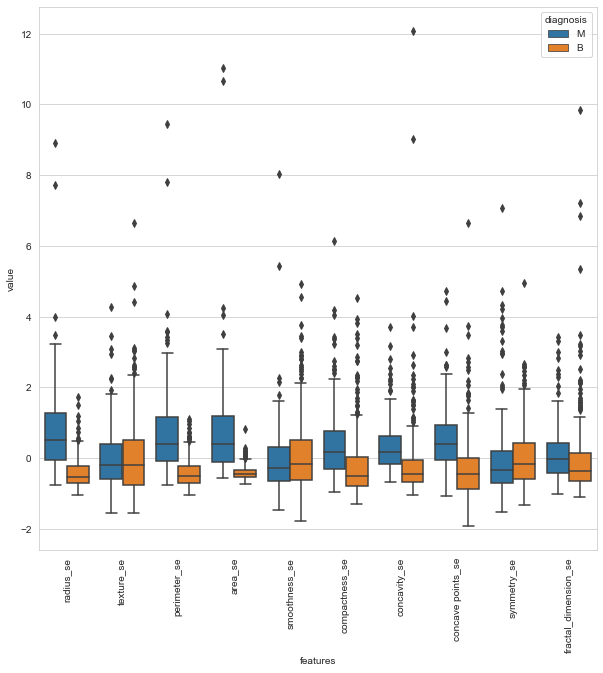

In [308]:
plt.figure(figsize=(10,10))
sns.boxplot(x="features", y="value", hue="diagnosis", data=data)
plt.xticks(rotation=90)
plt.show()

# Pokemon Data

In [312]:
pokemon = pd.read_csv("../../../data/original.csv", index_col=0, encoding="Unicode-escape")
pokemon.head()

,Name,Type 1,Type 2,Total,HP,Attack,Defense,Sp. Atk,Sp. Def,Speed,Stage,Legendary
#,,,,,,,,,,,,
1,Bulbasaur,Grass,Poison,318,45,49,49,65,65,45,1,False
2,Ivysaur,Grass,Poison,405,60,62,63,80,80,60,2,False
3,Venusaur,Grass,Poison,525,80,82,83,100,100,80,3,False
4,Charmander,Fire,NaN,309,39,52,43,60,50,65,1,False
5,Charmeleon,Fire,NaN,405,58,64,58,80,65,80,2,False


In [313]:
# Check the shape of the DataFrame
print('Pokemon Data - rows:' , pokemon.shape[0],'columns:', pokemon.shape[1])

Pokemon Data - rows: 151 columns: 12


In [314]:
pokemon.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 151 entries, 1 to 151
Data columns (total 12 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   Name       151 non-null    object
 1   Type 1     151 non-null    object
 2   Type 2     67 non-null     object
 3   Total      151 non-null    int64 
 4   HP         151 non-null    int64 
 5   Attack     151 non-null    int64 
 6   Defense    151 non-null    int64 
 7   Sp. Atk    151 non-null    int64 
 8   Sp. Def    151 non-null    int64 
 9   Speed      151 non-null    int64 
 10  Stage      151 non-null    int64 
 11  Legendary  151 non-null    bool  
dtypes: bool(1), int64(8), object(3)
memory usage: 14.3+ KB


In [315]:
print("There is {} missing values in the dataframe".format(pokemon.isnull().sum().sum()))

There is 84 missing values in the dataframe


In [316]:
# Checking for % of missing values
total = pokemon.isnull().sum().sort_values(ascending = False)
percent = (pokemon.isnull().sum()/pokemon.isnull().count()*100).sort_values(ascending = False)
pd.concat([total, percent], axis=1, keys=['Total', 'Percent']).transpose()

,Type 2,Legendary,Stage,Speed,Sp. Def,Sp. Atk,Defense,Attack,HP,Total,Type 1,Name
Total,84.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Percent,55.629139,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [317]:
pokemon.isna().sum()

Name          0
Type 1        0
Type 2       84
Total         0
HP            0
Attack        0
Defense       0
Sp. Atk       0
Sp. Def       0
Speed         0
Stage         0
Legendary     0
dtype: int64

In [318]:
# replacing white space in columns with "_"
new = [x.replace(" ","_") for x in pokemon.columns]
pokemon.columns = new

In [319]:
# check results
pokemon.columns

Index(['Name', 'Type_1', 'Type_2', 'Total', 'HP', 'Attack', 'Defense',
       'Sp._Atk', 'Sp._Def', 'Speed', 'Stage', 'Legendary'],
      dtype='object')

In [320]:
from mpl_toolkits.mplot3d import Axes3D

In [321]:
# Distribution graphs (histogram/bar graph) of column data
def plotPerColumnDistribution(pokemon, nGraphShown, nGraphPerRow):
    nunique = pokemon.nunique()
    pokemon = pokemon[[col for col in pokemon if nunique[col] > 1 and nunique[col] < 50]] # For displaying purposes, pick columns that have between 1 and 50 unique values
    nRow, nCol = pokemon.shape
#     columnNames = list(pokemon)
    columnNames = [i for i in pokemon.columns]
    nGraphRow = (nCol + nGraphPerRow - 1) / nGraphPerRow
    plt.figure(num = None, figsize = (6 * nGraphPerRow, 8 * nGraphRow), dpi = 80, facecolor = 'w', edgecolor = 'k')
    for i in range(min(nCol, nGraphShown)):
        plt.subplot(nGraphRow, nGraphPerRow, i + 1)
        columnDf = pokemon.iloc[:, i]
        if (not np.issubdtype(type(columnDf.iloc[0]), np.number)):
            valueCounts = columnDf.value_counts()
            valueCounts.plot.bar()
        else:
            columnDf.hist()
        plt.ylabel('counts')
        plt.xticks(rotation = 90)
        plt.title(f'{columnNames[i]} (column {i})')
    plt.tight_layout(pad = 1.0, w_pad = 1.0, h_pad = 1.0)
    plt.show()

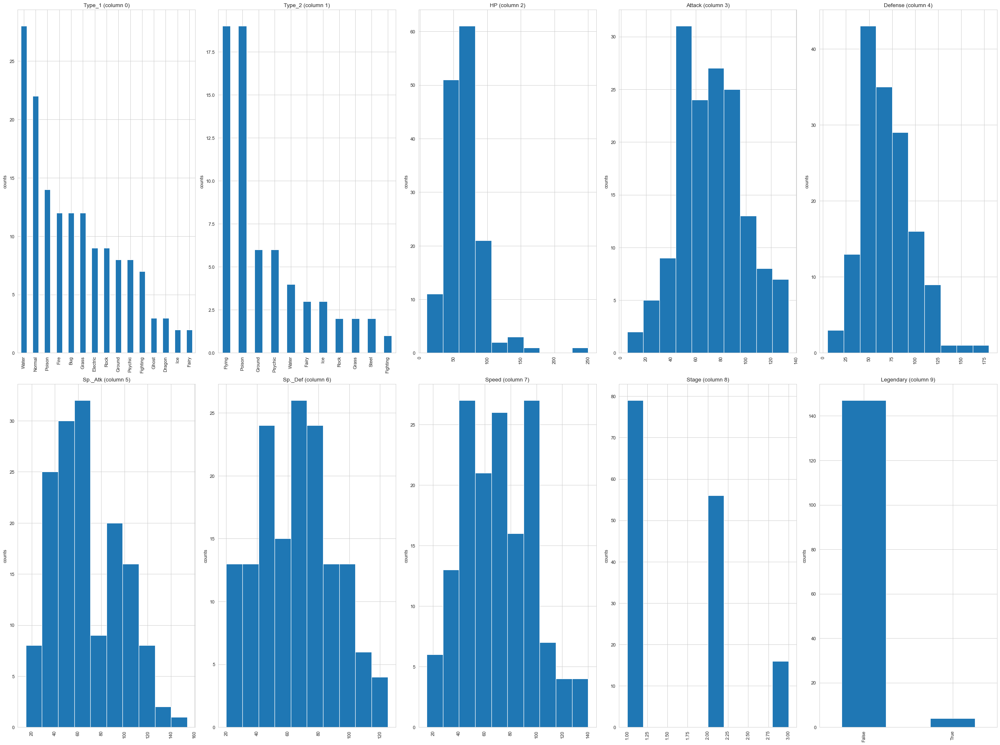

In [322]:
plotPerColumnDistribution(pokemon, 10, 5)

# Checking the type1 column

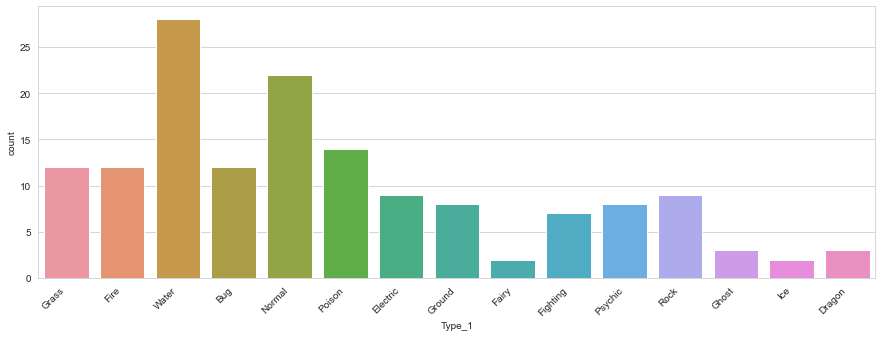

In [323]:
plt.subplots(figsize=(15,5))
s = sns.countplot(pokemon.Type_1)
s.set_xticklabels(s.get_xticklabels(),rotation=45,horizontalalignment='right')
plt.show()

# Legendery

In [324]:
pokemon["Legendary"].unique()

array([False,  True])

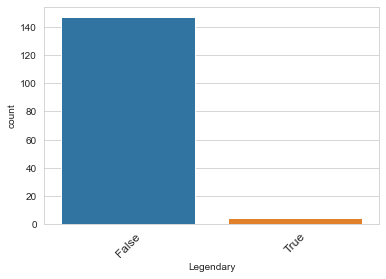

In [325]:
g = sns.countplot('Legendary',data=pokemon) 
g.set_xticklabels(g.get_xticklabels(), rotation = 45, fontsize = 12)
plt.show()

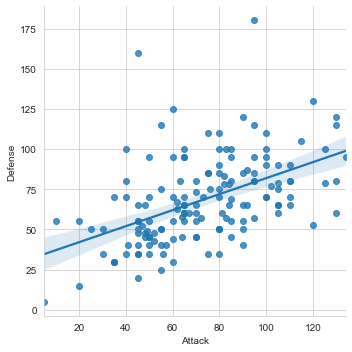

In [326]:
sns.lmplot(x="Attack",y="Defense", data=pokemon)
plt.show()

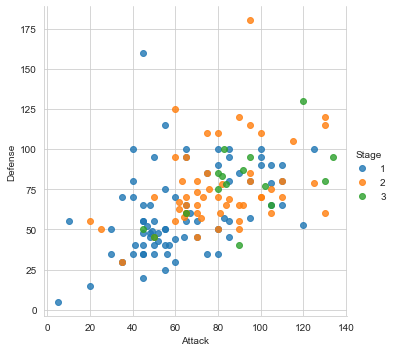

In [327]:
sns.lmplot(x="Attack",y="Defense", data=pokemon, fit_reg=False,hue="Stage");

In [ ]:
# boxplot

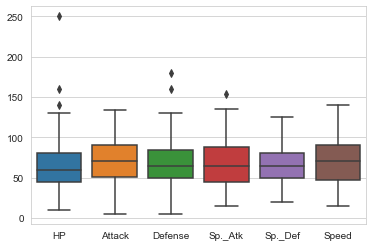

In [328]:
# first dropping the unnecessary columns
pokemon_2 = pokemon.drop(["Total","Stage","Legendary"], axis=1)

sns.boxplot(data=pokemon_2)
plt.show()

In [ ]:
# We can also represent the above with a violin plot

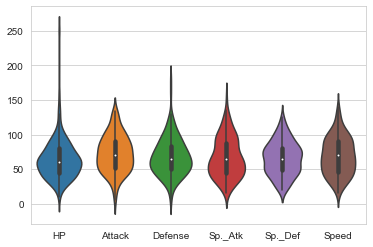

In [329]:
sns.violinplot(data=pokemon_2)
plt.show()

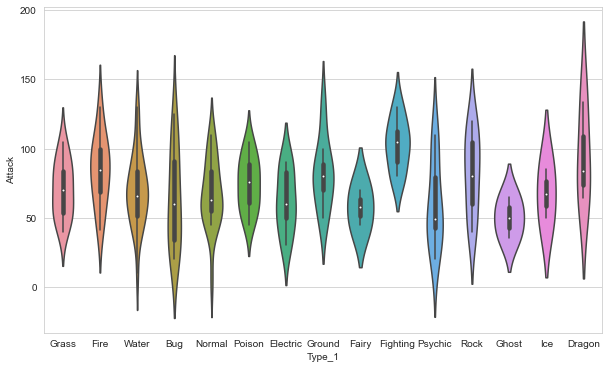

In [330]:
# using the violin plot to measure the distribution of various attributes
plt.figure(figsize=(10,6))
sns.violinplot(x="Type_1", y="Attack", data=pokemon_2)
plt.show()

# Heatmap

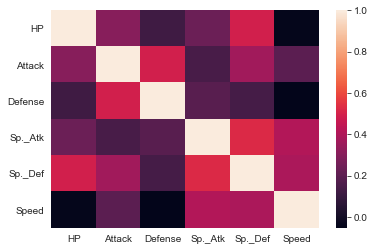

In [331]:
corr = pokemon_2.corr()
sns.heatmap(corr)
plt.show()

# Histogram


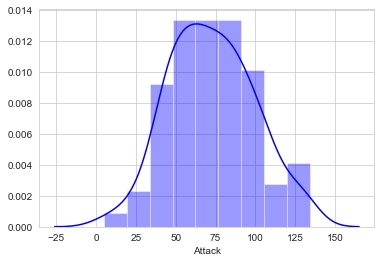

In [332]:
sns.distplot(pokemon["Attack"], color="blue")
plt.show()

# Countplot for Type_2 column

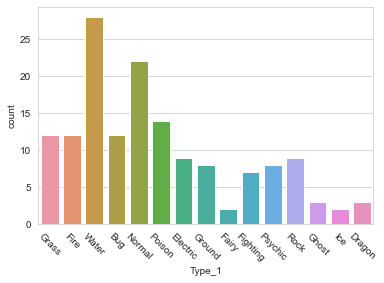

In [333]:
sns.countplot(x="Type_1", data=pokemon)
plt.xticks(rotation=-45)
plt.show()

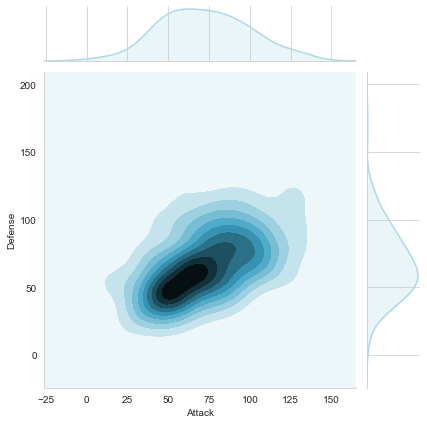

In [334]:
sns.jointplot(pokemon.Attack, pokemon.Defense, kind="kde",color="lightblue")
plt.show()

# Using plotly

In [335]:
import plotly.express as px

In [336]:
fig = px.scatter(pokemon, x="Attack",y="Defense")
fig.show()

In [337]:
fig = px.scatter(pokemon,x="Attack",y="Defense",color="Stage",hover_data=["Name"])
fig.show()

In [338]:
fig = px.scatter(pokemon,x="Attack",y="Defense",color="Type_1",size="Total",hover_data=["Name"])
fig.show()

In [339]:
x = list(range(pokemon.shape[0]))

y = pokemon["Total"].sort_values()


fig = px.line(pokemon,x,y,labels={"x":"Pokemon Rank", "y":"Total Score"},hover_data=["Name"])
fig.show()

TypeError: 'list' object is not callable

# lets sort out the above error


In [340]:
x = [f for f in range(pokemon.shape[0]) if f not in ['Total']]
y = pokemon["Total"].sort_values()

fig = px.line(pokemon,x,y,labels={"x":"Pokemon Rank","y":"Total Score"}, hover_data=["Name"])
fig.show()

In [341]:
pokemon.columns

Index(['Name', 'Type_1', 'Type_2', 'Total', 'HP', 'Attack', 'Defense',
       'Sp._Atk', 'Sp._Def', 'Speed', 'Stage', 'Legendary'],
      dtype='object')

In [342]:
df_copy = pokemon.drop(["Name","Type_1","Type_2","Total","Stage","Legendary"],axis=1)

fig = px.box(df_copy)
fig.show()

In [343]:
fig = px.violin(df_copy)
fig.show()

In [344]:
fig = px.violin(pokemon, x="Type_1",y="Attack",color="Type_1")
fig.show()


In [345]:
corr = df_copy.corr()
labels = list(df_copy)

fig = px.imshow(corr , x=labels ,y=labels)
fig.show()

TypeError: 'list' object is not callable

# fixing the error above

In [346]:
corr = df_copy.corr()
labels = [i for i in df_copy]

fig = px.imshow(corr , x=labels ,y=labels)
fig.show()

In [347]:
fig = px.histogram(pokemon , x="Attack")
fig.show()

In [348]:
fig = px.density_heatmap(pokemon, x="Attack",y="Defense")
fig.show()

# Wind data

In [350]:
wind_df = px.data.wind()
wind_df.head()

,direction,strength,frequency
0,N,0-1,0.5
1,NNE,0-1,0.6
2,NE,0-1,0.5
3,ENE,0-1,0.4
4,E,0-1,0.4


In [351]:
fig = px.bar_polar(wind_df, r="frequency", theta="direction",
                   color="strength", template="plotly_dark",
                   color_discrete_sequence= px.colors.sequential.Plasma_r)
fig.show()

In [352]:
fig = go.Figure()

fig.add_trace(go.Barpolar(
    r=[77.5, 72.5, 70.0, 45.0, 22.5, 42.5, 40.0, 62.5],
    name='11-14 m/s',
    marker_color='rgb(106,81,163)'
))
fig.add_trace(go.Barpolar(
    r=[57.5, 50.0, 45.0, 35.0, 20.0, 22.5, 37.5, 55.0],
    name='8-11 m/s',
    marker_color='rgb(158,154,200)'
))
fig.add_trace(go.Barpolar(
    r=[40.0, 30.0, 30.0, 35.0, 7.5, 7.5, 32.5, 40.0],
    name='5-8 m/s',
    marker_color='rgb(203,201,226)'
))
fig.add_trace(go.Barpolar(
    r=[20.0, 7.5, 15.0, 22.5, 2.5, 2.5, 12.5, 22.5],
    name='< 5 m/s',
    marker_color='rgb(242,240,247)'
))

fig.update_traces(text=['North', 'N-E', 'East', 'S-E', 'South', 'S-W', 'West', 'N-W'])
fig.update_layout(
    title='Wind Speed Distribution in Laurel, NE',
    font_size=16,
    legend_font_size=16,
    polar_radialaxis_ticksuffix='%',
    polar_angularaxis_rotation=90,

)
fig.show()

# Avocado Price Data

In [85]:
data = pd.read_csv("../../../data/avocado.csv")
data.head()

,Unnamed: 0,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region
0,0,2015-12-27,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,conventional,2015,Albany
1,1,2015-12-20,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,conventional,2015,Albany
2,2,2015-12-13,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,conventional,2015,Albany
3,3,2015-12-06,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,conventional,2015,Albany
4,4,2015-11-29,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,conventional,2015,Albany


## Feature Descriptions:
* Date - The date of the observation
* AveragePrice - the average price of a single avocado
* type - conventional or organic
* year - the year
* Region - the city or region of the observation
* Total Volume - Total number of avocados sold
* 4046 - Total number of avocados with PLU 4046 sold
* 4225 - Total number of avocados with PLU 4225 sold
* 4770 - Total number of avocados with PLU 4770 sold

In [86]:
# data shape:
row, columns = data.shape
print("Data Row:", row)
print("Data Columns:", columns)

Data Row: 18249
Data Columns: 14


In [87]:
# column names:
data.columns

Index(['Unnamed: 0', 'Date', 'AveragePrice', 'Total Volume', '4046', '4225',
       '4770', 'Total Bags', 'Small Bags', 'Large Bags', 'XLarge Bags', 'type',
       'year', 'region'],
      dtype='object')

In [88]:
# Drop unnamned column
data.drop("Unnamed: 0",axis=1,inplace=True)

In [89]:
# descriptions 
display(data.describe().T)

,count,mean,std,min,25%,50%,75%,max
AveragePrice,18249.0,1.405978,4.026766e-01,0.44,1.10,1.37,1.66,3.25
Total Volume,18249.0,850644.013009,3.453545e+06,84.56,10838.58,107376.76,432962.29,62505646.52
4046,18249.0,293008.424531,1.264989e+06,0.00,854.07,8645.30,111020.20,22743616.17
4225,18249.0,295154.568356,1.204120e+06,0.00,3008.78,29061.02,150206.86,20470572.61
4770,18249.0,22839.735993,1.074641e+05,0.00,0.00,184.99,6243.42,2546439.11
Total Bags,18249.0,239639.202060,9.862424e+05,0.00,5088.64,39743.83,110783.37,19373134.37
Small Bags,18249.0,182194.686696,7.461785e+05,0.00,2849.42,26362.82,83337.67,13384586.80
Large Bags,18249.0,54338.088145,2.439660e+05,0.00,127.47,2647.71,22029.25,5719096.61
XLarge Bags,18249.0,3106.426507,1.769289e+04,0.00,0.00,0.00,132.50,551693.65
year,18249.0,2016.147899,9.399385e-01,2015.00,2015.00,2016.00,2017.00,2018.00


In [90]:
# regions
data.region.unique()

array(['Albany', 'Atlanta', 'BaltimoreWashington', 'Boise', 'Boston',
       'BuffaloRochester', 'California', 'Charlotte', 'Chicago',
       'CincinnatiDayton', 'Columbus', 'DallasFtWorth', 'Denver',
       'Detroit', 'GrandRapids', 'GreatLakes', 'HarrisburgScranton',
       'HartfordSpringfield', 'Houston', 'Indianapolis', 'Jacksonville',
       'LasVegas', 'LosAngeles', 'Louisville', 'MiamiFtLauderdale',
       'Midsouth', 'Nashville', 'NewOrleansMobile', 'NewYork',
       'Northeast', 'NorthernNewEngland', 'Orlando', 'Philadelphia',
       'PhoenixTucson', 'Pittsburgh', 'Plains', 'Portland',
       'RaleighGreensboro', 'RichmondNorfolk', 'Roanoke', 'Sacramento',
       'SanDiego', 'SanFrancisco', 'Seattle', 'SouthCarolina',
       'SouthCentral', 'Southeast', 'Spokane', 'StLouis', 'Syracuse',
       'Tampa', 'TotalUS', 'West', 'WestTexNewMexico'], dtype=object)

In [91]:
# regions of counts
print(data["region"].value_counts(dropna=False))

Nashville              338
Denver                 338
Tampa                  338
SouthCarolina          338
Seattle                338
CincinnatiDayton       338
California             338
StLouis                338
Orlando                338
Sacramento             338
Midsouth               338
Columbus               338
Boston                 338
RaleighGreensboro      338
West                   338
Boise                  338
MiamiFtLauderdale      338
SanDiego               338
Chicago                338
Roanoke                338
HartfordSpringfield    338
HarrisburgScranton     338
LosAngeles             338
BaltimoreWashington    338
Philadelphia           338
Spokane                338
BuffaloRochester       338
Syracuse               338
DallasFtWorth          338
GreatLakes             338
GrandRapids            338
SouthCentral           338
Pittsburgh             338
NewOrleansMobile       338
Albany                 338
Charlotte              338
Southeast              338
D

In [ ]:
# Plot Regions

In [93]:
# class distribution 
print("Data is not balanced:",data.groupby('type').size())

Data is not balanced: type
conventional    9126
organic         9123
dtype: int64


In [94]:
# Dataset Correlation
data.corr()

,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,year
AveragePrice,1.000000,-0.192752,-0.208317,-0.172928,-0.179446,-0.177088,-0.174730,-0.172940,-0.117592,0.093197
Total Volume,-0.192752,1.000000,0.977863,0.974181,0.872202,0.963047,0.967238,0.880640,0.747157,0.017193
4046,-0.208317,0.977863,1.000000,0.926110,0.833389,0.920057,0.925280,0.838645,0.699377,0.003353
4225,-0.172928,0.974181,0.926110,1.000000,0.887855,0.905787,0.916031,0.810015,0.688809,-0.009559
4770,-0.179446,0.872202,0.833389,0.887855,1.000000,0.792314,0.802733,0.698471,0.679861,-0.036531
Total Bags,-0.177088,0.963047,0.920057,0.905787,0.792314,1.000000,0.994335,0.943009,0.804233,0.071552
Small Bags,-0.174730,0.967238,0.925280,0.916031,0.802733,0.994335,1.000000,0.902589,0.806845,0.063915
Large Bags,-0.172940,0.880640,0.838645,0.810015,0.698471,0.943009,0.902589,1.000000,0.710858,0.087891
XLarge Bags,-0.117592,0.747157,0.699377,0.688809,0.679861,0.804233,0.806845,0.710858,1.000000,0.081033
year,0.093197,0.017193,0.003353,-0.009559,-0.036531,0.071552,0.063915,0.087891,0.081033,1.000000


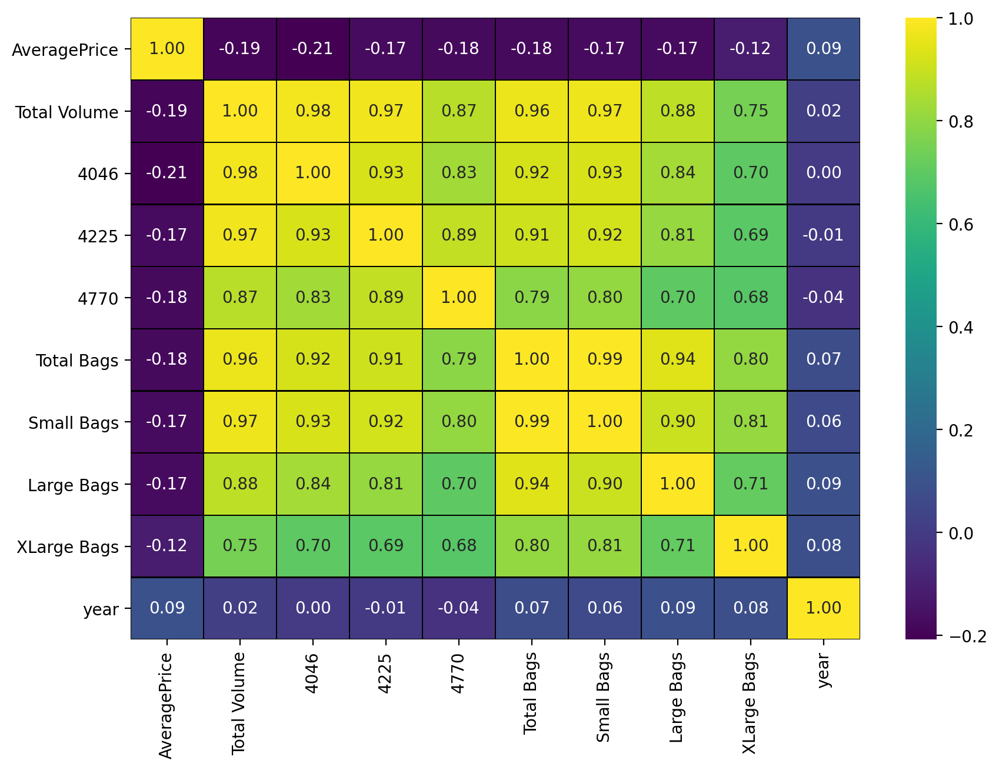

In [96]:
f,ax = plt.subplots(figsize = (10,7))
#data.drop("Unnamed: 0",axis=1,inplace=True)
sns.heatmap(data.corr(), annot=True,cmap = 'viridis', linewidths=0.5,linecolor="black", fmt= '.2f',ax=ax);

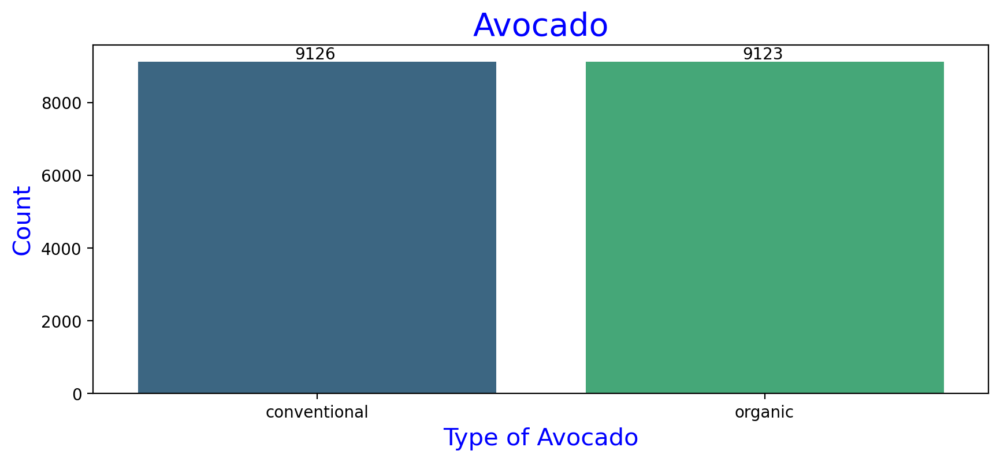

In [98]:
f,ax = plt.subplots(figsize = (10,4))
ax = sns.countplot(x=data.type,label="Count",palette="viridis")
plt.xlabel('Type of Avocado',fontsize = 15,color='blue')
plt.ylabel('Count',fontsize = 15,color='blue')
plt.title('Avocado',fontsize = 20,color='blue')
#total = len(data['year'])
# how to show counts:
for p in ax.patches:
        ax.annotate('{:.0f}'.format(p.get_height()), (p.get_x()+0.35, p.get_height()+75))

Text(0, 0.5, 'Average Price')

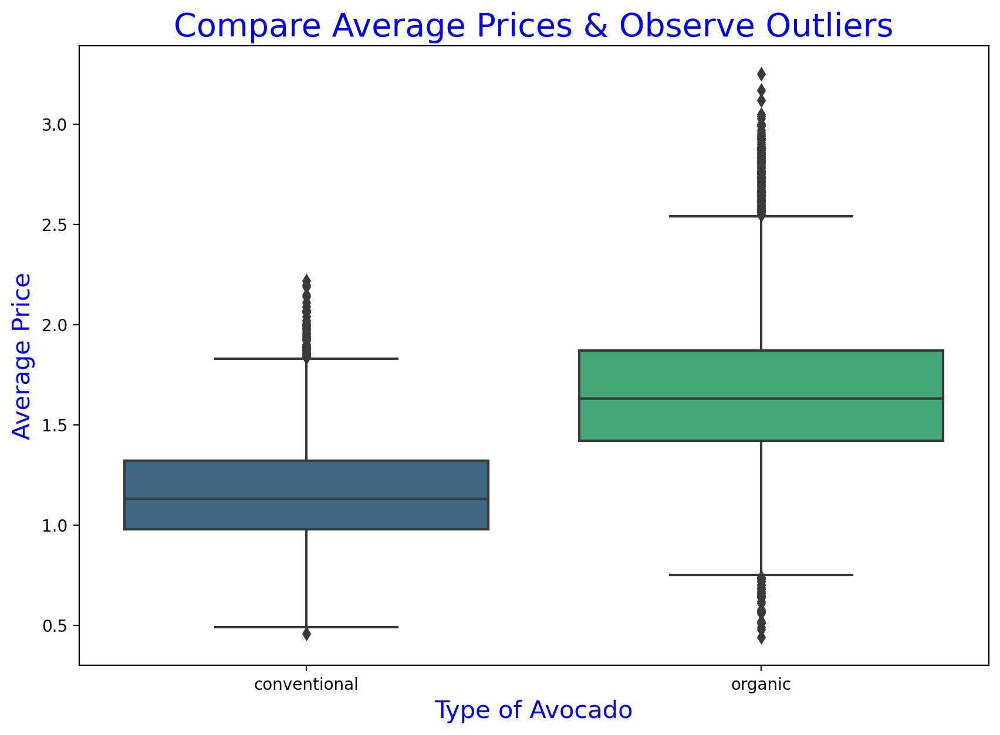

In [99]:
f,ax = plt.subplots(figsize = (10,7))
sns.boxplot(x="type", y="AveragePrice",data=data,palette="viridis");
plt.title("Compare Average Prices & Observe Outliers",fontsize = 20,color='blue')
plt.xlabel('Type of Avocado',fontsize = 15,color='blue')
plt.ylabel('Average Price',fontsize = 15,color='blue')

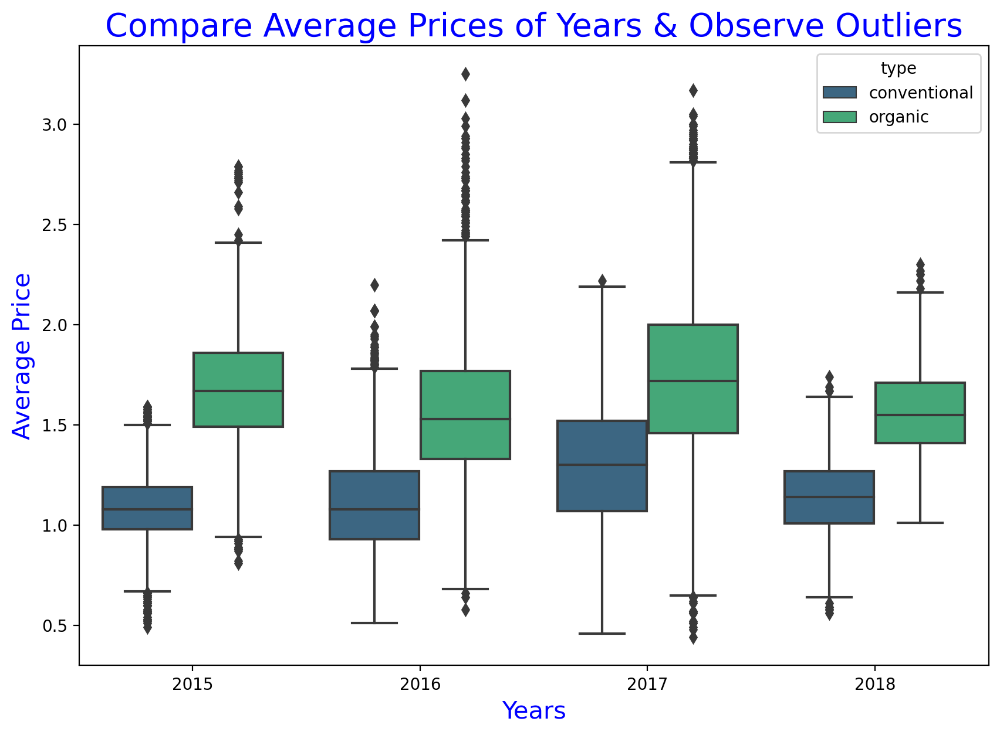

In [101]:
f,ax = plt.subplots(figsize = (10,7))
sns.boxplot(x="year", y="AveragePrice",hue="type",data=data,palette="viridis");
plt.title("Compare Average Prices of Years & Observe Outliers",fontsize = 20,color='blue')
plt.xlabel('Years',fontsize = 15,color='blue')
plt.ylabel('Average Price',fontsize = 15,color='blue');

Text(0, 0.5, 'Average Price')

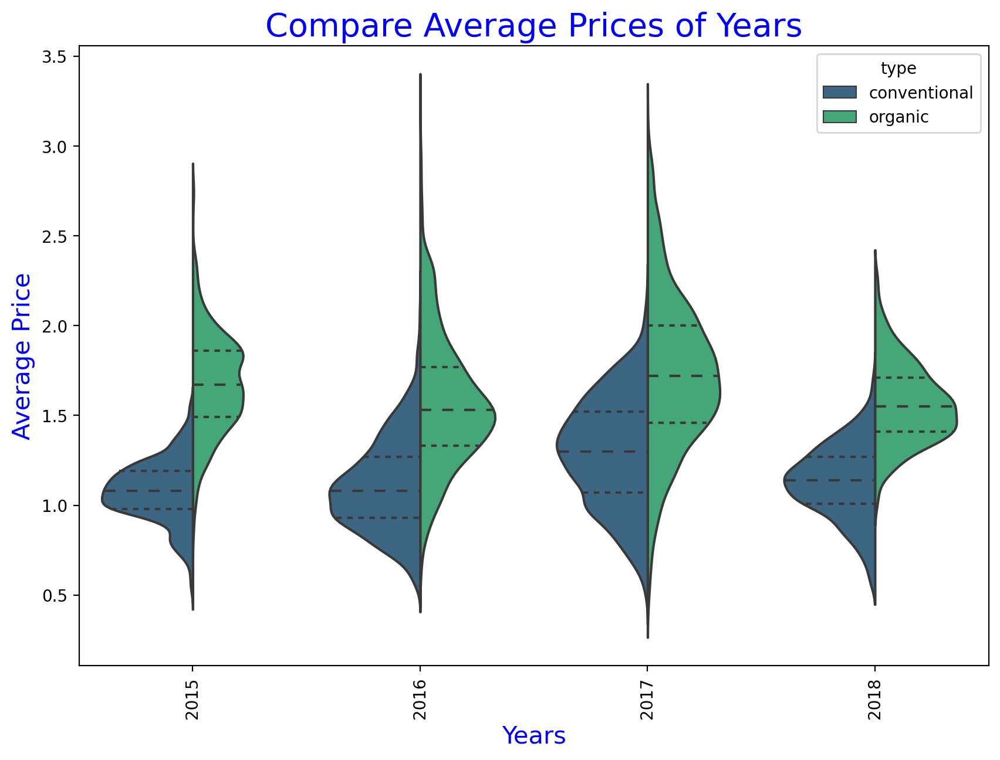

In [102]:
f,ax = plt.subplots(figsize = (10,7))
sns.violinplot(x="year", y="AveragePrice", hue="type", data=data,split=True, inner="quart",palette="viridis")
plt.xticks(rotation=90)
plt.title("Compare Average Prices of Years",fontsize = 20,color='blue')
plt.xlabel('Years',fontsize = 15,color='blue')
plt.ylabel('Average Price',fontsize = 15,color='blue')

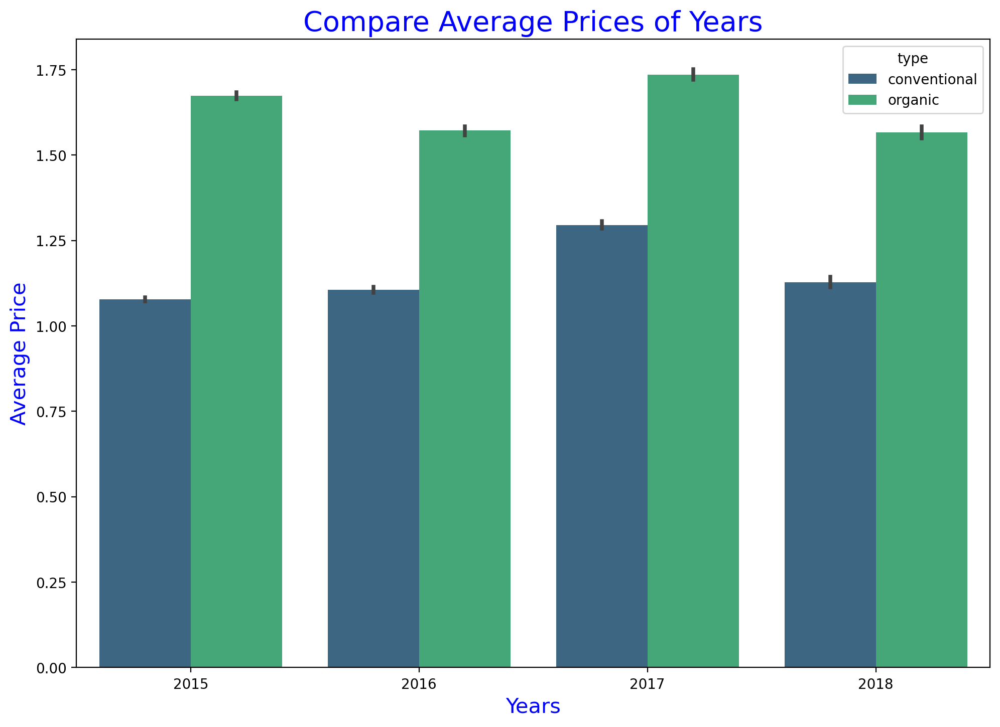

In [104]:
f,ax = plt.subplots(figsize = (10,7))
sns.barplot(x="year", y="AveragePrice",hue="type",data=data,palette="viridis")
plt.tight_layout() 
plt.title("Compare Average Prices of Years",fontsize = 20,color='blue')
plt.xlabel('Years',fontsize = 15,color='blue')
plt.ylabel('Average Price',fontsize = 15,color='blue');

In [105]:
# Split Dataset, "conventional & organic"
data_con = data[data["type"] == "conventional"]
data_org = data[data["type"] == "organic"]

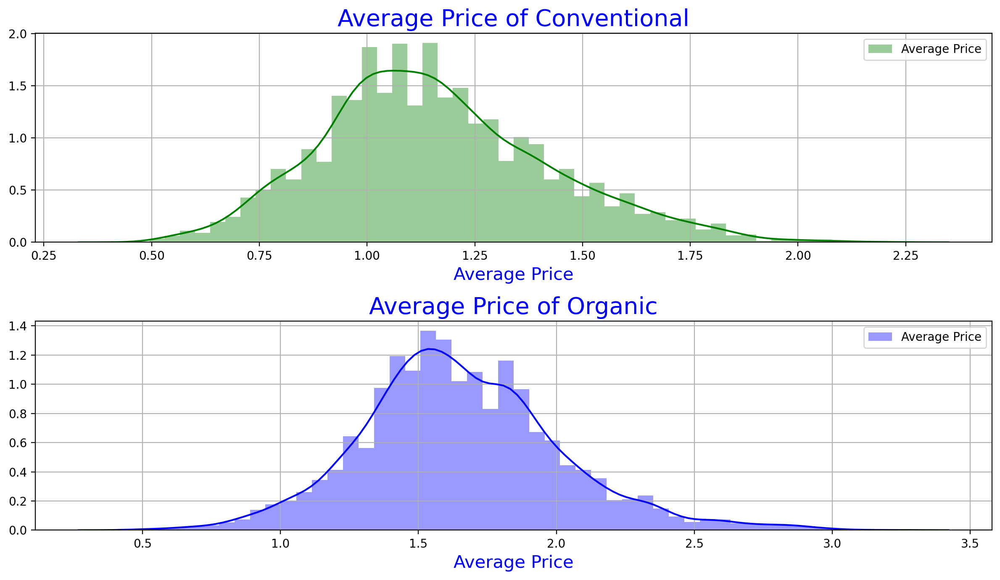

In [109]:
f,ax = plt.subplots(figsize = (12,7))
plt.subplot(2,1,1) # ikiye birlik düzlemde ilk grafik
sns.distplot(data_con.AveragePrice,color="green",label="Average Price");
plt.title("Average Price of Conventional",fontsize = 20,color='blue')
plt.xlabel('Average Price',fontsize = 15,color='blue')
plt.legend()
plt.grid()
#
plt.subplot(2,1,2)
sns.distplot(data_org.AveragePrice,color="blue",label="Average Price");
plt.title("Average Price of Organic",fontsize = 20,color='blue')
plt.xlabel('Average Price',fontsize = 15,color='blue')
plt.tight_layout() 
plt.legend()
plt.grid()

In [ ]:
# Price Per Region

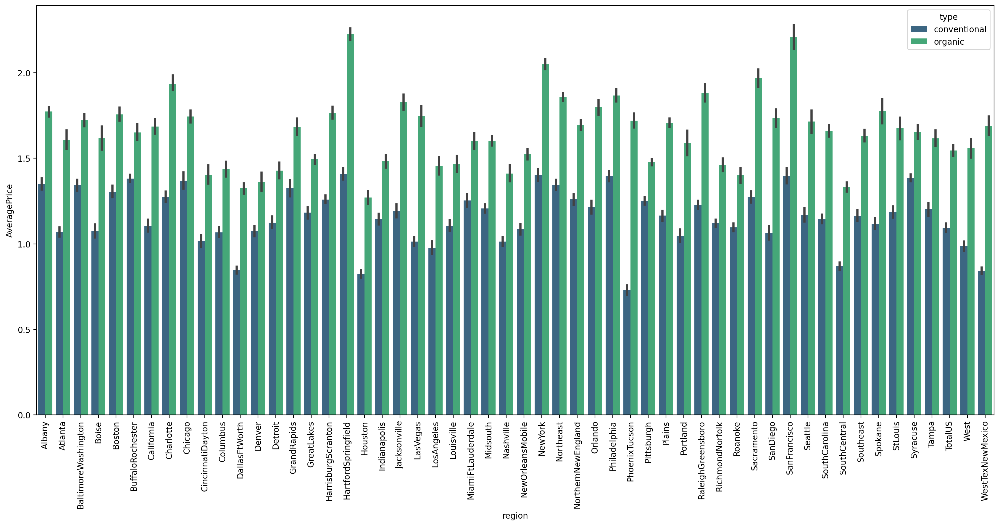

In [110]:
# Avocado Average Price
f,ax = plt.subplots(figsize = (17,9))
sns.barplot(x="region", y="AveragePrice",hue="type",data=data,palette="viridis")
plt.xticks(rotation=90)
plt.tight_layout()

# Cardiovascular diseases Data

In [10]:
path = '../../../data/cardio_train.csv'  # note i kept the csv file in dataset file so its easy to call from there
cardio_df=pd.read_csv(path, na_values='NA')
cardio_df.head()

,id;age;gender;height;weight;ap_hi;ap_lo;cholesterol;gluc;smoke;alco;active;cardio
0,988;22469;1;155;69.0;130;80;2;2;0;0;1;0
1,989;14648;1;163;71.0;110;70;1;1;0;0;1;1
2,990;21901;1;165;70.0;120;80;1;1;0;0;1;0
3,991;14549;2;165;85.0;120;80;1;1;1;1;1;0
4,992;23393;1;155;62.0;120;80;1;1;0;0;1;0


# Observation:
+ Data looks messy and a simple trick will put it in order

In [18]:
cardio_df = pd.read_csv(path , na_values = 'NA' , sep=";")
cardio_df.head()

,id,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
0,988,22469,1,155,69.0,130,80,2,2,0,0,1,0
1,989,14648,1,163,71.0,110,70,1,1,0,0,1,1
2,990,21901,1,165,70.0,120,80,1,1,0,0,1,0
3,991,14549,2,165,85.0,120,80,1,1,1,1,1,0
4,992,23393,1,155,62.0,120,80,1,1,0,0,1,0


In [19]:
# Fixing columns - you can also use .title() or .upper()
new = [col.capitalize() for col in cardio_df.columns]
cardio_df.columns = new

In [360]:
# Checking results
cardio_df.columns

Index(['Id', 'Age', 'Gender', 'Height', 'Weight', 'Ap_hi', 'Ap_lo',
       'Cholesterol', 'Gluc', 'Smoke', 'Alco', 'Active', 'Cardio'],
      dtype='object')

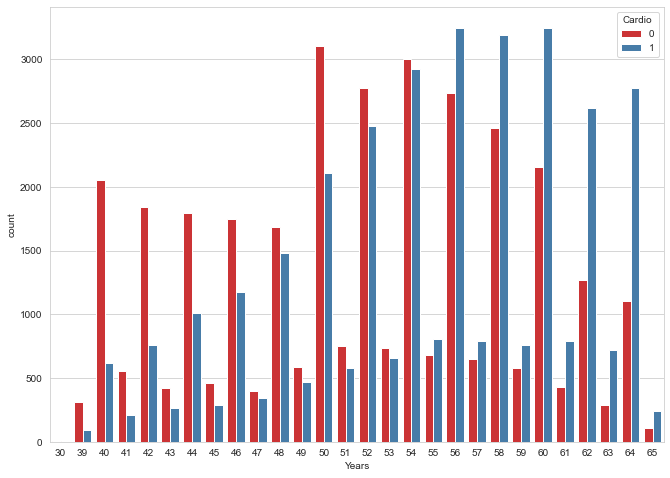

In [361]:
from matplotlib import rcParams
rcParams['figure.figsize'] = 11,8
cardio_df['Years'] = (cardio_df['Age'] / 365).round().astype('int')
sns.countplot(x='Years' , hue = 'Cardio' , data=cardio_df , palette='Set1');

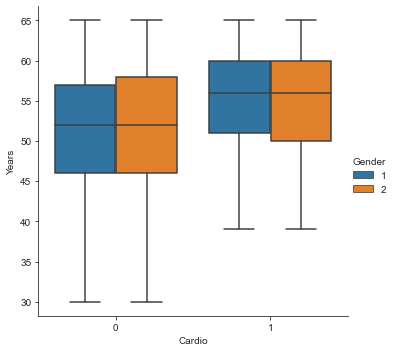

In [363]:
with sns.axes_style(style='ticks'):
            g = sns.catplot("Cardio", "Years", "Gender", data=cardio_df, kind="box")
            g.set_axis_labels("Cardio", "Years");

# Dealing with the Age column
+ Since the age is not in years but in months we will have to convert it into years

In [388]:
cardio_df.Age.head()

0    22469
1    14648
2    21901
3    14549
4    23393
Name: Age, dtype: int64

In [389]:
cardio_df['Age'] = (cardio_df['Age'] / 365).round().astype('int')

In [390]:
# Check results
cardio_df["Age"].head()

0    62
1    40
2    60
3    40
4    64
Name: Age, dtype: int64

# Check categorical columns

In [370]:
def get_cat(df):
    """get list of cat features from df"""
    cat = []
    for x in df.columns:
        if df[x].dtypes == 'object':
            cat.append(x)
    return cat

cat_cat = get_cat(cardio_df)
cat_cat

[]

# Observation:
+ Data has no categorical columns
+ This may also be misleading as Gender are represented with 1 and 2 for Male and Female respectively.
+ However, for machine learning to be possbile all features need to numerical, hence we wont be making any changes to the Gender column. But its a good thing to know in order not to be mislead.

# Get all Numerical columns

In [371]:
def get_nom(df):
    """get nom features"""
    nom = []
    for x in df.columns:
        if df[x].dtypes != 'object':
            nom.append(x)
    return nom[2:] # no need for feature id and age but customise according to df

In [373]:
num_cols = get_nom(cardio_df)
num_cols

['Gender',
 'Height',
 'Weight',
 'Ap_hi',
 'Ap_lo',
 'Cholesterol',
 'Gluc',
 'Smoke',
 'Alco',
 'Active',
 'Cardio',
 'Years']

# Creating Heatmap

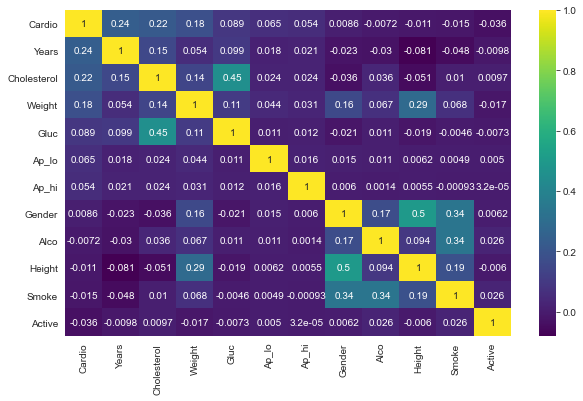

In [374]:
k = 15
target = 'Cardio'
cols = cardio_df[num_cols].corr().nlargest(k , target)[target].index
cm = cardio_df[cols].corr()
plt.figure(figsize = (10, 6))
sns.heatmap(cm , annot = True , cmap = 'viridis')
plt.show()

In [20]:
# make a copy of data
df1 = cardio_df.copy()

# Feature density plot

<Figure size 792x576 with 0 Axes>

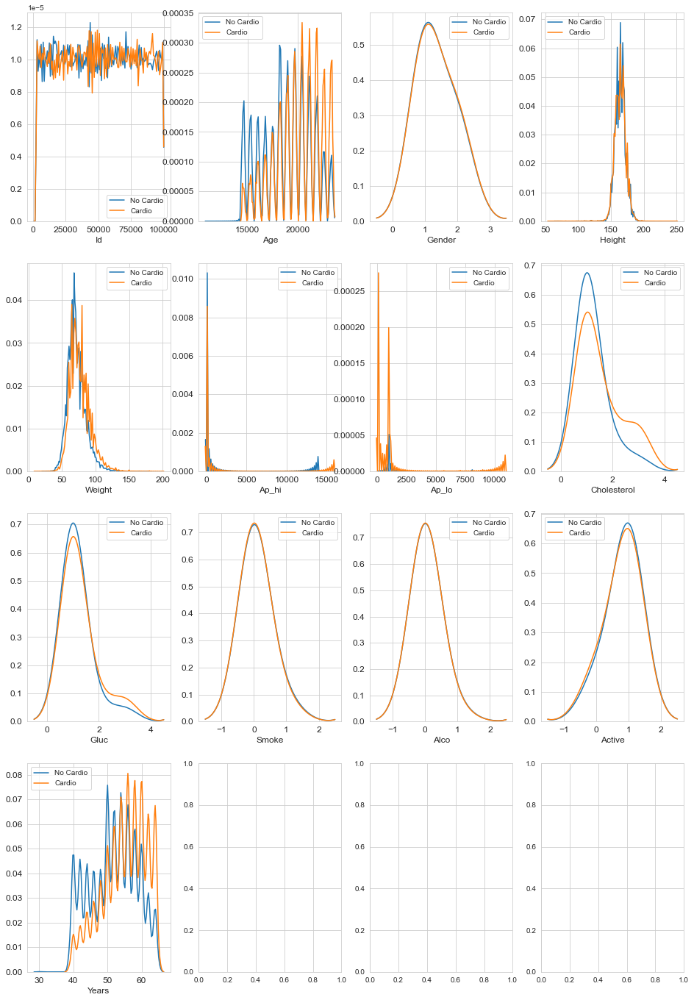

In [376]:
features = [f for f in df1.columns if f not in ['Cardio']]
target = 'Cardio'

i = 0
t0 = df1[df1['Cardio'] == 0]
t1 = df1[df1['Cardio'] == 1]

sns.set_style('whitegrid')
plt.figure()
fig, ax = plt.subplots(4,4,figsize=(16,24))

for feature in features:
    i += 1
    plt.subplot(4,4,i)
    sns.kdeplot(t0[feature], bw=0.5,label="No Cardio")
    sns.kdeplot(t1[feature], bw=0.5,label="Cardio")
    plt.xlabel(feature, fontsize=12)
    locs, labels = plt.xticks()
    plt.tick_params(axis='both', which='major', labelsize=12)
plt.show()

# Distribution of Target variable

In [377]:
cardio_df["Cardio"].value_counts()

0    34679
1    34622
Name: Cardio, dtype: int64

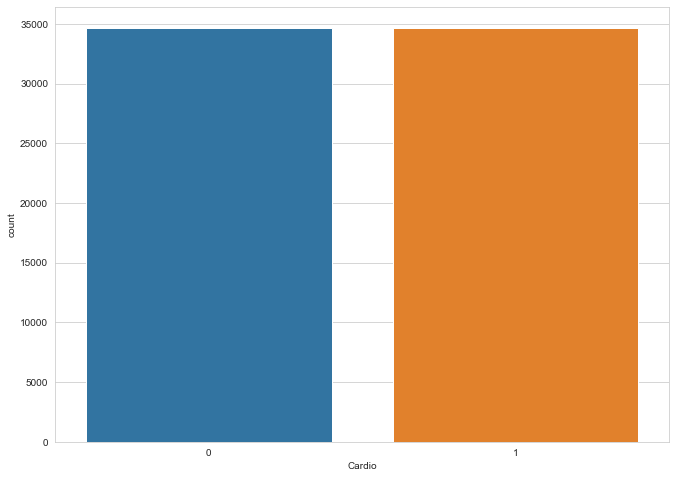

In [378]:
# Plot the above
sns.countplot(cardio_df['Cardio'],label="Count")
plt.show()

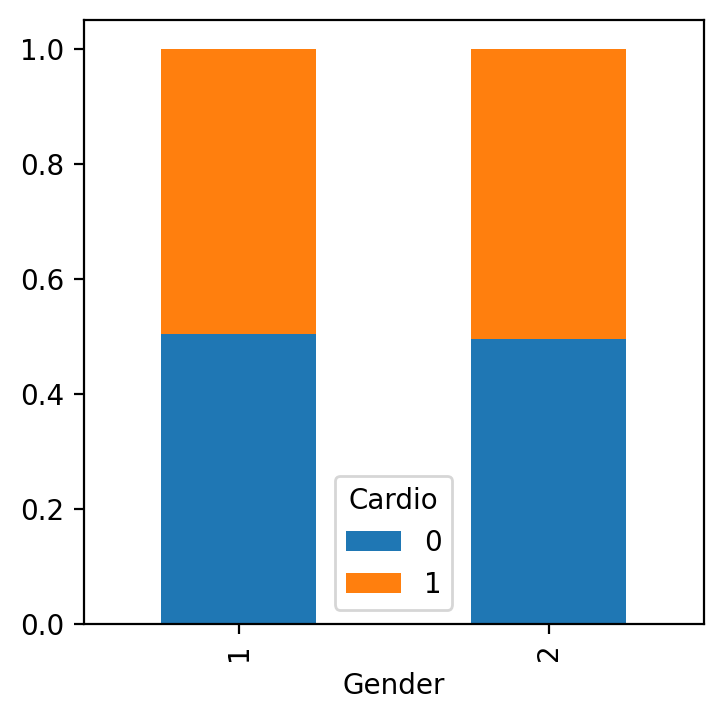

In [113]:
Gender=pd.crosstab(cardio_df['Gender'],cardio_df['Cardio'])
Gender.div(Gender.sum(1).astype(float), axis=0).plot(kind="bar", stacked=True, figsize=(4,4));

# Correlation analysis

In [382]:
cardio_df.drop("Id",1,inplace=True)

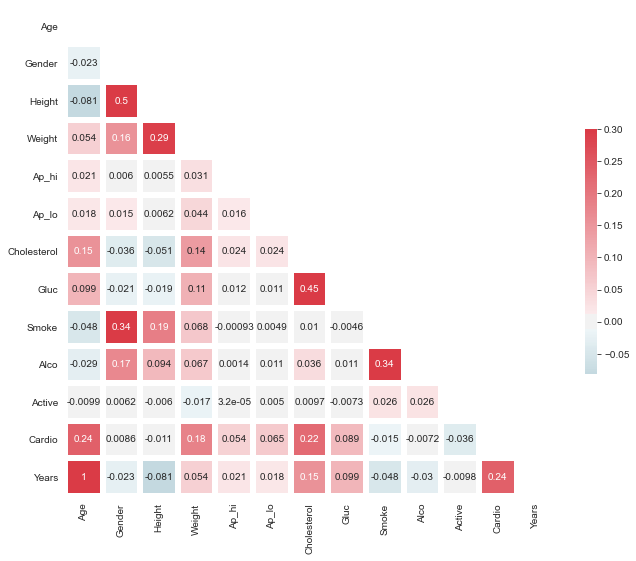

In [383]:
corr = cardio_df.corr()
cmap = sns.diverging_palette(220,10, as_cmap=True)
"""Generate a mask for the upper triangle"""
mask = np.zeros_like(corr , dtype=np.bool)
mask[np.triu_indices_from(mask)]=True 
"""Set up the matplotlib figure"""
f , ax = plt.subplots(figsize=(11,9))
"""Draw the heatmap with the mask and correct aspect ratio"""
sns.heatmap(corr , mask = mask , cmap=cmap , vmax=.3, center=0 , annot=True,
           square = True , linewidths=5 , cbar_kws={'shrink':.5});

# Plot the to find age distribution for Cardio Patients

In [391]:
cardio_df.Age.max()

65

In [392]:
cardio_df.Age.min()

30

In [13]:
cardio_df.columns

Index(['id', 'age', 'gender', 'height', 'weight', 'ap_hi', 'ap_lo',
       'cholesterol', 'gluc', 'smoke', 'alco', 'active', 'cardio'],
      dtype='object')

In [27]:
cardio_df2 = cardio_df.copy()

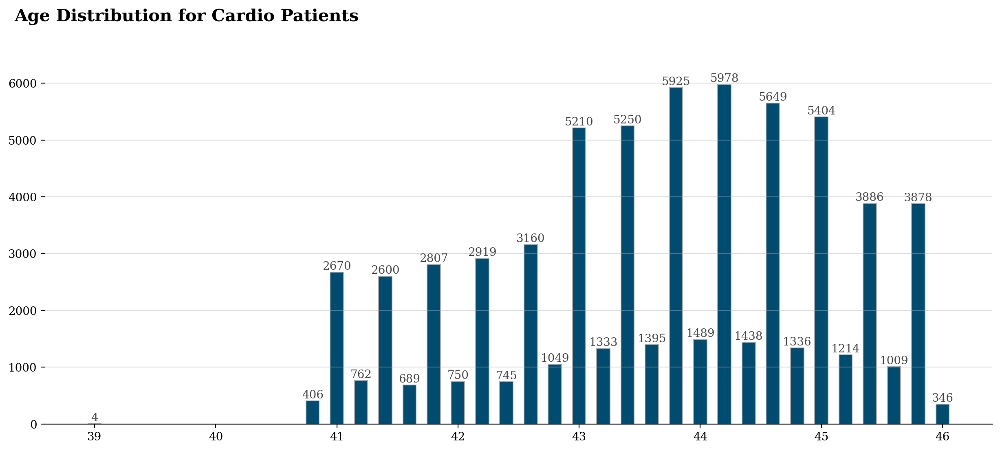

In [34]:
fig, ax = plt.subplots(1,1, figsize=(15, 6))
data_q1 = cardio_df['Age'].value_counts().sort_index()
ax.bar(data_q1.index, data_q1, width=0.55, 
       edgecolor='darkgray', color='#004c70',
       linewidth=0.7)

for i in data_q1.index:
    ax.annotate(f"{data_q1[i]}", 
                   xy=(i, data_q1[i] + 100),
                   va = 'center', ha='center',fontweight='light', fontfamily='serif',
                   color='#4a4a4a')


for s in ['top', 'left', 'right']:
    ax.spines[s].set_visible(False)   

ax.set_ylim(0, 6500)    
ax.set_xticklabels(data_q1.index, fontfamily='serif')
ax.set_yticklabels(np.arange(0, 6501, 1000),fontfamily='serif')
fig.text(0.1, 0.95, 'Age Distribution for Cardio Patients', fontsize=15, fontweight='bold', fontfamily='serif')    
ax.grid(axis='y', linestyle='-', alpha=0.4)    
plt.show()

In [51]:
# Make a copy of data for plot
cardio_df2 = cardio_df.copy()

In [52]:
cardio_df2.head()

,Id,Age,Gender,Height,Weight,Ap_hi,Ap_lo,Cholesterol,Gluc,Smoke,Alco,Active,Cardio
0,988,62,1,155,69.0,130,80,2,2,0,0,1,0
1,989,40,1,163,71.0,110,70,1,1,0,0,1,1
2,990,60,1,165,70.0,120,80,1,1,0,0,1,0
3,991,40,2,165,85.0,120,80,1,1,1,1,1,0
4,992,64,1,155,62.0,120,80,1,1,0,0,1,0


In [55]:
cardio_df2['Gender'].apply(lambda x : 'Man' if x == 1 else ("Woman" if x==2 else "Man"))

0          Man
1          Man
2          Man
3        Woman
4          Man
         ...  
69296    Woman
69297      Man
69298    Woman
69299      Man
69300      Man
Name: Gender, Length: 69301, dtype: object

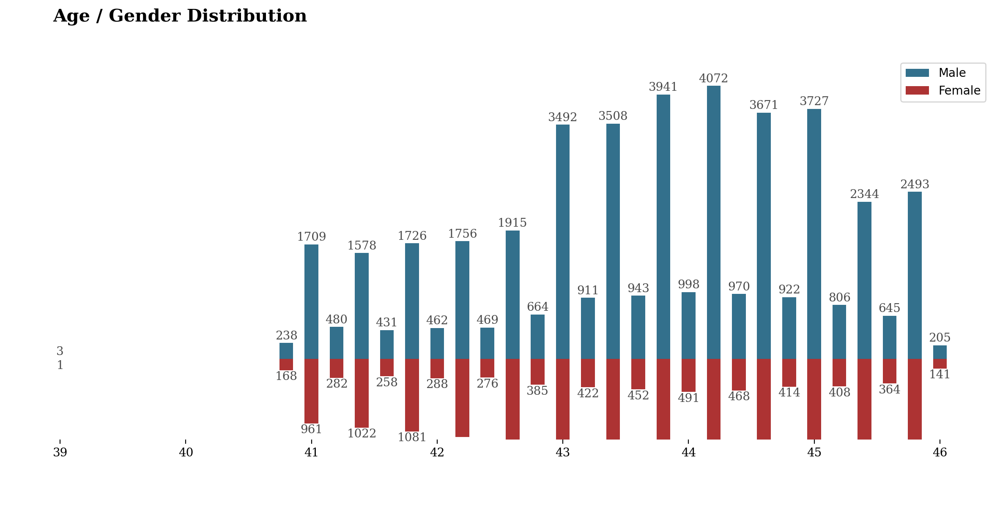

In [57]:
# Gender / Age Analysis
cardio_df2['Gender'] = cardio_df2['Gender'].apply(lambda x:'Man' if x == 1 else ("Woman" if x==2 else "Man"))
data_q1q2 = cardio_df2.groupby(['Gender'])['Age'].value_counts().unstack().sort_index()
man = data_q1q2.loc['Man']
woman = -data_q1q2.loc['Woman']

fig, ax = plt.subplots(1,1, figsize=(15, 6))
ax.bar(man.index, man, width=0.55, color='#004c70', alpha=0.8, label='Male')
ax.bar(woman.index, woman, width=0.55, color='#990000', alpha=0.8, label='Female')
ax.set_ylim(-1200, 4500)

for i in man.index:
    ax.annotate(f"{man[i]}", 
                   xy=(i, man[i] + 100),
                   va = 'center', ha='center',fontweight='light', fontfamily='serif',
                   color='#4a4a4a')
    
for i in woman.index:
    ax.annotate(f"{-woman[i]}", 
                   xy=(i, woman[i] - 100),
                   va = 'center', ha='center',fontweight='light', fontfamily='serif',
                   color='#4a4a4a')    

for s in ['top', 'left', 'right', 'bottom']:
    ax.spines[s].set_visible(False)

ax.set_xticklabels(data_q1q2.columns, fontfamily='serif')
ax.set_yticks([])    
ax.legend()
fig.text(0.16, 0.95, 'Age / Gender Distribution', fontsize=15, fontweight='bold', fontfamily='serif')    
plt.show()

# Honey Data

In [403]:
honey_df = pd.read_csv("../../../data/honeyproduction.csv")
honey_df.head()

,state,numcol,yieldpercol,totalprod,stocks,priceperlb,prodvalue,year
0,AL,16000.0,71,1136000.0,159000.0,0.72,818000.0,1998
1,AZ,55000.0,60,3300000.0,1485000.0,0.64,2112000.0,1998
2,AR,53000.0,65,3445000.0,1688000.0,0.59,2033000.0,1998
3,CA,450000.0,83,37350000.0,12326000.0,0.62,23157000.0,1998
4,CO,27000.0,72,1944000.0,1594000.0,0.70,1361000.0,1998


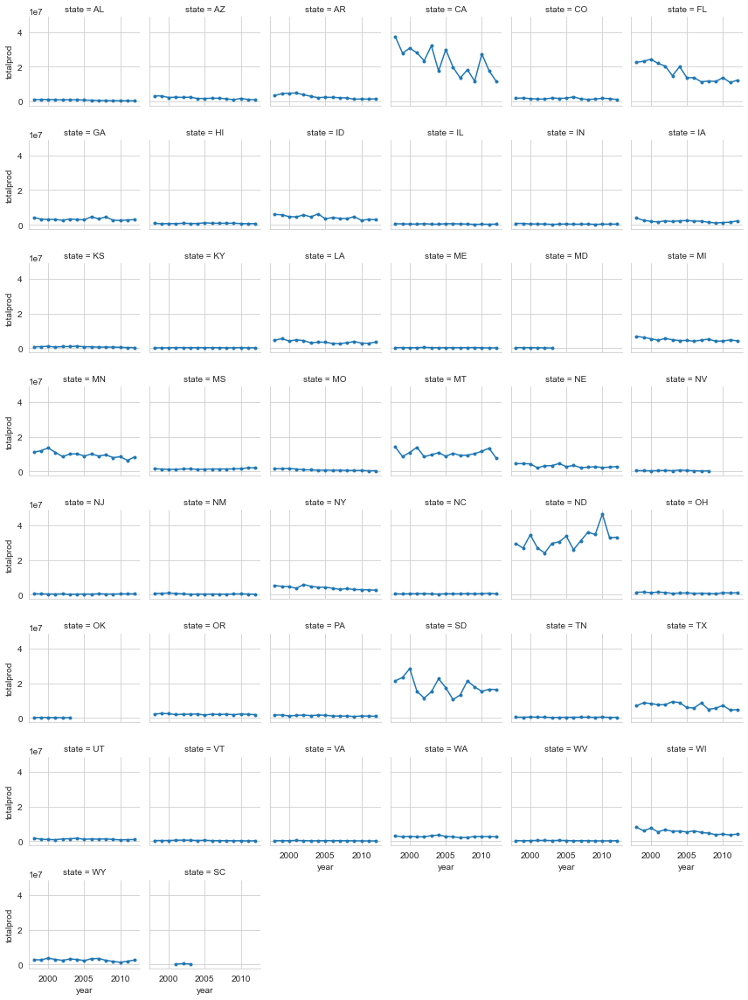

In [405]:
# Checking distribution for each State
g = sns.FacetGrid(honey_df,col="state",col_wrap=6,size=2)
g=g.map(plt.plot,"year","totalprod",marker=".");

In [ ]:
# Create a boxplot for year of production

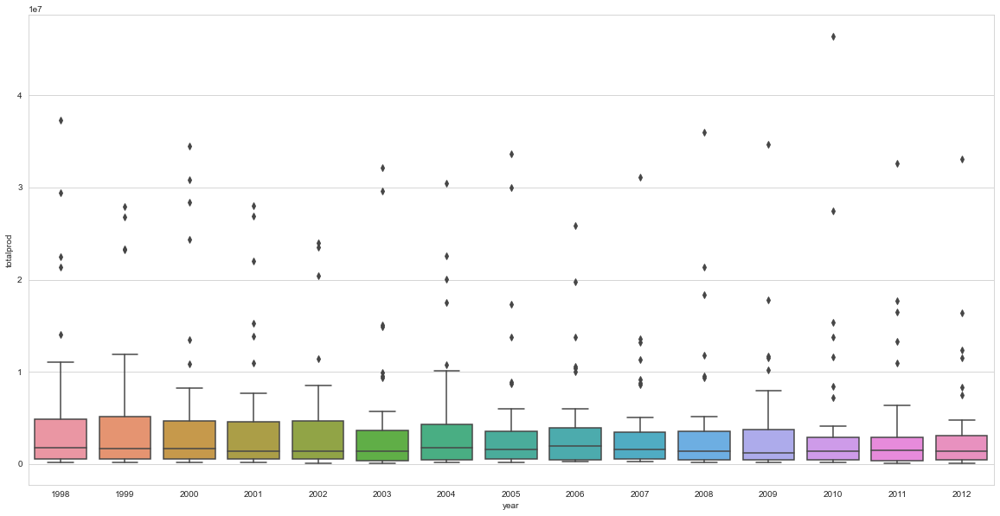

In [406]:
fig, ax = plt.subplots(figsize=(20,10))
sns.boxplot("year", "totalprod", data=honey_df)
plt.show()

# Customers Demographic Analysis
We will analyze sales by demographic Analysis of customers eg city, age, gender .. The goal of this process is to give more information about our data so that the marketing team prepares to intensify the efficiency based on the data and information we will provide !
At the end of this intention there is a challenge or duty you have to complete the end you have to understand all the facts that have already occurred and all the facts that I did not mention some and listed as a story you have to tell every part even if simple Ithakk to make a full page as a full report on this subject, From this core is teaching you how exploratory analysis is how you tell stories how to make information in your mind

* Gender
* Age
* City
* Stability
* Occupation
* Products

In [432]:
cust_df = pd.read_csv('../../../data/blackFriday_train.csv')
cust_df.head()

,User_ID,Product_ID,Gender,Age,Occupation,City_Category,Stay_In_Current_City_Years,Marital_Status,Product_Category_1,Product_Category_2,Product_Category_3,Purchase
0,1000001,P00069042,F,0-17,10,A,2,0,3,NaN,NaN,8370
1,1000001,P00248942,F,0-17,10,A,2,0,1,6.0,14.0,15200
2,1000001,P00087842,F,0-17,10,A,2,0,12,NaN,NaN,1422
3,1000001,P00085442,F,0-17,10,A,2,0,12,14.0,NaN,1057
4,1000002,P00285442,M,55+,16,C,4+,0,8,NaN,NaN,7969


# Gender

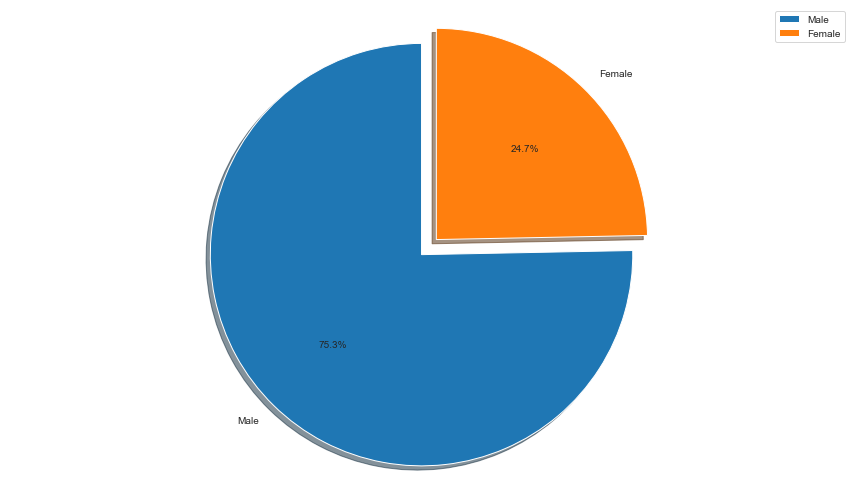

In [408]:
explode = (0.1,0)  
fig1, ax1 = plt.subplots(figsize=(12,7))
ax1.pie(cust_df['Gender'].value_counts(), explode=explode,labels=['Male','Female'], autopct='%1.1f%%',
        shadow=True, startangle=90)
# Equal aspect ratio ensures that pie is drawn as a circle
ax1.axis('equal')  
plt.tight_layout()
plt.legend()
plt.show()

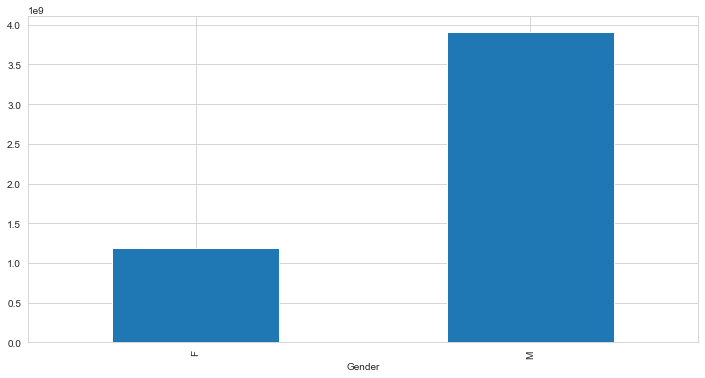

In [409]:
# Let's create a simple function to help as with some plots
def plot(group,column,plot):
    ax=plt.figure(figsize=(12,6))
    cust_df.groupby(group)[column].sum().sort_values().plot(kind="bar")
    
plot('Gender','Purchase','bar')

# Age

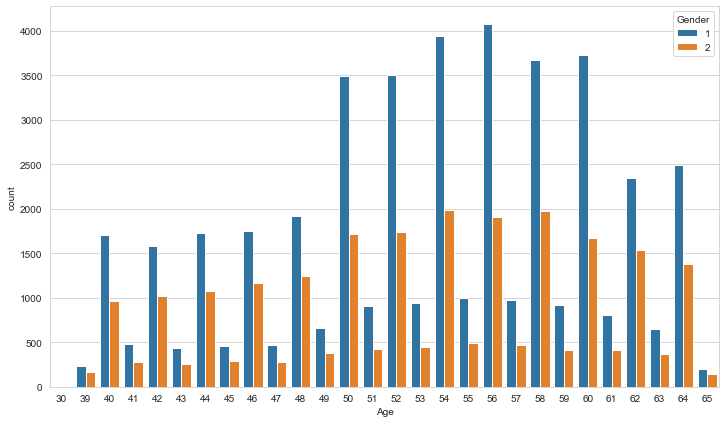

In [410]:
fig1, ax1 = plt.subplots(figsize=(12,7))
sns.countplot(cardio_df['Age'],hue=cardio_df['Gender'])
plt.show()

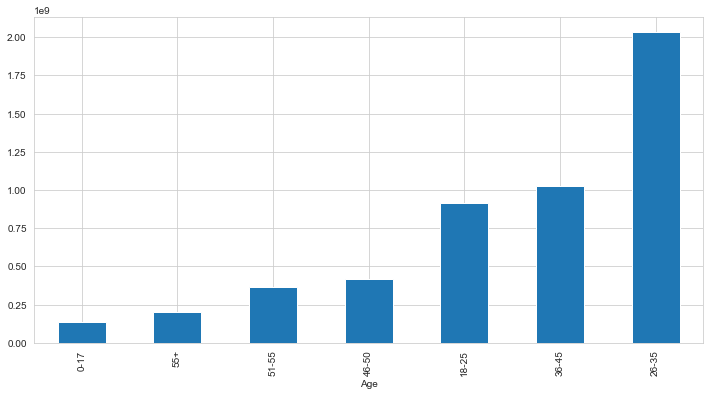

In [429]:
plot('Age', 'Purchase' , "bar")

# City

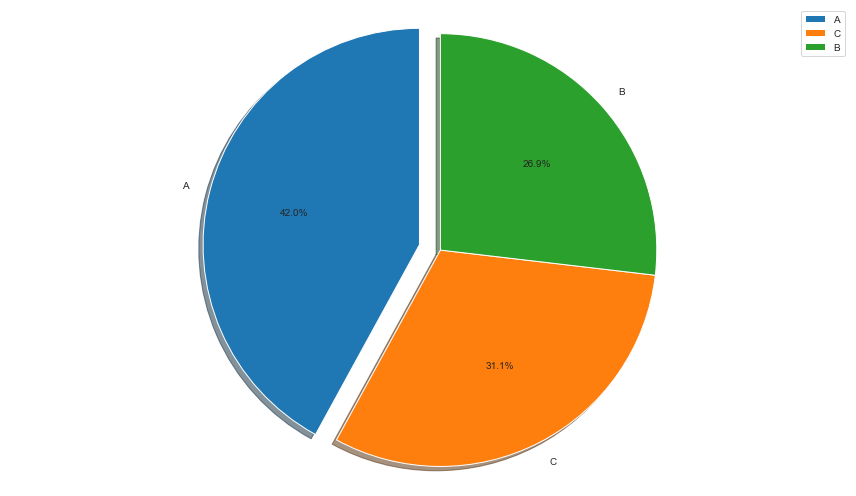

In [435]:
explode = (0.1, 0, 0)
fig1, ax1 = plt.subplots(figsize=(12,7))
ax1.pie(cust_df['City_Category'].value_counts(),explode=explode, labels=cust_df['City_Category'].unique(), autopct='%1.1f%%',
        shadow=True, startangle=90)
# Equal aspect ratio ensures that pie is drawn as a circle
ax1.axis('equal')  
plt.tight_layout()
plt.legend()
plt.show()

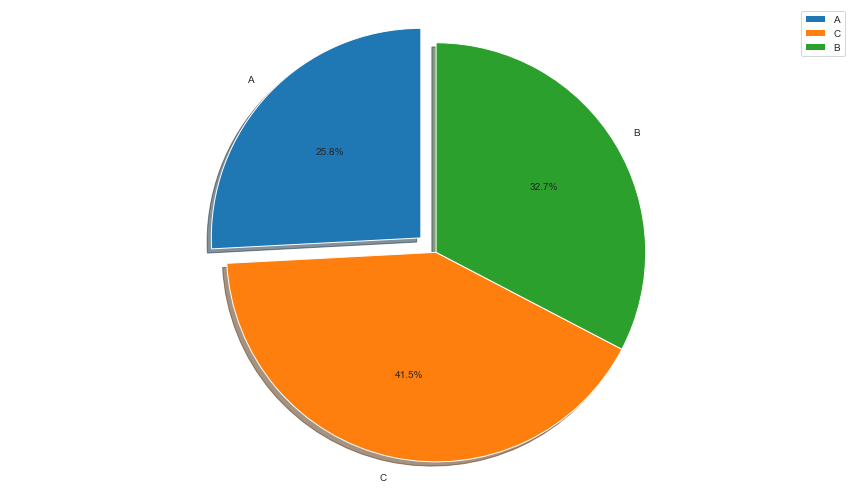

In [436]:
explode = (0.1, 0, 0)
fig1, ax1 = plt.subplots(figsize=(12,7))
ax1.pie(cust_df.groupby('City_Category')['Purchase'].sum(),explode=explode, labels=cust_df['City_Category'].unique(), autopct='%1.1f%%',
        shadow=True, startangle=90)
# Equal aspect ratio ensures that pie is drawn as a circle
ax1.axis('equal')  
plt.tight_layout()
plt.legend()
plt.show()

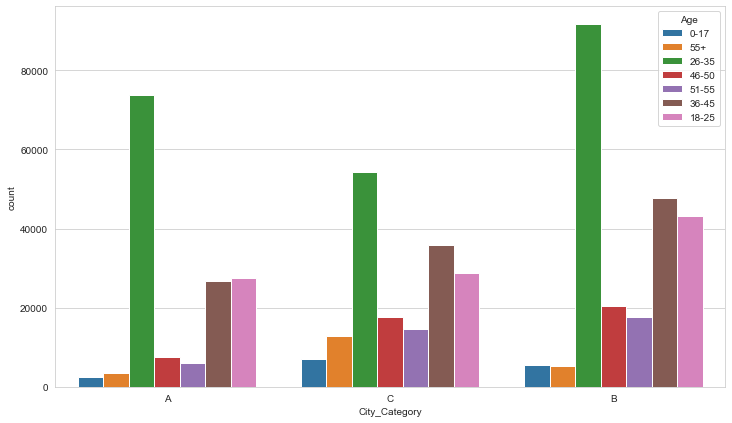

In [437]:
fig1, ax1 = plt.subplots(figsize=(12,7))
sns.countplot(cust_df['City_Category'],hue=cust_df['Age'])
plt.show()

+ Unexpectedly, the highest sales do not come in the number of purchases, people from Area B have a greater purchasing power than others, and greater sales gained from people from Area C

Look at the comments, sometimes we have to identify the appropriate wording and not mix with it as I did here. I would like to point out that sales do not reflect purchasing power, but the number of attendees reflects purchasing power because the data are individual sales. sales in the city, it reflects the purchasing power ..

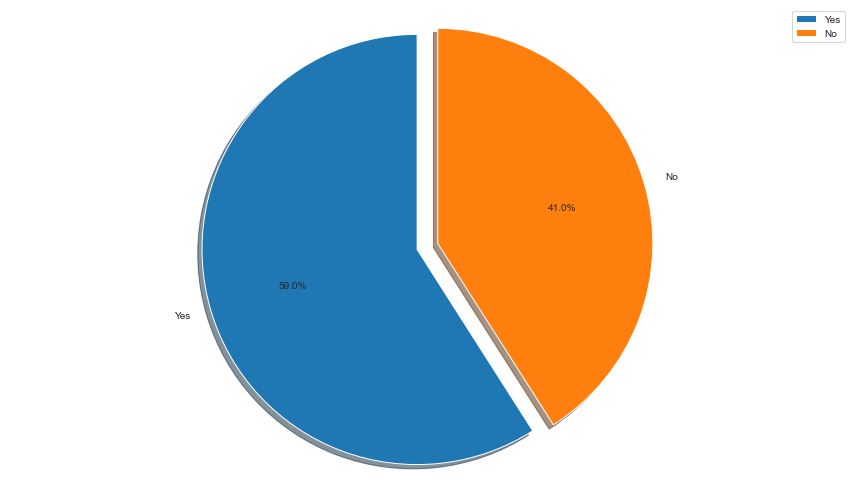

In [438]:
# label=['Underage 0-17','Retired +55','Middleage 26-35','46-50 y/o','Oldman 51-55','Middleage+ 36-45','Youth']
explode = (0.1, 0)
fig1, ax1 = plt.subplots(figsize=(12,7))
ax1.pie(cust_df['Marital_Status'].value_counts(),explode=explode, labels=['Yes','No'], autopct='%1.1f%%',
        shadow=True, startangle=90)
# Equal aspect ratio ensures that pie is drawn as a circle
ax1.axis('equal')  
plt.tight_layout()
plt.legend()
plt.show()

+ City A is the most cities followed by B and then C, the distribution of ages on the procurement map is very close, we have to focus on that category of work averages of 36-45

+ Most of our customers are more than 60% married, I see that the strategy of targeting families to ensure more clients succeed

# Stability

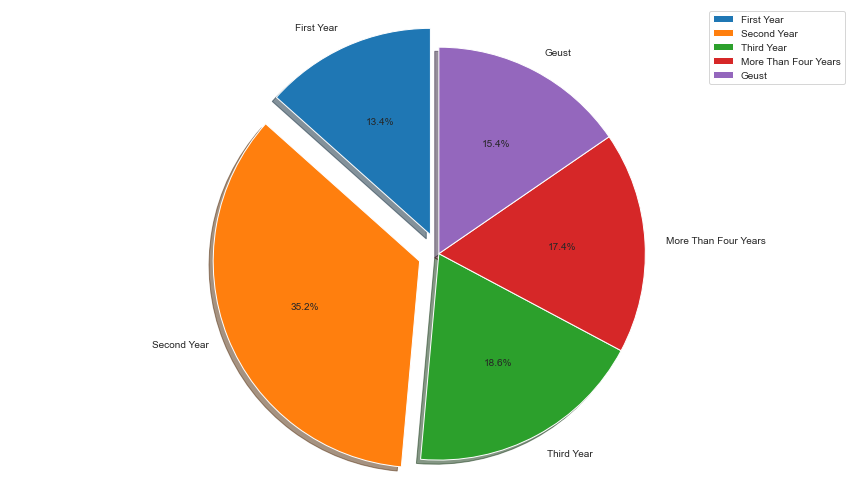

In [439]:
labels=['First Year','Second Year','Third Year','More Than Four Years','Geust']
explode = (0.1, 0.1,0,0,0)
fig1, ax1 = plt.subplots(figsize=(12,7))
ax1.pie(cust_df.groupby('Stay_In_Current_City_Years')['Purchase'].sum(),explode=explode, labels=labels, autopct='%1.1f%%',
        shadow=True, startangle=90)
# Equal aspect ratio ensures that pie is drawn as a circle
ax1.axis('equal')  
plt.tight_layout()
plt.legend()
plt.show()

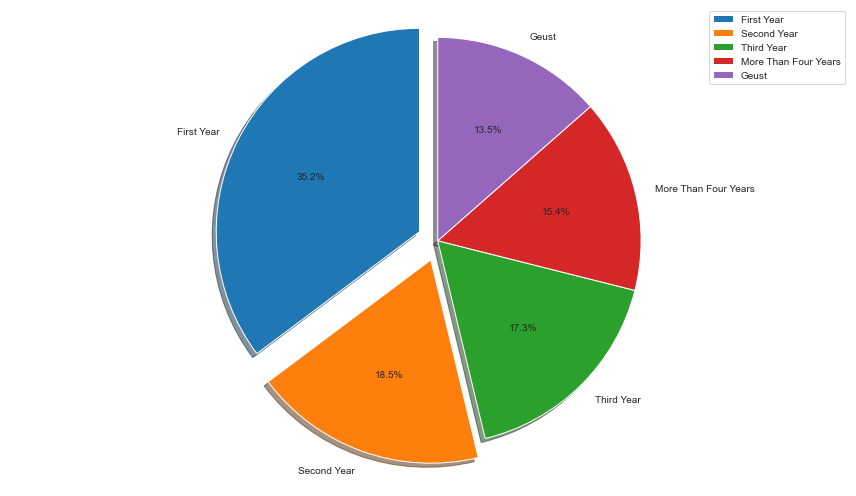

In [440]:
labels=['First Year','Second Year','Third Year','More Than Four Years','Geust']
#label=['Underage 0-17','Retired +55','Middleage 26-35','46-50 y/o','Oldman 51-55','Middleage+ 36-45','Youth']
explode = (0.1, 0.1,0,0,0)
fig1, ax1 = plt.subplots(figsize=(12,7))
ax1.pie(cust_df['Stay_In_Current_City_Years'].value_counts(),explode=explode, labels=labels, autopct='%1.1f%%',
        shadow=True, startangle=90)
# Equal aspect ratio ensures that pie is drawn as a circle
ax1.axis('equal')  
plt.tight_layout()
plt.legend()
plt.show()

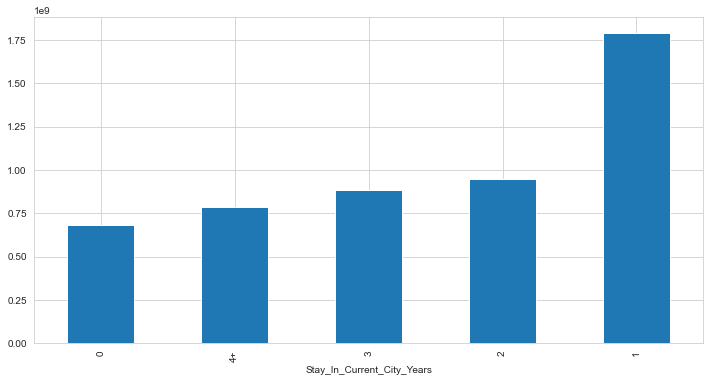

In [441]:
plot('Stay_In_Current_City_Years','Purchase','bar')

+ We have worked hard in the past two years and have achieved a large percentage of sales from the new population of cities, but these figures indicate that the older city dwellers have less passion for our products. I do not know in fact look at it for yourselves why old city dwellers did not achieve higher sales of the population New visitors or visitors from outside the city?
+ We have almost gained about 1.75 billion new city residents only!

# Occupation

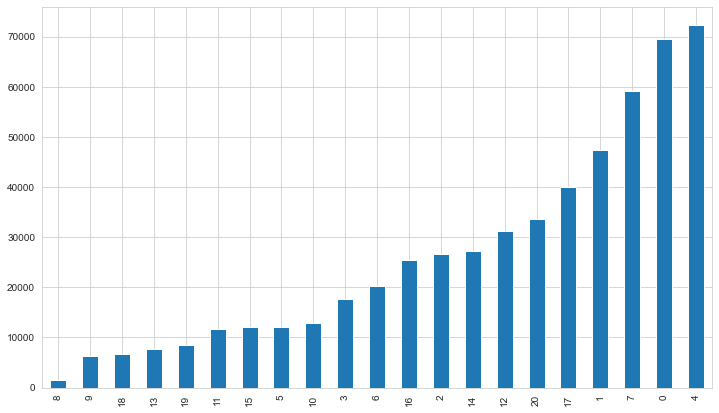

In [442]:
fig1, ax1 = plt.subplots(figsize=(12,7))
cust_df['Occupation'].value_counts().sort_values().plot(kind='bar')
plt.show()

In [ ]:
# The above plot can also be done by help of our initial function this way

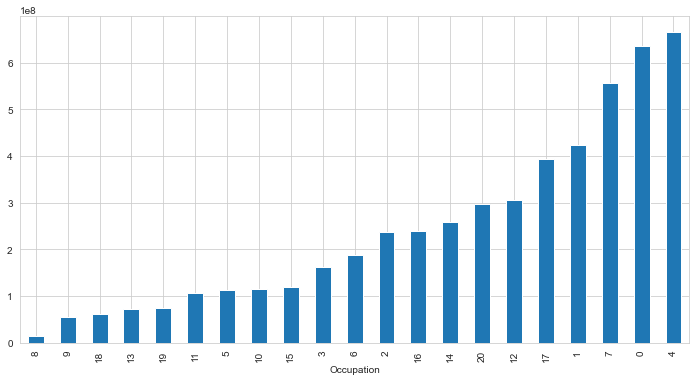

In [443]:
plot('Occupation','Purchase','bar')

+ We also note here that purchasing power is closely related to the Occupation in some cases as the first class of the table but there are some differences we will notice when checking the number of purchases and the value of those purchases total

# Product and Categories

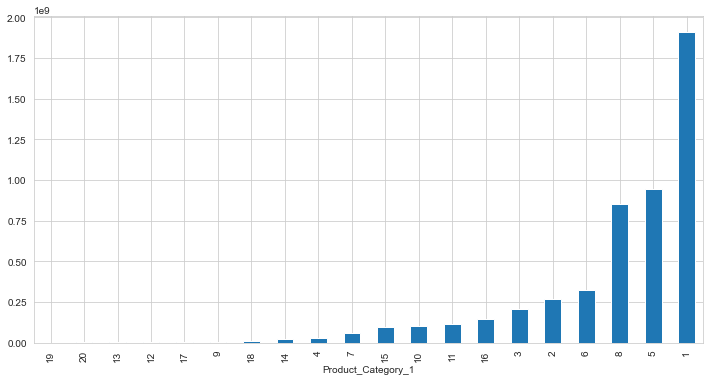

In [444]:
plot('Product_Category_1','Purchase','barh')

# Category2

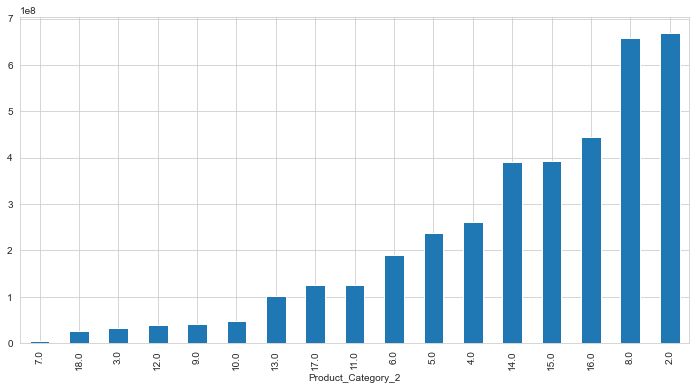

In [445]:
plot('Product_Category_2','Purchase','barh')

# Category3

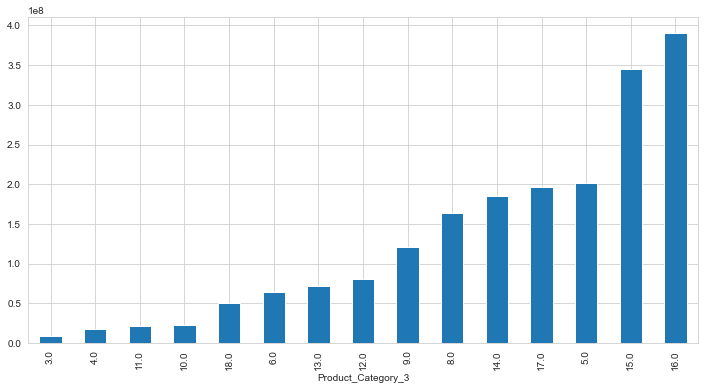

In [446]:
plot('Product_Category_3','Purchase','barh')

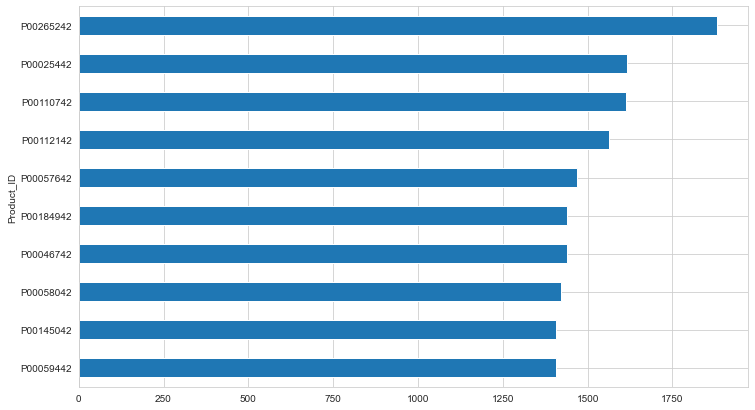

In [447]:
fig1, ax1 = plt.subplots(figsize=(12,7))
cust_df.groupby('Product_ID')['Purchase'].count().nlargest(10).sort_values().plot(kind='barh')
plt.show()

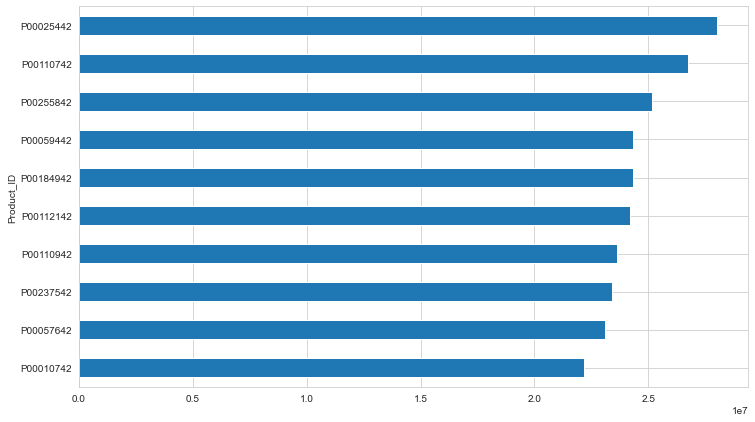

In [448]:
fig1, ax1 = plt.subplots(figsize=(12,7))
cust_df.groupby('Product_ID')['Purchase'].sum().nlargest(10).sort_values().plot(kind='barh')
plt.show()

+ Well, now we have the top 10 products for the top 10 profits , and first 10 category for each products .
Remember that I may have been explored, but this is where your next task begins. The goal of this kernel is to teach you how to analyze how to compare things to each other, How to add information you can tell yourself and tell the stakeholders.

# Hours Data

In [2]:
hours_data = pd.read_csv('../../data/hour.csv', sep = ',')
hours_data.head()

,instant,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,2011-01-01,1,0,1,0,0,6,0,1,0.24,0.2879,0.81,0.0,3,13,16
1,2,2011-01-01,1,0,1,1,0,6,0,1,0.22,0.2727,0.80,0.0,8,32,40
2,3,2011-01-01,1,0,1,2,0,6,0,1,0.22,0.2727,0.80,0.0,5,27,32
3,4,2011-01-01,1,0,1,3,0,6,0,1,0.24,0.2879,0.75,0.0,3,10,13
4,5,2011-01-01,1,0,1,4,0,6,0,1,0.24,0.2879,0.75,0.0,0,1,1


In [6]:
from datetime import datetime

In [7]:
# Separate date
hours_data["date"] = hours_data.dteday.apply(lambda x : x.split()[0])
hours_data["weekday"] = hours_data.date.apply(lambda dateString : datetime.strptime(dateString,"%Y-%m-%d").weekday())

In [8]:
# Check results
hours_data.head()

,instant,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt,date
0,1,2011-01-01,1,0,1,0,0,5,0,1,0.24,0.2879,0.81,0.0,3,13,16,2011-01-01
1,2,2011-01-01,1,0,1,1,0,5,0,1,0.22,0.2727,0.80,0.0,8,32,40,2011-01-01
2,3,2011-01-01,1,0,1,2,0,5,0,1,0.22,0.2727,0.80,0.0,5,27,32,2011-01-01
3,4,2011-01-01,1,0,1,3,0,5,0,1,0.24,0.2879,0.75,0.0,3,10,13,2011-01-01
4,5,2011-01-01,1,0,1,4,0,5,0,1,0.24,0.2879,0.75,0.0,0,1,1,2011-01-01


# Categorical Features and drop features

In [9]:
categoricalFeatureNames = ["season","holiday","workingday","weathersit","weekday","mnth","yr","hr"]
numericalFeatureNames = ["temp","hum","windspeed","atemp"]
dropFeatures = ['casual',"cnt","dteday","date","registered"]

In [10]:
for var in categoricalFeatureNames:
    hours_data[var] = hours_data[var].astype("category")

In [11]:
# Check results
hours_data.head(3)

,instant,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt,date
0,1,2011-01-01,1,0,1,0,0,5,0,1,0.24,0.2879,0.81,0.0,3,13,16,2011-01-01
1,2,2011-01-01,1,0,1,1,0,5,0,1,0.22,0.2727,0.80,0.0,8,32,40,2011-01-01
2,3,2011-01-01,1,0,1,2,0,5,0,1,0.22,0.2727,0.80,0.0,5,27,32,2011-01-01


In [12]:
data = hours_data.drop(["dteday"],axis=1)

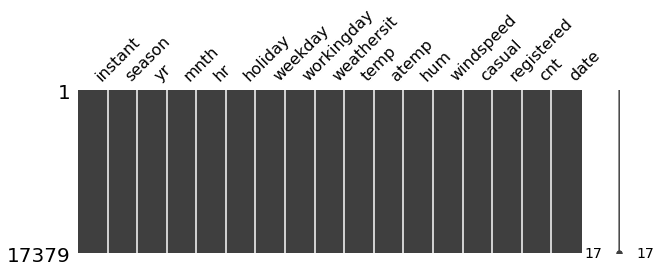

In [15]:
import missingno as msno

# Missing data detection
msno.matrix(data,figsize=(10,3));

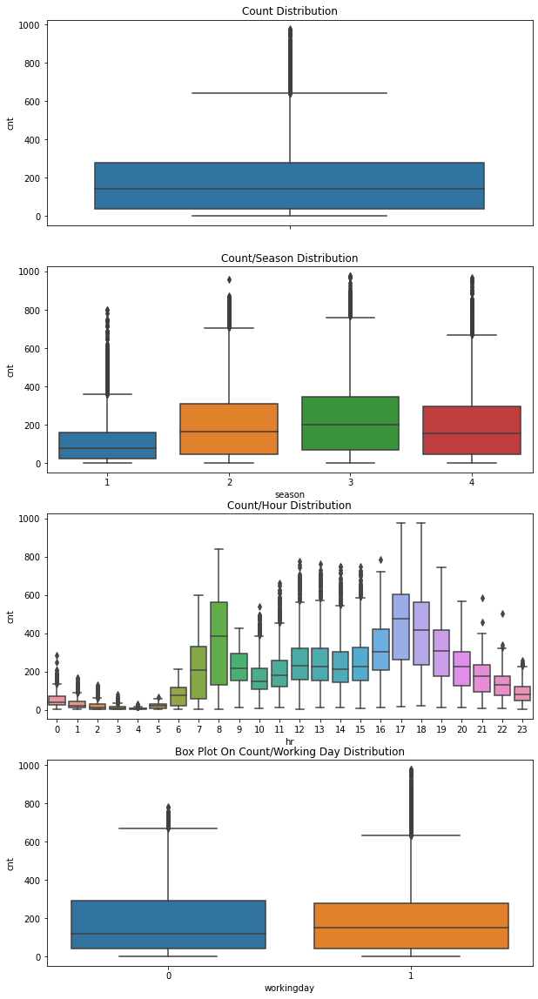

In [22]:
# Outliers detection
fig, axes = plt.subplots(nrows=4,ncols=1)
fig.set_size_inches(10, 20)
axes[0].set(ylabel='Count',title="Count Distribution")
sns.boxplot(data=data,y="cnt",orient="v",ax=axes[0])

axes[1].set(xlabel='Season', ylabel='Count',title="Count/Season Distribution")
sns.boxplot(data=data,y="cnt",x="season",orient="v",ax=axes[1])

axes[2].set(xlabel='Hour Of The Day', ylabel='Count',title="Count/Hour Distribution")
sns.boxplot(data=data,y="cnt",x="hr",orient="v",ax=axes[2])

axes[3].set(xlabel='Working Day', ylabel='Count',title="Box Plot On Count/Working Day Distribution")
sns.boxplot(data=data,y="cnt",x="workingday",orient="v",ax=axes[3]);


[Text(17.200000000000003, 0.5, 'Count'),
 Text(0.5, 17.200000000000017, 'Working Day'),
 Text(0.5, 1.0, 'Box Plot On Count/Working Day Distribution')]

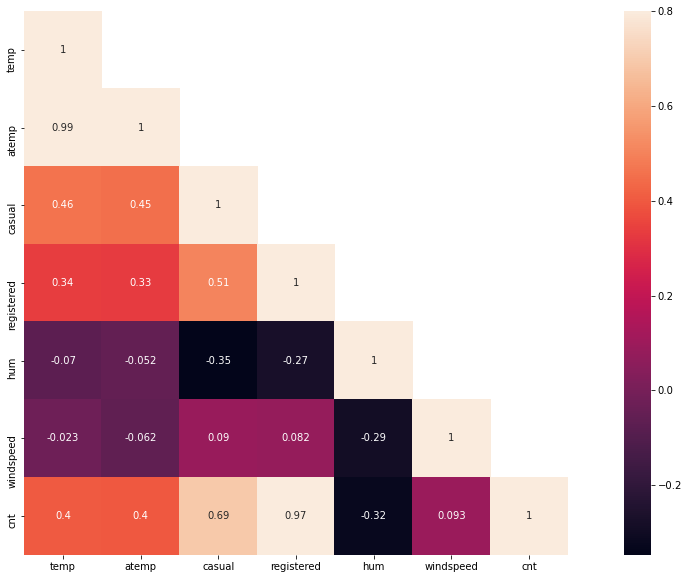

In [21]:
# Correlation analasys
corrMatt = data[["temp","atemp","casual","registered","hum","windspeed","cnt"]].corr()
mask = np.array(corrMatt)
mask[np.tril_indices_from(mask)] = False
fig,ax= plt.subplots()
fig.set_size_inches(20,10)
sns.heatmap(corrMatt, mask=mask,vmax=.8, square=True,annot=True);

# Retail Product Data

In [116]:
e_data = pd.read_csv("../../../data/ecommerce_data.csv" , encoding = 'ISO-8859-1')
e_data.head(3)

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,12/1/2010 8:26,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,12/1/2010 8:26,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,12/1/2010 8:26,2.75,17850.0,United Kingdom


In [117]:
e_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 541909 entries, 0 to 541908
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   InvoiceNo    541909 non-null  object 
 1   StockCode    541909 non-null  object 
 2   Description  540455 non-null  object 
 3   Quantity     541909 non-null  int64  
 4   InvoiceDate  541909 non-null  object 
 5   UnitPrice    541909 non-null  float64
 6   CustomerID   406829 non-null  float64
 7   Country      541909 non-null  object 
dtypes: float64(2), int64(1), object(5)
memory usage: 33.1+ MB


In [118]:
# check missing values for each column 
e_data.isnull().sum().sort_values(ascending=False)

CustomerID     135080
Description      1454
Country             0
UnitPrice           0
InvoiceDate         0
Quantity            0
StockCode           0
InvoiceNo           0
dtype: int64

In [119]:
# check out the rows with missing values
e_data[e_data.isnull().any(axis=1)].head(10)

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
622,536414,22139,NaN,56,12/1/2010 11:52,0.00,NaN,United Kingdom
1443,536544,21773,DECORATIVE ROSE BATHROOM BOTTLE,1,12/1/2010 14:32,2.51,NaN,United Kingdom
1444,536544,21774,DECORATIVE CATS BATHROOM BOTTLE,2,12/1/2010 14:32,2.51,NaN,United Kingdom
1445,536544,21786,POLKADOT RAIN HAT,4,12/1/2010 14:32,0.85,NaN,United Kingdom
1446,536544,21787,RAIN PONCHO RETROSPOT,2,12/1/2010 14:32,1.66,NaN,United Kingdom
1447,536544,21790,VINTAGE SNAP CARDS,9,12/1/2010 14:32,1.66,NaN,United Kingdom
1448,536544,21791,VINTAGE HEADS AND TAILS CARD GAME,2,12/1/2010 14:32,2.51,NaN,United Kingdom
1449,536544,21801,CHRISTMAS TREE DECORATION WITH BELL,10,12/1/2010 14:32,0.43,NaN,United Kingdom
1450,536544,21802,CHRISTMAS TREE HEART DECORATION,9,12/1/2010 14:32,0.43,NaN,United Kingdom
1451,536544,21803,CHRISTMAS TREE STAR DECORATION,11,12/1/2010 14:32,0.43,NaN,United Kingdom


In [120]:
# change the invoice_date format - String to Timestamp format
e_data['InvoiceDate'] = pd.to_datetime(e_data.InvoiceDate, format='%m/%d/%Y %H:%M')

In [121]:
e_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 541909 entries, 0 to 541908
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   InvoiceNo    541909 non-null  object        
 1   StockCode    541909 non-null  object        
 2   Description  540455 non-null  object        
 3   Quantity     541909 non-null  int64         
 4   InvoiceDate  541909 non-null  datetime64[ns]
 5   UnitPrice    541909 non-null  float64       
 6   CustomerID   406829 non-null  float64       
 7   Country      541909 non-null  object        
dtypes: datetime64[ns](1), float64(2), int64(1), object(4)
memory usage: 33.1+ MB


In [122]:
# df_new without missing values
df_no_missing = e_data.dropna()

In [123]:
# check missing values for each column 
df_no_missing.isnull().sum().sort_values(ascending=False)

Country        0
CustomerID     0
UnitPrice      0
InvoiceDate    0
Quantity       0
Description    0
StockCode      0
InvoiceNo      0
dtype: int64

In [124]:
# change columns tyoe - String to Int type 
df_no_missing['CustomerID'] = df_no_missing['CustomerID'].astype('int64')

In [125]:
df_no_missing.head(3)

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850,United Kingdom


In [126]:
# Rename the dataframe to make code more readable
df2 = df_no_missing.copy()

In [127]:
df2.describe().round(2)

,Quantity,UnitPrice,CustomerID
count,406829.00,406829.00,406829.00
mean,12.06,3.46,15287.69
std,248.69,69.32,1713.60
min,-80995.00,0.00,12346.00
25%,2.00,1.25,13953.00
50%,5.00,1.95,15152.00
75%,12.00,3.75,16791.00
max,80995.00,38970.00,18287.00


# Quantity

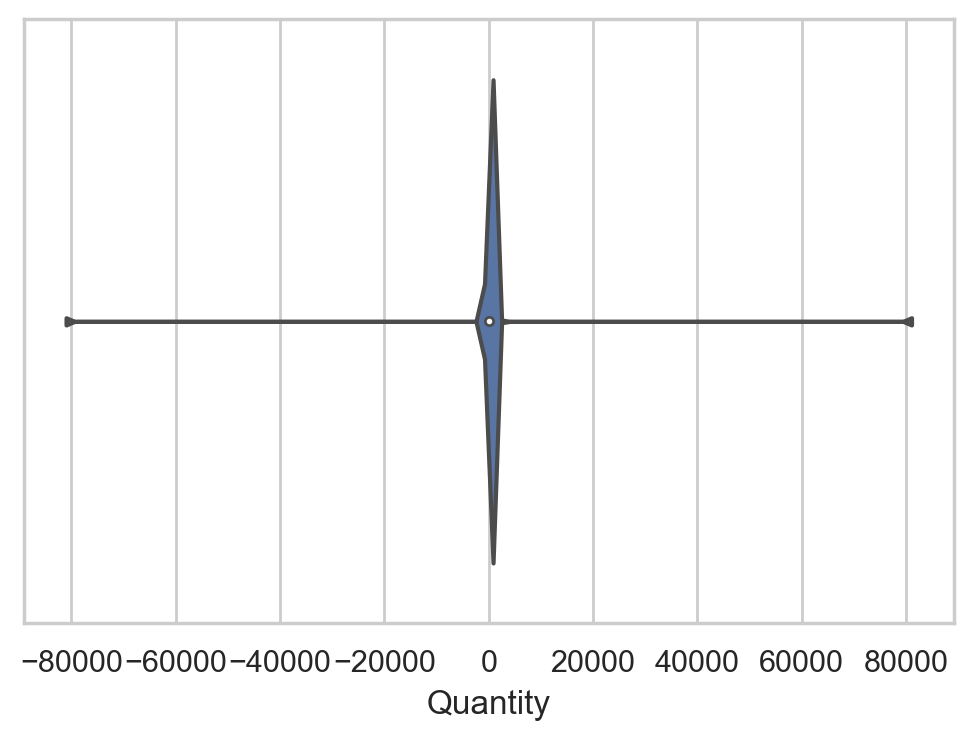

In [128]:
sns.set(style="whitegrid")
ax = sns.violinplot(x=df2["Quantity"])

In [129]:
# remove negative quanitites

df2 = df2[df2.Quantity > 0]
df2.describe().round(2)

,Quantity,UnitPrice,CustomerID
count,397924.00,397924.00,397924.00
mean,13.02,3.12,15294.32
std,180.42,22.10,1713.17
min,1.00,0.00,12346.00
25%,2.00,1.25,13969.00
50%,6.00,1.95,15159.00
75%,12.00,3.75,16795.00
max,80995.00,8142.75,18287.00


In [130]:
# Now plot quantiy again

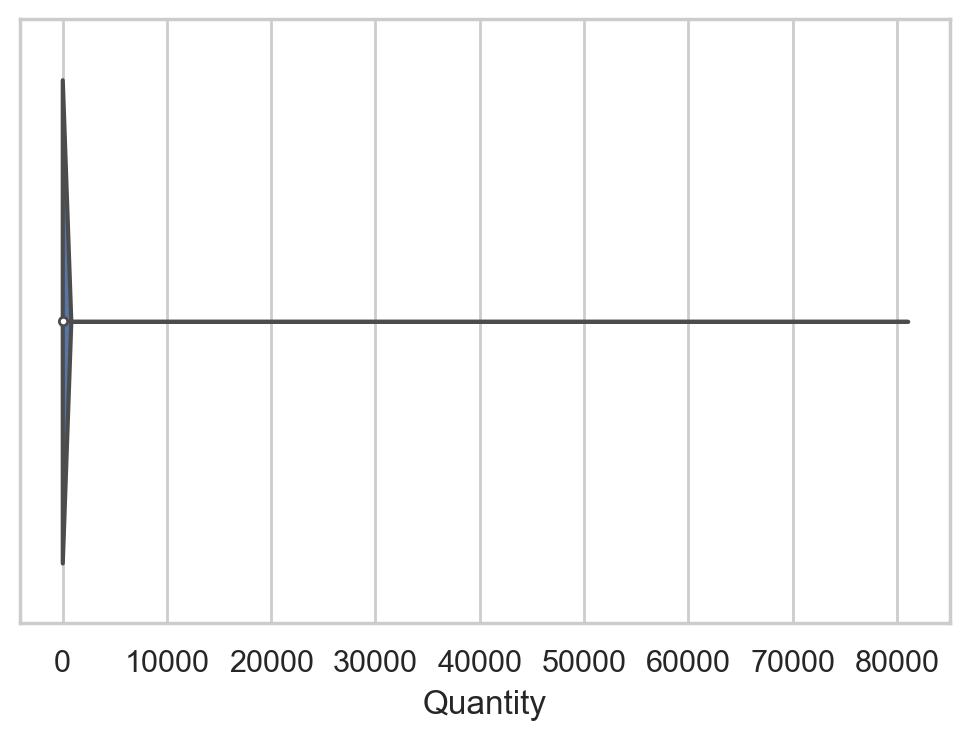

In [131]:
ax = sns.violinplot(x=df2["Quantity"])

# Create a new column for amount spent

In [132]:
df2['AmountSpent'] = df2['Quantity'] * df2['UnitPrice']
df2.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,AmountSpent
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850,United Kingdom,15.30
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,20.34
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850,United Kingdom,22.00
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,20.34
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,20.34


In [133]:
# Let's add Month, Day and Hour Colummns that we'll use for further analysis
# Starting with Month_Year First
df2['month_year'] = df2['InvoiceDate'].dt.to_period('M')
df2.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,AmountSpent,month_year
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850,United Kingdom,15.30,2010-12
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,20.34,2010-12
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850,United Kingdom,22.00,2010-12
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,20.34,2010-12
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,20.34,2010-12


In [134]:
L = ['year', 'month', 'day', 'dayofweek', 'dayofyear', 'weekofyear', 'quarter']
df2 = df2.join(pd.concat((getattr(df2['InvoiceDate'].dt, i).rename(i) for i in L), axis=1))
df2.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,AmountSpent,month_year,year,month,day,dayofweek,dayofyear,weekofyear,quarter
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850,United Kingdom,15.30,2010-12,2010,12,1,2,335,48,4
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,20.34,2010-12,2010,12,1,2,335,48,4
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850,United Kingdom,22.00,2010-12,2010,12,1,2,335,48,4
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,20.34,2010-12,2010,12,1,2,335,48,4
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,20.34,2010-12,2010,12,1,2,335,48,4


In [135]:
df2.dayofweek.unique()

array([2, 3, 4, 6, 0, 1])

+ Note there are 7 days in a week but our data is showing 6

In [136]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 397924 entries, 0 to 541908
Data columns (total 17 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   InvoiceNo    397924 non-null  object        
 1   StockCode    397924 non-null  object        
 2   Description  397924 non-null  object        
 3   Quantity     397924 non-null  int64         
 4   InvoiceDate  397924 non-null  datetime64[ns]
 5   UnitPrice    397924 non-null  float64       
 6   CustomerID   397924 non-null  int64         
 7   Country      397924 non-null  object        
 8   AmountSpent  397924 non-null  float64       
 9   month_year   397924 non-null  period[M]     
 10  year         397924 non-null  int64         
 11  month        397924 non-null  int64         
 12  day          397924 non-null  int64         
 13  dayofweek    397924 non-null  int64         
 14  dayofyear    397924 non-null  int64         
 15  weekofyear   397924 non-null  int6

# +1 to make Monday=1.....until Sunday=7


In [137]:
# +1 to make Monday=1.....until Sunday=7
df2['dayofweek'] = df2['dayofweek'] + 1
df2.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,AmountSpent,month_year,year,month,day,dayofweek,dayofyear,weekofyear,quarter
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850,United Kingdom,15.30,2010-12,2010,12,1,3,335,48,4
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,20.34,2010-12,2010,12,1,3,335,48,4
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850,United Kingdom,22.00,2010-12,2010,12,1,3,335,48,4
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,20.34,2010-12,2010,12,1,3,335,48,4
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,20.34,2010-12,2010,12,1,3,335,48,4


In [138]:
# Consolidating the number of Sales Made per customer for each country
# We use InvoiceNo as the count for sales
sales_per_cust = df2.groupby(by=['CustomerID','Country'], as_index=False)['InvoiceNo'].count().sort_values(by='InvoiceNo', ascending=False)
sales_per_cust.columns = ['CustomerID', 'Country', "NumberOfSales"]
sales_per_cust.head(10)

,CustomerID,Country,NumberOfSales
4019,17841,United Kingdom,7847
1888,14911,EIRE,5677
1298,14096,United Kingdom,5111
334,12748,United Kingdom,4596
1670,14606,United Kingdom,2700
2185,15311,United Kingdom,2379
1698,14646,Netherlands,2080
570,13089,United Kingdom,1818
699,13263,United Kingdom,1677
1443,14298,United Kingdom,1637


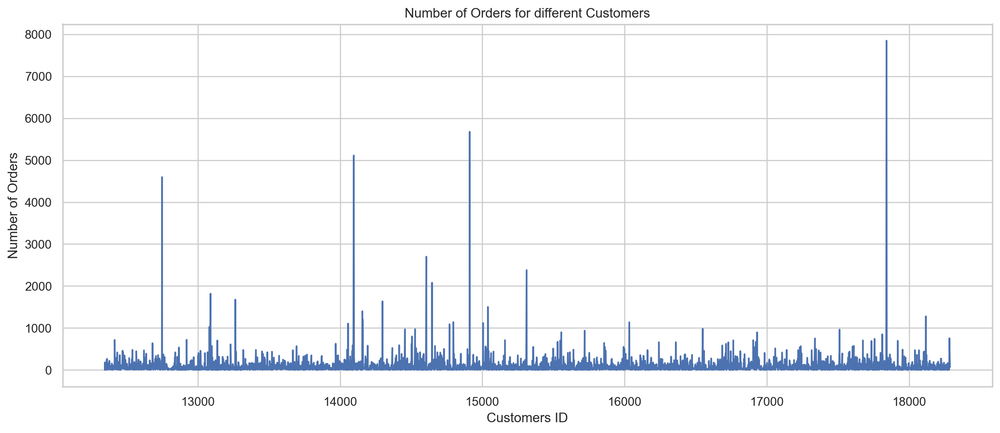

In [139]:
# Visualizing No. of Sales for all Customers

orders = df2.groupby(by=['CustomerID','Country'], as_index=False)['InvoiceNo'].count()

plt.subplots(figsize=(15,6))
plt.plot(orders.CustomerID, orders.InvoiceNo)
plt.xlabel('Customers ID')
plt.ylabel('Number of Orders')
plt.title('Number of Orders for different Customers')
plt.show()

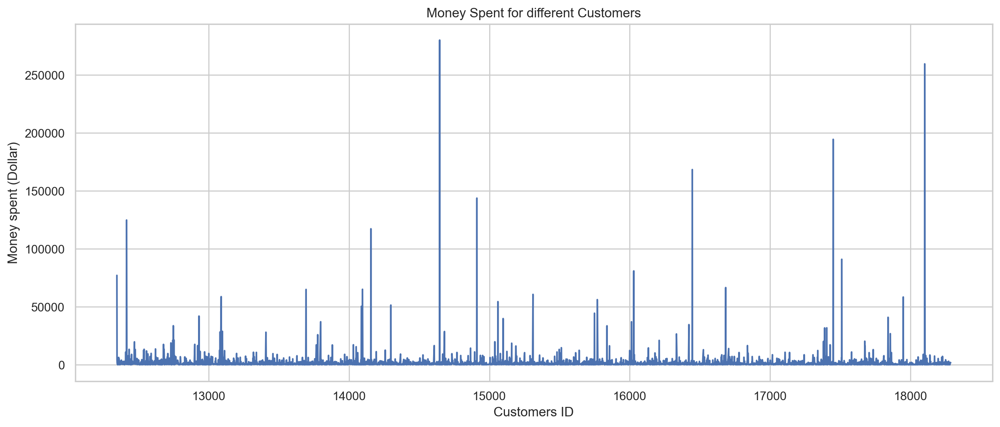

In [140]:
# Visualizing Money Spent for all Customer
money_spent = df2.groupby(by=['CustomerID','Country'], as_index=False)['AmountSpent'].sum()

plt.subplots(figsize=(15,6))
plt.plot(money_spent.CustomerID, money_spent.AmountSpent)
plt.xlabel('Customers ID')
plt.ylabel('Money spent (Dollar)')
plt.title('Money Spent for different Customers')
plt.show()

In [141]:
# Consolidating the number of Sales Made per customer (Revenue)
# we use use index=False, to indicate to the groupby that we don't want to set the column ID as index
spent_per_cust = df2.groupby(by=['CustomerID','Country'], as_index=False)['AmountSpent'].sum().sort_values(by='AmountSpent', ascending=False)
spent_per_cust.columns = ['CustomerID', 'Country', "TotalSpent"]
spent_per_cust.head(10)

,CustomerID,Country,TotalSpent
1698,14646,Netherlands,280206.02
4210,18102,United Kingdom,259657.30
3737,17450,United Kingdom,194550.79
3017,16446,United Kingdom,168472.50
1888,14911,EIRE,143825.06
57,12415,Australia,124914.53
1342,14156,EIRE,117379.63
3780,17511,United Kingdom,91062.38
2711,16029,United Kingdom,81024.84
0,12346,United Kingdom,77183.60


# Purchasing Patterns

In [142]:
# Check our data
df2.head(3)

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,AmountSpent,month_year,year,month,day,dayofweek,dayofyear,weekofyear,quarter
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850,United Kingdom,15.30,2010-12,2010,12,1,3,335,48,4
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,20.34,2010-12,2010,12,1,3,335,48,4
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850,United Kingdom,22.00,2010-12,2010,12,1,3,335,48,4


In [143]:
# Insert a new column as our 3rd row (index 2) with year_month by joining our year with month from our InvoiceDate field
df2.insert(loc=2, column='year_month', value=df2['InvoiceDate'].map(lambda x: 100*x.year + x.month))

# Insert a new column as our 6th column (index 5) with our Hour extracted from InvoiceDate
df2.insert(loc=5, column='hour', value=df2.InvoiceDate.dt.hour)

In [144]:
# Check to see if our year_month and hour columns were made
df2.head()

,InvoiceNo,StockCode,year_month,Description,Quantity,hour,InvoiceDate,UnitPrice,CustomerID,Country,AmountSpent,month_year,year,month,day,dayofweek,dayofyear,weekofyear,quarter
0,536365,85123A,201012,WHITE HANGING HEART T-LIGHT HOLDER,6,8,2010-12-01 08:26:00,2.55,17850,United Kingdom,15.30,2010-12,2010,12,1,3,335,48,4
1,536365,71053,201012,WHITE METAL LANTERN,6,8,2010-12-01 08:26:00,3.39,17850,United Kingdom,20.34,2010-12,2010,12,1,3,335,48,4
2,536365,84406B,201012,CREAM CUPID HEARTS COAT HANGER,8,8,2010-12-01 08:26:00,2.75,17850,United Kingdom,22.00,2010-12,2010,12,1,3,335,48,4
3,536365,84029G,201012,KNITTED UNION FLAG HOT WATER BOTTLE,6,8,2010-12-01 08:26:00,3.39,17850,United Kingdom,20.34,2010-12,2010,12,1,3,335,48,4
4,536365,84029E,201012,RED WOOLLY HOTTIE WHITE HEART.,6,8,2010-12-01 08:26:00,3.39,17850,United Kingdom,20.34,2010-12,2010,12,1,3,335,48,4


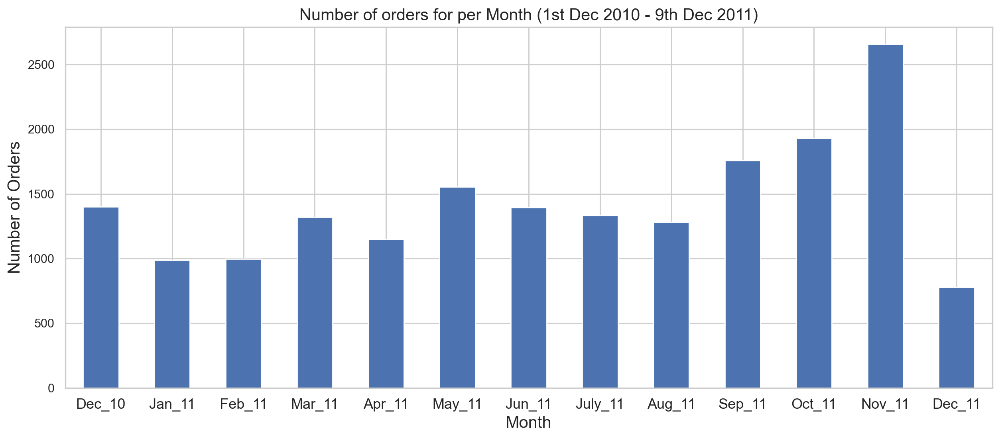

In [145]:
# Create a plot that shows the number of orders per month 
ax = df2.groupby('InvoiceNo')['year_month'].unique().value_counts().sort_index().plot(kind='bar',figsize=(15,6))
ax.set_xlabel('Month',fontsize=15)
ax.set_ylabel('Number of Orders',fontsize=15)
ax.set_title('Number of orders for per Month (1st Dec 2010 - 9th Dec 2011)',fontsize=15)
ax.set_xticklabels(('Dec_10','Jan_11','Feb_11','Mar_11','Apr_11','May_11','Jun_11','July_11','Aug_11','Sep_11','Oct_11','Nov_11','Dec_11'), rotation='horizontal', fontsize=13)
plt.show()

In [146]:
# Let's see number of orders per day of the week
df2.groupby('InvoiceNo')['dayofweek'].unique().value_counts().sort_index()

[1]    2863
[2]    3185
[3]    3455
[4]    4033
[5]    2831
[7]    2169
Name: dayofweek, dtype: int64

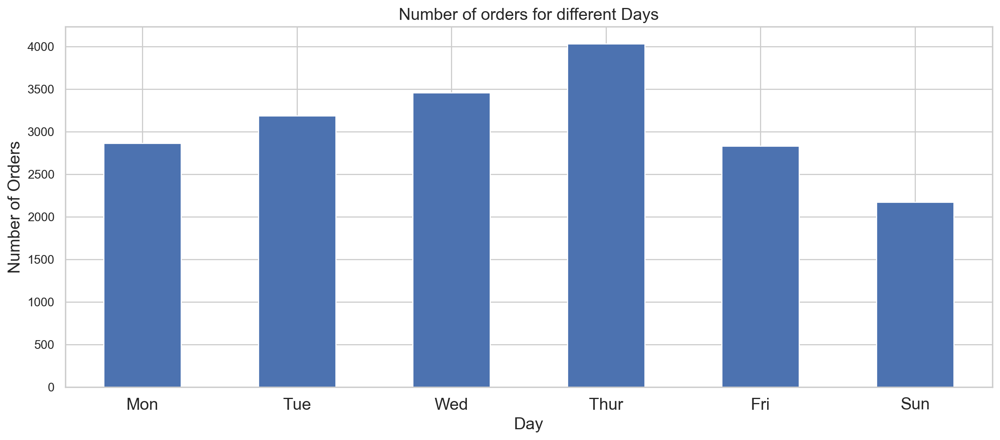

In [147]:
# Create a plot for the above
ax = df2.groupby('InvoiceNo')['dayofweek'].unique().value_counts().sort_index().plot(kind='bar',figsize=(15,6))
ax.set_xlabel('Day',fontsize=15)
ax.set_ylabel('Number of Orders',fontsize=15)
ax.set_title('Number of orders for different Days',fontsize=15)
ax.set_xticklabels(('Mon','Tue','Wed','Thur','Fri','Sun'), rotation='horizontal', fontsize=15)
plt.show()

In [148]:
df2.columns

Index(['InvoiceNo', 'StockCode', 'year_month', 'Description', 'Quantity',
       'hour', 'InvoiceDate', 'UnitPrice', 'CustomerID', 'Country',
       'AmountSpent', 'month_year', 'year', 'month', 'day', 'dayofweek',
       'dayofyear', 'weekofyear', 'quarter'],
      dtype='object')

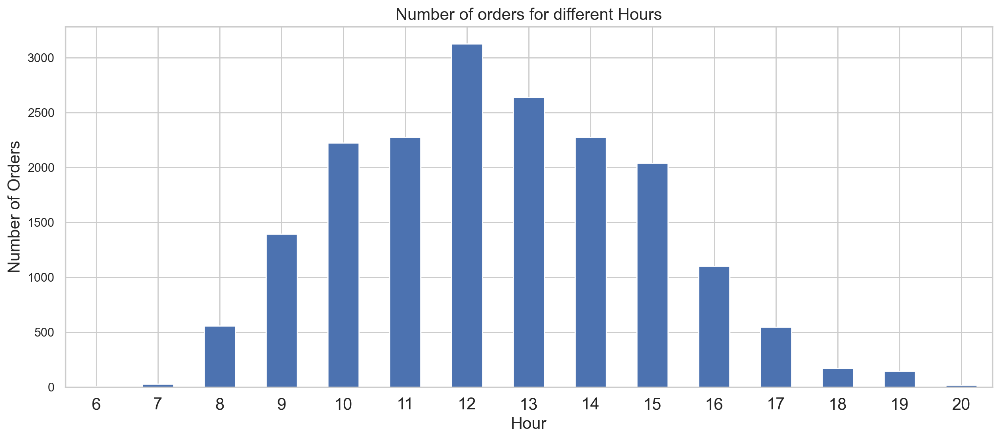

In [149]:
# Let's Plot the  number of orders per hour
ax = df2.groupby('InvoiceNo')['hour'].unique().value_counts().iloc[:-1].sort_index().plot(kind='bar',figsize=(15,6))
ax.set_xlabel('Hour',fontsize=15)
ax.set_ylabel('Number of Orders',fontsize=15)
ax.set_title('Number of orders for different Hours',fontsize=15)
ax.set_xticklabels(range(6,21), rotation='horizontal', fontsize=15)
plt.show()

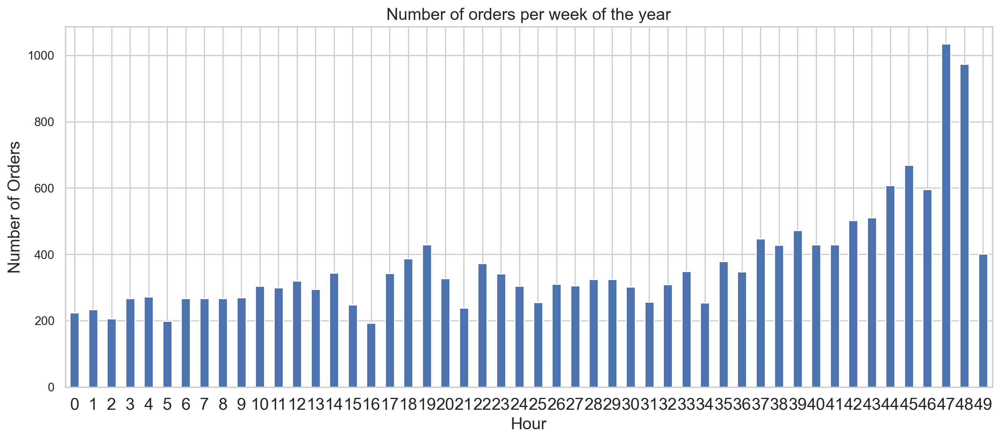

In [150]:
# Number of sales per week of the year
ax = df2.groupby('InvoiceNo')['weekofyear'].unique().value_counts().iloc[:-1].sort_index().plot(kind='bar',figsize=(15,6))
ax.set_xlabel('Hour',fontsize=15)
ax.set_ylabel('Number of Orders',fontsize=15)
ax.set_title('Number of orders per week of the year',fontsize=15)
ax.set_xticklabels(range(0,52), rotation='horizontal', fontsize=15)
plt.show()

#  Prices of our items

In [151]:
df2.UnitPrice.describe()

count    397924.000000
mean          3.116174
std          22.096788
min           0.000000
25%           1.250000
50%           1.950000
75%           3.750000
max        8142.750000
Name: UnitPrice, dtype: float64

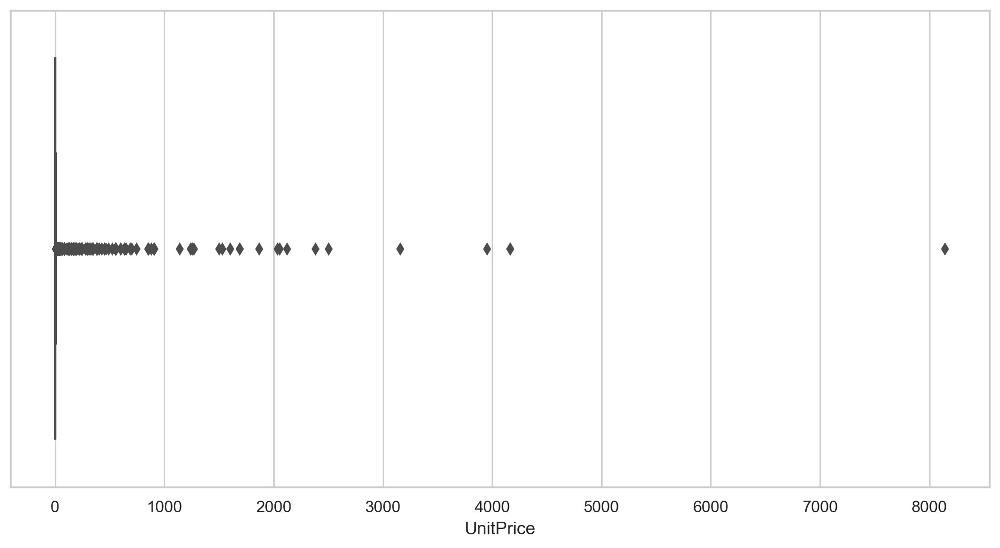

In [152]:
# check the distribution of unit price
plt.subplots(figsize=(12,6))
sns.boxplot(df2.UnitPrice)
plt.show()

In [153]:
# What are the free items
df_free = df2[df2.UnitPrice == 0]
print(len(df_free))
df_free.head()

40


,InvoiceNo,StockCode,year_month,Description,Quantity,hour,InvoiceDate,UnitPrice,CustomerID,Country,AmountSpent,month_year,year,month,day,dayofweek,dayofyear,weekofyear,quarter
9302,537197,22841,201012,ROUND CAKE TIN VINTAGE GREEN,1,14,2010-12-05 14:02:00,0.0,12647,Germany,0.0,2010-12,2010,12,5,7,339,48,4
33576,539263,22580,201012,ADVENT CALENDAR GINGHAM SACK,4,14,2010-12-16 14:36:00,0.0,16560,United Kingdom,0.0,2010-12,2010,12,16,4,350,50,4
40089,539722,22423,201012,REGENCY CAKESTAND 3 TIER,10,13,2010-12-21 13:45:00,0.0,14911,EIRE,0.0,2010-12,2010,12,21,2,355,51,4
47068,540372,22090,201101,PAPER BUNTING RETROSPOT,24,16,2011-01-06 16:41:00,0.0,13081,United Kingdom,0.0,2011-01,2011,1,6,4,6,1,1
47070,540372,22553,201101,PLASTERS IN TIN SKULLS,24,16,2011-01-06 16:41:00,0.0,13081,United Kingdom,0.0,2011-01,2011,1,6,4,6,1,1


In [154]:
# See when these free items were given out
df_free.year_month.value_counts().sort_index()

201012     3
201101     3
201102     1
201103     2
201104     2
201105     2
201107     2
201108     6
201109     2
201110     3
201111    14
Name: year_month, dtype: int64

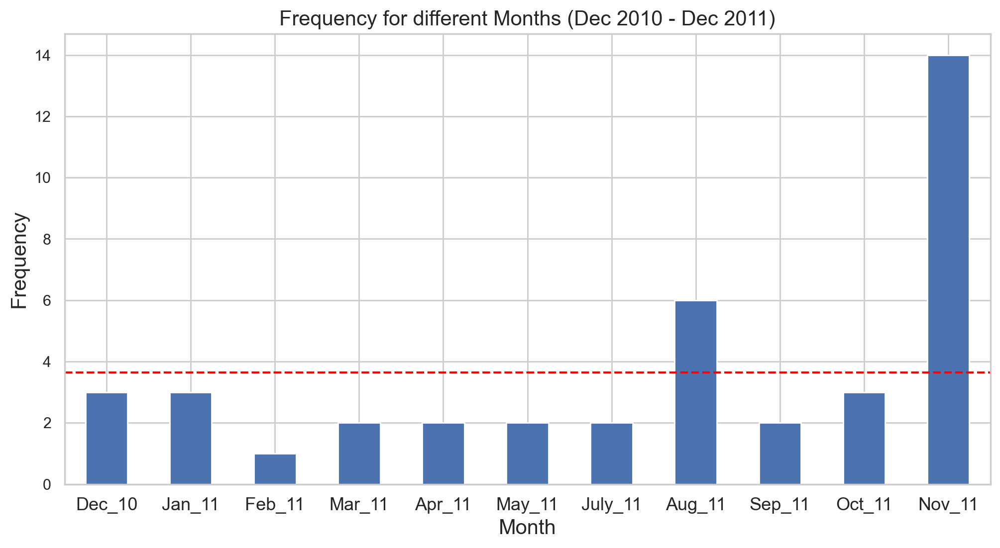

In [155]:
# Ploting the above data
ax = df_free.year_month.value_counts().sort_index().plot(kind='bar',figsize=(12,6))
ax.set_xlabel('Month',fontsize=15)
ax.set_ylabel('Frequency',fontsize=15)
# Add a horizontal line
ax.axhline(df_free.year_month.value_counts().mean(),
         linestyle="--",
         color="red");

ax.set_title('Frequency for different Months (Dec 2010 - Dec 2011)',fontsize=15)
ax.set_xticklabels(('Dec_10','Jan_11','Feb_11','Mar_11','Apr_11','May_11','July_11','Aug_11','Sep_11','Oct_11','Nov_11'), rotation='horizontal', fontsize=13)
plt.show()

On average, the company gave out 2-4 times FREE items to customers each month (Except in June 2011)

# Country

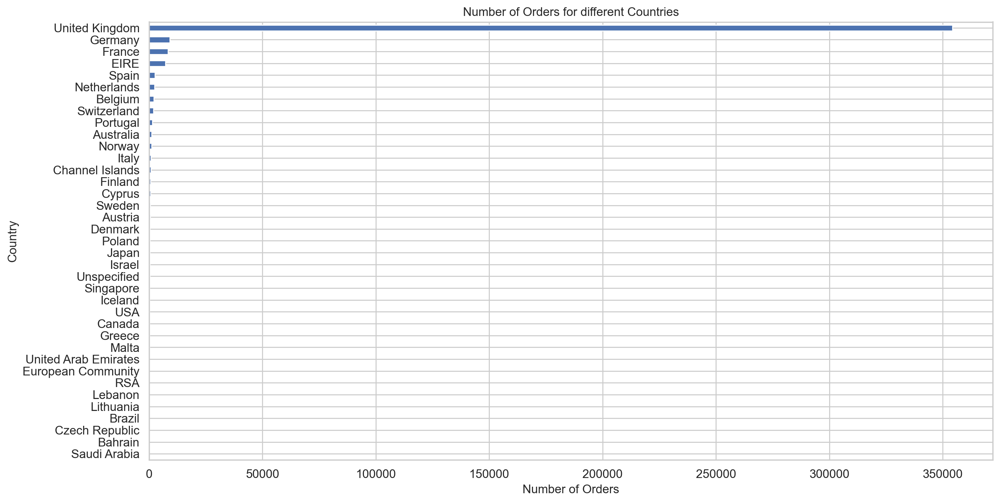

In [156]:
group_country_orders = df2.groupby('Country')['InvoiceDate'].count().sort_values()

# plot number of unique customers in each country (with UK)
plt.subplots(figsize=(15,8))
group_country_orders.plot(kind='barh', fontsize=12)
plt.xlabel('Number of Orders', fontsize=12)
plt.ylabel('Country', fontsize=12)
plt.title('Number of Orders for different Countries', fontsize=12)
plt.show()

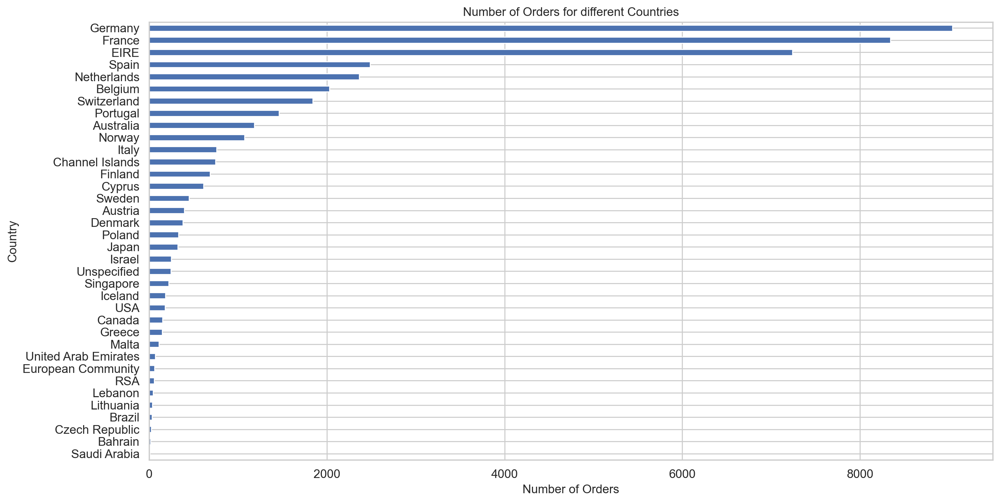

In [157]:
# Excluding UK now

group_country_orders = df2.groupby('Country')['InvoiceDate'].count().sort_values()
group_country_orders_without_uk = group_country_orders.copy()
del group_country_orders_without_uk['United Kingdom']

# plot number of unique customers in each country (without UK)
plt.subplots(figsize=(15,8))
group_country_orders_without_uk.plot(kind='barh', fontsize=12)
plt.xlabel('Number of Orders', fontsize=12)
plt.ylabel('Country', fontsize=12)
plt.title('Number of Orders for different Countries', fontsize=12)
plt.show()

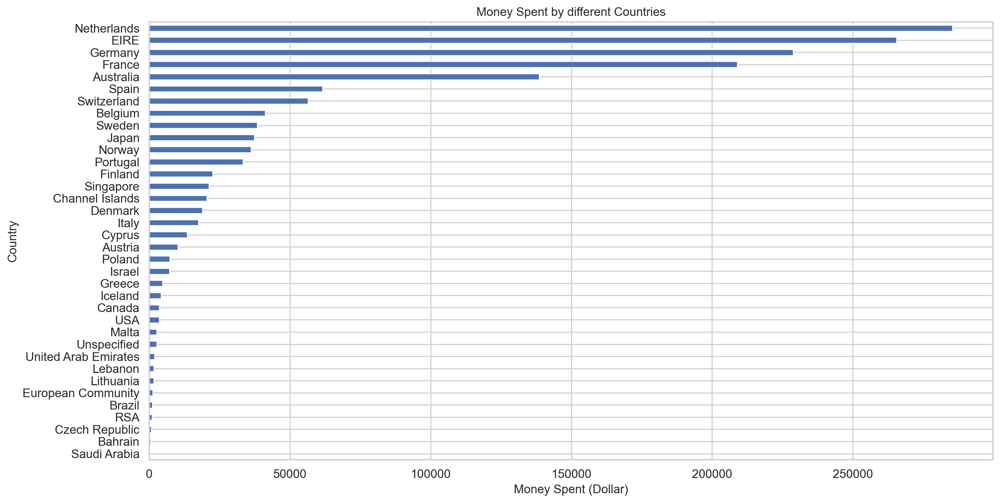

In [158]:
# Amount spent by each country (without UK)
group_country_amount_spent = df2.groupby('Country')['AmountSpent'].sum().sort_values()
del group_country_amount_spent['United Kingdom']

# plot total money spent by each country (without UK)
plt.subplots(figsize=(15,8))
group_country_amount_spent.plot(kind='barh', fontsize=12)
plt.xlabel('Money Spent (Dollar)', fontsize=12)
plt.ylabel('Country', fontsize=12)
plt.title('Money Spent by different Countries', fontsize=12)
plt.show()

# Repeat Customers

In [159]:
# Get our date range for our data
print('Date Range: %s to %s' % (df2['InvoiceDate'].min(), df2['InvoiceDate'].max()))

# Since Our data ends at Nov-30 2011, we're taking all of the transactions that occurred before December 01, 2011 
df2 = df2.loc[df2['InvoiceDate'] < '2011-12-01']

Date Range: 2010-12-01 08:26:00 to 2011-12-09 12:50:00


In [160]:
# Get total amount spent per invoice and associate it with CustomerID and Country
invoice_customer_df = df2.groupby(by=['InvoiceNo', 'InvoiceDate']).agg({'AmountSpent': sum, 'CustomerID': max,'Country': max,}).reset_index()
invoice_customer_df.head()

,InvoiceNo,InvoiceDate,AmountSpent,CustomerID,Country
0,536365,2010-12-01 08:26:00,139.12,17850,United Kingdom
1,536366,2010-12-01 08:28:00,22.20,17850,United Kingdom
2,536367,2010-12-01 08:34:00,278.73,13047,United Kingdom
3,536368,2010-12-01 08:34:00,70.05,13047,United Kingdom
4,536369,2010-12-01 08:35:00,17.85,13047,United Kingdom


In [161]:
# Sort on Amount spent, this gives us the largest invoices
invoice_customer_df.sort_values(by='AmountSpent', ascending=False).head(10)

,InvoiceNo,InvoiceDate,AmountSpent,CustomerID,Country
1911,541431,2011-01-18 10:01:00,77183.60,12346,United Kingdom
7949,556444,2011-06-10 15:28:00,38970.00,15098,United Kingdom
12446,567423,2011-09-20 11:05:00,31698.16,17450,United Kingdom
8135,556917,2011-06-15 13:37:00,22775.93,12415,Australia
14487,572209,2011-10-21 12:08:00,22206.00,18102,United Kingdom
12438,567381,2011-09-20 10:12:00,22104.80,17450,United Kingdom
10869,563614,2011-08-18 08:51:00,21880.44,12415,Australia
5481,550461,2011-04-18 13:20:00,21535.90,15749,United Kingdom
14399,572035,2011-10-20 12:03:00,20277.92,14646,Netherlands
10637,563076,2011-08-11 16:12:00,19150.66,14646,Netherlands


In [162]:
# We set our index to our invoice date
# And use Grouper(freq='M') groups data by the index 'InvoiceDate' by Month
# We then group this data by CustomerID and count the number of unique repeat customers for that month (data is the month end date)
# The filter fucntion allows us to subselect data by the rule in our lambda function i.e. those greater than 1 (repeat customers)

monthly_repeat_customers_df = invoice_customer_df.set_index('InvoiceDate').groupby([
  pd.Grouper(freq='M'), 'CustomerID']).filter(lambda x: len(x) > 1).resample('M').nunique()['CustomerID']

monthly_repeat_customers_df

InvoiceDate
2010-12-31    263
2011-01-31    153
2011-02-28    153
2011-03-31    203
2011-04-30    170
2011-05-31    281
2011-06-30    220
2011-07-31    227
2011-08-31    198
2011-09-30    272
2011-10-31    324
2011-11-30    541
Freq: M, Name: CustomerID, dtype: int64

In [163]:
# Number of Unique customers per month
monthly_unique_customers_df = df2.set_index('InvoiceDate')['CustomerID'].resample('M').nunique()
monthly_unique_customers_df

InvoiceDate
2010-12-31     885
2011-01-31     741
2011-02-28     758
2011-03-31     974
2011-04-30     856
2011-05-31    1056
2011-06-30     991
2011-07-31     949
2011-08-31     935
2011-09-30    1266
2011-10-31    1364
2011-11-30    1665
Freq: M, Name: CustomerID, dtype: int64

In [164]:
# Ratio of Repeat to Unique customers
monthly_repeat_percentage = monthly_repeat_customers_df/monthly_unique_customers_df*100.0
monthly_repeat_percentage

InvoiceDate
2010-12-31    29.717514
2011-01-31    20.647773
2011-02-28    20.184697
2011-03-31    20.841889
2011-04-30    19.859813
2011-05-31    26.609848
2011-06-30    22.199798
2011-07-31    23.919916
2011-08-31    21.176471
2011-09-30    21.484992
2011-10-31    23.753666
2011-11-30    32.492492
Freq: M, Name: CustomerID, dtype: float64

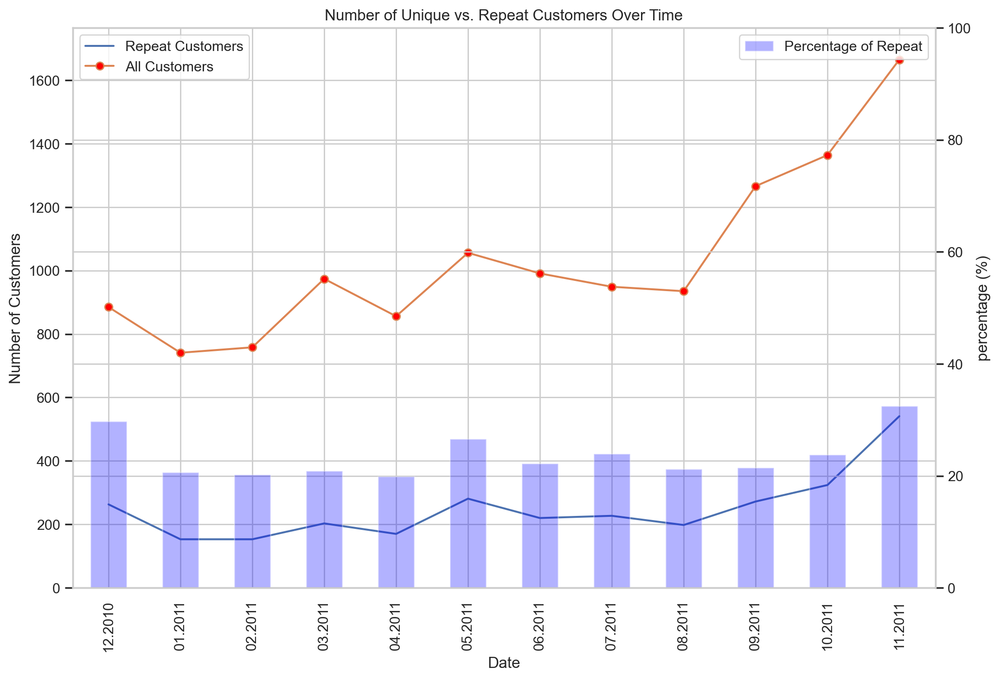

In [171]:
# Plotting this visually
# Note we're using a 2 scale y axis (left and right)

ax = pd.DataFrame(monthly_repeat_customers_df.values).plot(figsize=(12,8))

pd.DataFrame(monthly_unique_customers_df.values).plot(ax=ax,grid=True , marker="o", markerfacecolor="red")

ax2 = pd.DataFrame(monthly_repeat_percentage.values).plot.bar(ax=ax,grid=True,secondary_y=True,color='blue',alpha=0.3)

ax.set_xlabel('Date')
ax.set_ylabel('Number of Customers')
ax.set_title('Number of Unique vs. Repeat Customers Over Time')

ax2.set_ylabel('percentage (%)')

ax.legend(['Repeat Customers', 'All Customers'])
ax2.legend(['Percentage of Repeat'], loc='upper right')

ax.set_ylim([0, monthly_unique_customers_df.values.max()+100])
ax2.set_ylim([0, 100])

plt.xticks(range(len(monthly_repeat_customers_df.index)), [x.strftime('%m.%Y') for x in monthly_repeat_customers_df.index], rotation=45)

plt.show()

In [166]:
# Let's investigate the relationship between revenue and repeat customers
monthly_revenue_df = df2.set_index('InvoiceDate')['AmountSpent'].resample('M').sum()

monthly_rev_repeat_customers_df = invoice_customer_df.set_index('InvoiceDate').groupby([
    pd.Grouper(freq='M'), 'CustomerID']).filter(lambda x: len(x) > 1).resample('M').sum()['AmountSpent']

# Let's get a percentage of the revenue from repeat customers to the overall monthly revenue
monthly_rev_perc_repeat_customers_df = monthly_rev_repeat_customers_df/monthly_revenue_df * 100.0
monthly_rev_perc_repeat_customers_df

InvoiceDate
2010-12-31    62.713792
2011-01-31    39.007101
2011-02-28    42.767478
2011-03-31    44.901787
2011-04-30    41.661132
2011-05-31    55.732401
2011-06-30    56.911595
2011-07-31    52.904475
2011-08-31    49.141899
2011-09-30    52.544416
2011-10-31    55.229144
2011-11-30    61.436148
Freq: M, Name: AmountSpent, dtype: float64

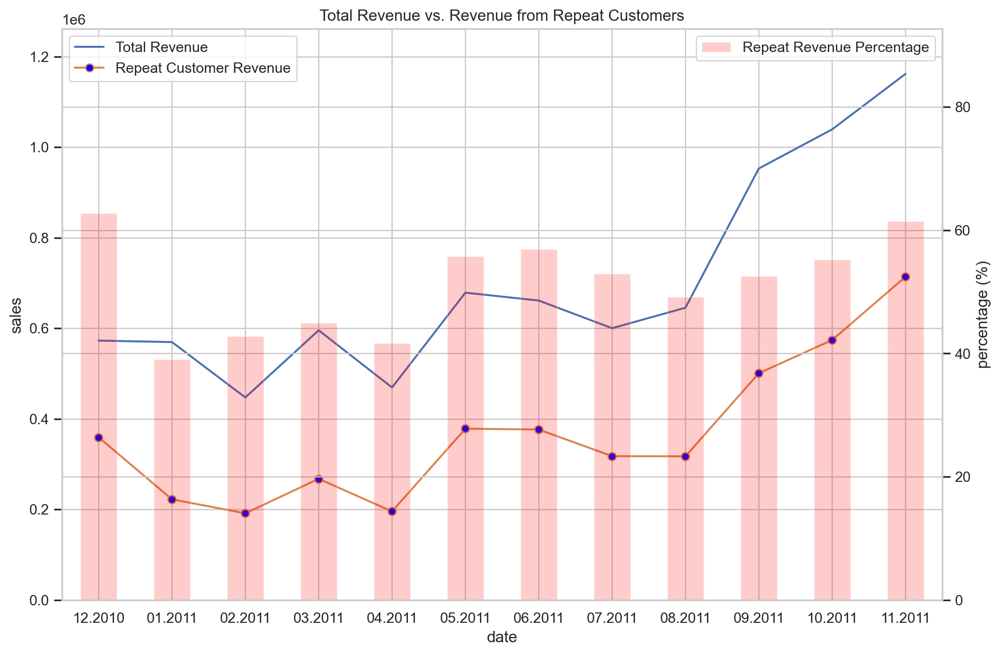

In [170]:
# Now let's plot this information we obtained above
ax = pd.DataFrame(monthly_revenue_df.values).plot(figsize=(12,8))

pd.DataFrame(monthly_rev_repeat_customers_df.values).plot(ax=ax,grid=True,marker="o"
                                                        ,markerfacecolor='blue')

ax.set_xlabel('date')
ax.set_ylabel('sales')
ax.set_title('Total Revenue vs. Revenue from Repeat Customers')

ax.legend(['Total Revenue', 'Repeat Customer Revenue'])

ax.set_ylim([0, max(monthly_revenue_df.values)+100000])

ax2 = ax.twinx()

pd.DataFrame(monthly_rev_perc_repeat_customers_df.values).plot(ax=ax2,kind='bar',color="red", alpha=0.2)

ax2.set_ylim([0, max(monthly_rev_perc_repeat_customers_df.values)+30])
ax2.set_ylabel('percentage (%)')
ax2.legend(['Repeat Revenue Percentage'])

ax2.set_xticklabels([x.strftime('%m.%Y') for x in monthly_rev_perc_repeat_customers_df.index])

plt.show()

# Chicago Crime Data

In [94]:
import warnings
warnings.filterwarnings("ignore")

In [95]:
df1 = pd.read_csv("../../data/Chicago_Crimes_2005_to_2007.csv" ,error_bad_lines=False)
df2 = pd.read_csv("../../data/Chicago_Crimes_2008_to_2011.csv" ,error_bad_lines=False)
df3 = pd.read_csv("../../data/Chicago_Crimes_2012_to_2017.csv" ,error_bad_lines=False)

b'Skipping line 533719: expected 23 fields, saw 24\n'
b'Skipping line 1149094: expected 23 fields, saw 41\n'


In [96]:
data2 = pd.concat([df1, df2, df3], ignore_index=False , axis=0)
data2.head()

,Unnamed: 0,ID,Case Number,Date,Block,IUCR,Primary Type,Description,Location Description,Arrest,...,Ward,Community Area,FBI Code,X Coordinate,Y Coordinate,Year,Updated On,Latitude,Longitude,Location
0,0,4673626,HM274058,04/02/2006 01:00:00 PM,055XX N MANGO AVE,2825,OTHER OFFENSE,HARASSMENT BY TELEPHONE,RESIDENCE,False,...,45.0,11.0,26,1136872.0,1936499.0,2006,04/15/2016 08:55:02 AM,41.981913,-87.771996,"(41.981912692, -87.771996382)"
1,1,4673627,HM202199,02/26/2006 01:40:48 PM,065XX S RHODES AVE,2017,NARCOTICS,MANU/DELIVER:CRACK,SIDEWALK,True,...,20.0,42.0,18,1181027.0,1861693.0,2006,04/15/2016 08:55:02 AM,41.775733,-87.611920,"(41.775732538, -87.611919814)"
2,2,4673628,HM113861,01/08/2006 11:16:00 PM,013XX E 69TH ST,051A,ASSAULT,AGGRAVATED: HANDGUN,OTHER,False,...,5.0,69.0,04A,1186023.0,1859609.0,2006,04/15/2016 08:55:02 AM,41.769897,-87.593671,"(41.769897392, -87.593670899)"
3,4,4673629,HM274049,04/05/2006 06:45:00 PM,061XX W NEWPORT AVE,0460,BATTERY,SIMPLE,RESIDENCE,False,...,38.0,17.0,08B,1134772.0,1922299.0,2006,04/15/2016 08:55:02 AM,41.942984,-87.780057,"(41.942984005, -87.780056951)"
4,5,4673630,HM187120,02/17/2006 09:03:14 PM,037XX W 60TH ST,1811,NARCOTICS,POSS: CANNABIS 30GMS OR LESS,ALLEY,True,...,13.0,65.0,18,1152412.0,1864560.0,2006,04/15/2016 08:55:02 AM,41.784211,-87.716745,"(41.784210853, -87.71674491)"


In [97]:
# ID Case Number Date Block IUCR Primary Type Description Location Description Arrest Domestic Beat District Ward Community Area FBI Code X Coordinate Y Coordinate Year Updated On Latitude Longitude Location
data2.drop(['Unnamed: 0', 'Case Number', 'Case Number', 'IUCR', 'X Coordinate', 'Y Coordinate','Updated On','Year', 'FBI Code', 'Beat','Ward','Community Area', 'Location', 'District', 'Latitude' , 'Longitude'], inplace=True, axis=1)

In [98]:
data2.Date

0          04/02/2006 01:00:00 PM
1          02/26/2006 01:40:48 PM
2          01/08/2006 11:16:00 PM
3          04/05/2006 06:45:00 PM
4          02/17/2006 09:03:14 PM
                    ...          
1456709    05/03/2016 11:33:00 PM
1456710    05/03/2016 11:30:00 PM
1456711    05/03/2016 12:15:00 AM
1456712    05/03/2016 09:07:00 PM
1456713    05/03/2016 11:38:00 PM
Name: Date, Length: 6017767, dtype: object

In [99]:
# Converting date to datetime format
data2.Date = pd.to_datetime(data2.Date , format="%m/%d/%Y %I:%M:%S %p")

In [100]:
data2.index = pd.DatetimeIndex(data2.Date)

In [101]:
data2["Primary Type"].value_counts()

THEFT                                1245111
BATTERY                              1079178
CRIMINAL DAMAGE                       702702
NARCOTICS                             674831
BURGLARY                              369056
OTHER OFFENSE                         368169
ASSAULT                               360244
MOTOR VEHICLE THEFT                   271624
ROBBERY                               229467
DECEPTIVE PRACTICE                    225180
CRIMINAL TRESPASS                     171596
PROSTITUTION                           60735
WEAPONS VIOLATION                      60335
PUBLIC PEACE VIOLATION                 48403
OFFENSE INVOLVING CHILDREN             40260
CRIM SEXUAL ASSAULT                    22789
SEX OFFENSE                            20172
GAMBLING                               14755
INTERFERENCE WITH PUBLIC OFFICER       14009
LIQUOR LAW VIOLATION                   12129
ARSON                                   9269
HOMICIDE                                5879
KIDNAPPING

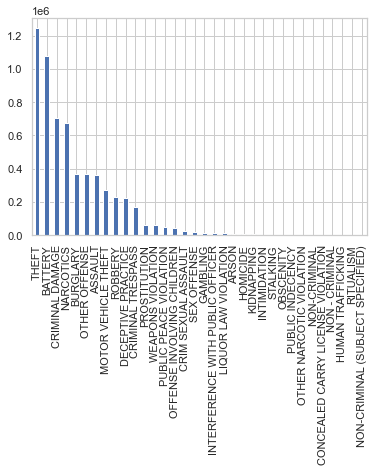

In [102]:
data2["Primary Type"].value_counts().plot(kind="bar")

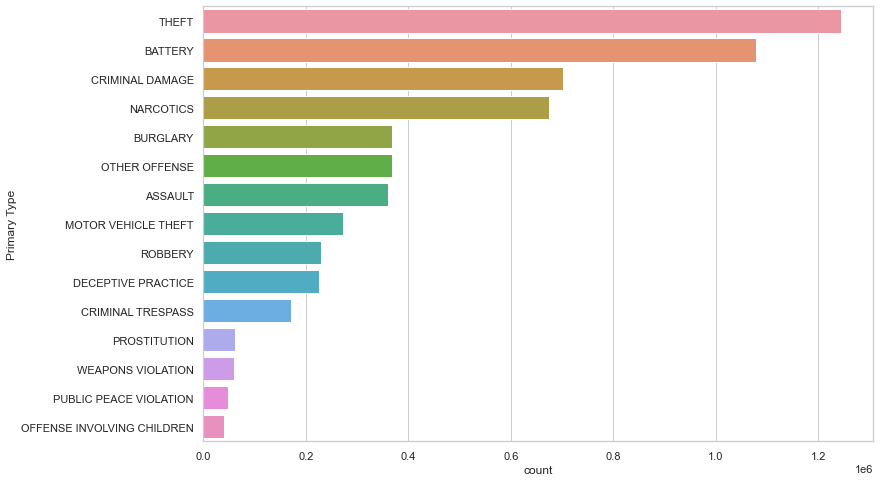

In [103]:
# improving the above plot
plt.figure(figsize= (12, 8))
sns.countplot(y = "Primary Type", data=data2, order= data2["Primary Type"].value_counts().iloc[:15].index)
plt.show()  

In [ ]:
# Location Description

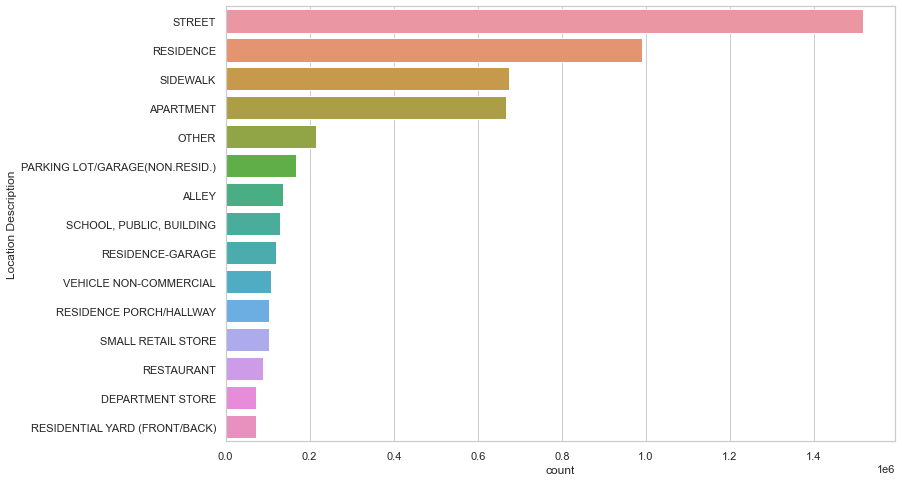

In [104]:
plt.figure(figsize= (12, 8))
sns.countplot(y = "Location Description", data=data2, order= data2["Location Description"].value_counts().iloc[:15].index)
plt.show()

In [ ]:
# Advanced Plots fro Titanic Data

In [62]:
titanic = sns.load_dataset('titanic')
titanic.head()

,survived,pclass,sex,age,sibsp,parch,fare,embarked,class,who,adult_male,deck,embark_town,alive,alone
0,0,3,male,22.0,1,0,7.2500,S,Third,man,True,NaN,Southampton,no,False
1,1,1,female,38.0,1,0,71.2833,C,First,woman,False,C,Cherbourg,yes,False
2,1,3,female,26.0,0,0,7.9250,S,Third,woman,False,NaN,Southampton,yes,True
3,1,1,female,35.0,1,0,53.1000,S,First,woman,False,C,Southampton,yes,False
4,0,3,male,35.0,0,0,8.0500,S,Third,man,True,NaN,Southampton,no,True


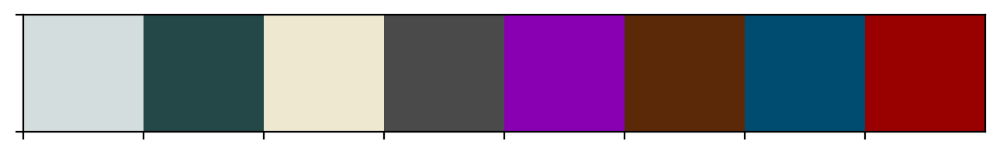

In [66]:
sns.palplot(['#d4dddd', '#244747', '#efe8d1', '#4a4a4a','#8800B2','#5b2907',"#004c70","#990000"])

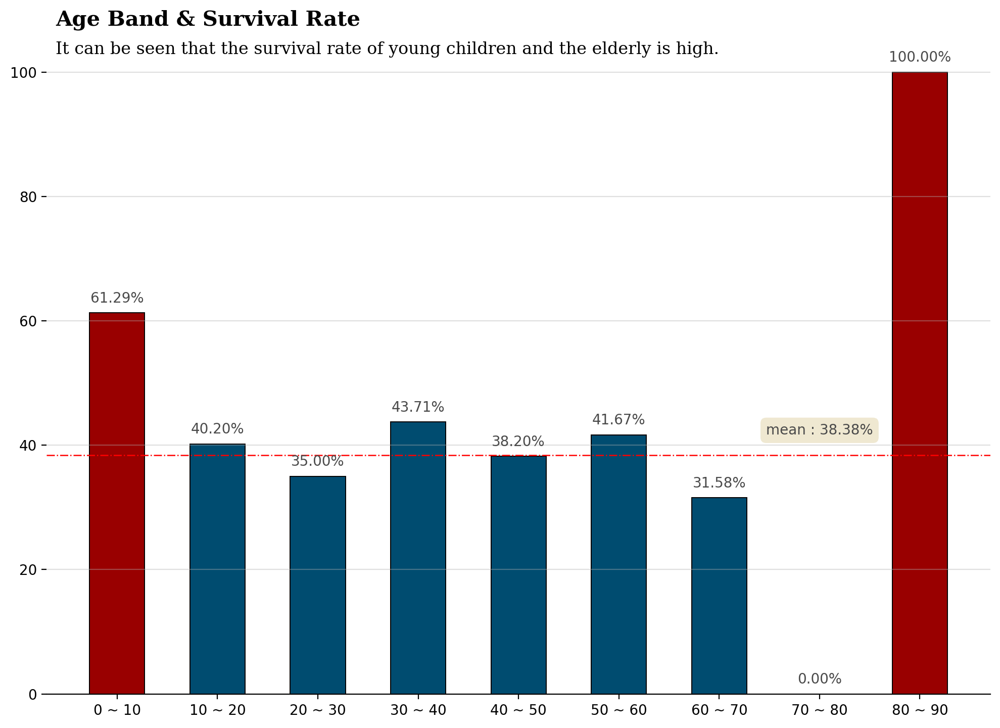

In [73]:
def age_band(num):
    for i in range(1, 100):
        if num < 10*i :  return f'{(i-1) * 10} ~ {i*10}'

titanic['age_band'] = titanic['age'].apply(age_band)
titanic_age = titanic[['age_band', 'survived']].groupby('age_band')['survived'].value_counts().sort_index().unstack().fillna(0)
titanic_age['Survival rate'] = titanic_age[1] / (titanic_age[0] + titanic_age[1]) * 100

fig, ax = plt.subplots(1, 1, figsize=(10, 7))

color_map = ['#004c70' for _ in range(9)]
color_map[0] = color_map[8] = '#990000' # color highlight

ax.bar(titanic_age['Survival rate'].index, titanic_age['Survival rate'], 
       color=color_map, width=0.55, 
       edgecolor='black', 
       linewidth=0.7)



for s in ["top","right","left"]:
    ax.spines[s].set_visible(False)


# Annotation Part
for i in titanic_age['Survival rate'].index:
    ax.annotate(f"{titanic_age['Survival rate'][i]:.02f}%", 
                   xy=(i, titanic_age['Survival rate'][i] + 2.3),
                   va = 'center', ha='center',fontweight='light', 
                   color='#4a4a4a')


# mean line + annotation
mean = titanic['survived'].mean() *100
ax.axhline(mean ,color='red', linewidth=0.9, linestyle='dashdot')
ax.annotate(f"mean : {mean :.4}%", 
            xy=('70 ~ 80', mean + 4),
            va = 'center', ha='center',
            color='#4a4a4a',
            bbox=dict(boxstyle='round', pad=0.4, facecolor='#efe8d1', linewidth=0))
    

# Title & Subtitle    
fig.text(0.06, 1, 'Age Band & Survival Rate', fontsize=15, fontweight='bold', fontfamily='serif')
fig.text(0.06, 0.96, 'It can be seen that the survival rate of young children and the elderly is high.', fontsize=12, fontweight='light', fontfamily='serif')

grid_y_ticks = np.arange(0, 101, 20)
ax.set_yticks(grid_y_ticks)
ax.grid(axis='y', linestyle='-',alpha=0.4)

plt.tight_layout()
plt.show()

In [81]:
os.getcwd()

'/Users/flatironschool/Desktop/iNueron/Introduction-to-Python/01.Session1/Part 7 - Data_Visualization/03.Visualisation-20_Exercises'